# ANALYSIS ON HIGHEST CRIMES COMMITTED IN NYC

## Introduction

The proposed project will result in using the databse of the NYC Crimes, and has the following parameters to analyze at what time, which kind of offense occured and at which location. Features in our dataset like:
* Date
* Time
* Offence code
* Offence description
* Offence Level
* Borough (town)
* Premise description
* Latitude, Longitude

relating to the crime rate and type across time as well as space. We have performed EDA, some time-series analysis, Clustered the data to implement classification algorithms on it. 

## Project Motivation

### Why do this analysis?

We are doing this analysis to show a relation between several factors that come down with the crime rates in a particular area.
* This data can be ralated with the housing data in NYC and see how the crime rates affect poeple buying/not buying a house in that area
* With the data, we can create a mobile application or a website which shows end-users where most crimes have occurred in the city based on location, time, and offence description 
* Using maps we can show them the exact location where the crime has occurred based on latitude, longitude
* The output of this data can be useful for the cops(NYPD) to do patrolling or carry out some investigation 

## Potential Stakeholders


* This analysis will be useful for the general public to track areas and be sure which areas are safe to buy a house, or party at night, or send their kids to school, walk around, etc. 
* NYPD can carry out investigation based on this data and our final analysis 
* Government of the US (or NYC per say) can use this analysis to take measures in order to make the crime targeted areas safer

## Limitations

* We are using NYPD dataset from kaggle website which has the data until the year 2015. They have created this data from NYC open data. NYC open data has NYPD Complaint data history until 2018. As we are using 3 years data, our analysis is limited to a year but it could be improved if we used the whole dataset from NYC open data.
* Also, down our analysis, we figured that the data before 2013 is insignificant to our analysis, probably because of the fact that not many crimes were reported before 2013, so we masked the data we needed. This could influence our analysis, given that we are just using 3 years of data (2013-2015).

## Technical Scoping 

In order to determine the feasibility of the proposed project, technical scoping was conducted which basically gave us a cleaned NYC Crimes dataset to pickle and work on.

In [105]:
import pandas as pd
import numpy as np
import re
from collections import Counter
from pprint import pprint
%matplotlib inline
from matplotlib import pyplot as plt
import collections
from datetime import datetime
from dateutil.parser import *
from matplotlib.dates import date2num
import datetime
import random
import csv
import json
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import LabelEncoder

In [108]:
hist_df = pd.read_csv("data/NYPD_Complaint_Data_Historic.csv")

In [109]:
hist_df.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,RPT_DT,KY_CD,OFNS_DESC,PD_CD,PD_DESC,...,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,PARKS_NM,HADEVELOPT,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,101109527,12/31/2015,23:45:00,NaN,NaN,12/31/2015,113,FORGERY,729.0,"FORGERY,ETC.,UNCLASSIFIED-FELO",...,44.0,INSIDE,BAR/NIGHT CLUB,NaN,NaN,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)"
1,153401121,12/31/2015,23:36:00,NaN,NaN,12/31/2015,101,MURDER & NON-NEGL. MANSLAUGHTER,NaN,NaN,...,103.0,OUTSIDE,NaN,NaN,NaN,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)"
2,569369778,12/31/2015,23:30:00,NaN,NaN,12/31/2015,117,DANGEROUS DRUGS,503.0,"CONTROLLED SUBSTANCE,INTENT TO",...,28.0,NaN,OTHER,NaN,NaN,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)"
3,968417082,12/31/2015,23:30:00,NaN,NaN,12/31/2015,344,ASSAULT 3 & RELATED OFFENSES,101.0,ASSAULT 3,...,105.0,INSIDE,RESIDENCE-HOUSE,NaN,NaN,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)"
4,641637920,12/31/2015,23:25:00,12/31/2015,23:30:00,12/31/2015,344,ASSAULT 3 & RELATED OFFENSES,101.0,ASSAULT 3,...,13.0,FRONT OF,OTHER,NaN,NaN,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)"


### Cleaning the data of NYC Crimes

In [5]:
hist_df['CMPLNT_TO_DT'].fillna(hist_df['CMPLNT_FR_DT'], axis = 0, inplace = True)
hist_df['CMPLNT_FR_DT'].fillna(hist_df['CMPLNT_TO_DT'], axis = 0, inplace = True)

# # Fill CMPLNT_TO_TM NaNs with CMPLNT_FR_TM values.
hist_df['CMPLNT_TO_TM'].fillna(hist_df['CMPLNT_FR_TM'], axis = 0, inplace = True)
hist_df['CMPLNT_FR_TM'].fillna(hist_df['CMPLNT_TO_TM'], axis = 0, inplace = True)

hist_df["LOC_OF_OCCUR_DESC"].fillna(value = 'INSIDE' , axis = 0 , inplace = True)

In [6]:
hist_df['OFNS_DESC'] = np.where(hist_df['OFNS_DESC'].isnull(), hist_df['PD_DESC'], hist_df['OFNS_DESC']) 
hist_df['PD_DESC'] = np.where(hist_df['PD_DESC'].isnull(), hist_df['OFNS_DESC'], hist_df['PD_DESC'])

hist_df['PREM_TYP_DESC'] = hist_df['PREM_TYP_DESC'].\
                            apply(lambda x: np.random.choice\
                                  ([x for x in hist_df.prem_typ_desc],
                          replace = True, p = prem_typ_desc_copy_rand ) \
                                  if (x == np.nan) else x).astype(str)

In [7]:
hist_df.isnull().sum()

CMPLNT_NUM                 0
CMPLNT_FR_DT              14
CMPLNT_FR_TM               0
CMPLNT_TO_DT              14
CMPLNT_TO_TM               0
RPT_DT                     0
KY_CD                      0
OFNS_DESC                  0
PD_CD                    733
PD_DESC                    0
CRM_ATPT_CPTD_CD           1
LAW_CAT_CD                 0
JURIS_DESC                 0
BORO_NM                    0
ADDR_PCT_CD                1
LOC_OF_OCCUR_DESC          0
PREM_TYP_DESC              0
PARKS_NM             1040976
HADEVELOPT            996803
X_COORD_CD             32417
Y_COORD_CD             32417
Latitude               32417
Longitude              32417
Lat_Lon                32417
dtype: int64

In [8]:
hist_df["PD_CD"] = hist_df["PD_CD"].apply(lambda v: random.random())

dfh = hist_df.drop(columns =["HADEVELOPT" , "PARKS_NM", 'CMPLNT_TO_DT',
      'CMPLNT_TO_TM', 'RPT_DT'])
dfh

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,KY_CD,OFNS_DESC,PD_CD,PD_DESC,CRM_ATPT_CPTD_CD,LAW_CAT_CD,JURIS_DESC,BORO_NM,ADDR_PCT_CD,LOC_OF_OCCUR_DESC,PREM_TYP_DESC,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
0,101109527,12/31/2015,23:45:00,113,FORGERY,0.382441,"FORGERY,ETC.,UNCLASSIFIED-FELO",COMPLETED,FELONY,N.Y. POLICE DEPT,BRONX,44.0,INSIDE,BAR/NIGHT CLUB,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)"
1,153401121,12/31/2015,23:36:00,101,MURDER & NON-NEGL. MANSLAUGHTER,0.919818,MURDER & NON-NEGL. MANSLAUGHTER,COMPLETED,FELONY,N.Y. POLICE DEPT,QUEENS,103.0,OUTSIDE,nan,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)"
2,569369778,12/31/2015,23:30:00,117,DANGEROUS DRUGS,0.708306,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,MANHATTAN,28.0,INSIDE,OTHER,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)"
3,968417082,12/31/2015,23:30:00,344,ASSAULT 3 & RELATED OFFENSES,0.165127,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,QUEENS,105.0,INSIDE,RESIDENCE-HOUSE,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)"
4,641637920,12/31/2015,23:25:00,344,ASSAULT 3 & RELATED OFFENSES,0.293719,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,13.0,FRONT OF,OTHER,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)"
5,365661343,12/31/2015,23:18:00,106,FELONY ASSAULT,0.644266,"ASSAULT 2,1,UNCLASSIFIED",ATTEMPTED,FELONY,N.Y. POLICE DEPT,BROOKLYN,71.0,FRONT OF,DRUG STORE,996149.0,181562.0,40.665023,-73.957111,"(40.665022689, -73.957110763)"
6,608231454,12/31/2015,23:15:00,235,DANGEROUS DRUGS,0.792144,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,7.0,OPPOSITE OF,STREET,987373.0,201662.0,40.720200,-73.988735,"(40.720199996, -73.988735082)"
7,265023856,12/31/2015,23:15:00,118,DANGEROUS WEAPONS,0.546621,WEAPONS POSSESSION 1 & 2,COMPLETED,FELONY,N.Y. POLICE DEPT,BRONX,46.0,FRONT OF,STREET,1009041.0,247401.0,40.845707,-73.910398,"(40.845707148, -73.910398033)"
8,989238731,12/31/2015,23:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.455588,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,BRONX,48.0,INSIDE,RESIDENCE - APT. HOUSE,1014154.0,251416.0,40.856711,-73.891900,"(40.856711291, -73.891899956)"
9,415095955,12/31/2015,23:10:00,341,PETIT LARCENY,0.964842,"LARCENY,PETIT FROM BUILDING,UN",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,19.0,INSIDE,DRUG STORE,994327.0,218211.0,40.765618,-73.963623,"(40.765617688, -73.96362342)"


In [9]:
#renaming the columns

dfh.rename(columns={'CMPLNT_NUM':'ComplaintID', 'CMPLNT_FR_DT':'Date','CMPLNT_FR_TM':'Time',
                    "KY_CD":"Offence Code",'OFNS_DESC':'Description','PD_CD':'Internal Code',
                    'PD_DESC':'Internal Description', 'CRM_ATPT_CPTD_CD':'Status',
                    'LAW_CAT_CD':'Offence Level',
                    'JURIS_DESC' : 'Jurisdiction',
                    'BORO_NM':'Borough',
                    'ADDR_PCT_CD':'Precinct Area',
                    'PREM_TYP_DESC':'Premise Description',
                    'X_COORD_CD' : 'X-coord',
                    'Y_COORD_CD': 'Y-coord',
                    'LOC_OF_OCCUR_DESC': 'Location'}, inplace=True)

dfh.head()

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,Borough,Precinct Area,Location,Premise Description,X-coord,Y-coord,Latitude,Longitude,Lat_Lon
0,101109527,12/31/2015,23:45:00,113,FORGERY,0.382441,"FORGERY,ETC.,UNCLASSIFIED-FELO",COMPLETED,FELONY,N.Y. POLICE DEPT,BRONX,44.0,INSIDE,BAR/NIGHT CLUB,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)"
1,153401121,12/31/2015,23:36:00,101,MURDER & NON-NEGL. MANSLAUGHTER,0.919818,MURDER & NON-NEGL. MANSLAUGHTER,COMPLETED,FELONY,N.Y. POLICE DEPT,QUEENS,103.0,OUTSIDE,nan,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)"
2,569369778,12/31/2015,23:30:00,117,DANGEROUS DRUGS,0.708306,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,MANHATTAN,28.0,INSIDE,OTHER,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)"
3,968417082,12/31/2015,23:30:00,344,ASSAULT 3 & RELATED OFFENSES,0.165127,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,QUEENS,105.0,INSIDE,RESIDENCE-HOUSE,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)"
4,641637920,12/31/2015,23:25:00,344,ASSAULT 3 & RELATED OFFENSES,0.293719,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,13.0,FRONT OF,OTHER,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)"


In [10]:
def try_float(x):
    try:
        float(x)
        return True
    except:
        return False

dfa = dfh.loc[~dfh.Date.apply(try_float)]

In [11]:
dfh1 = dfa
def which_year(data):
    year = Counter()
    for x in data['Date']:
        z = x.split('/',2)[2]
        year[z] += 1
    return year

In [12]:
year_counter = which_year(dfa)
pprint(year_counter)

Counter({'2014': 490394,
         '2015': 468591,
         '2013': 86167,
         '2012': 1229,
         '2011': 578,
         '2010': 357,
         '2009': 242,
         '2008': 218,
         '2006': 139,
         '2007': 135,
         '2004': 107,
         '2005': 100,
         '2001': 49,
         '2003': 46,
         '2002': 43,
         '2000': 25,
         '1999': 13,
         '1997': 13,
         '1914': 10,
         '1992': 8,
         '1995': 8,
         '1993': 8,
         '1015': 7,
         '1996': 7,
         '1915': 7,
         '1990': 4,
         '1975': 4,
         '1989': 4,
         '1986': 4,
         '1998': 4,
         '1974': 4,
         '1979': 3,
         '1991': 3,
         '1994': 3,
         '1913': 3,
         '1982': 2,
         '1965': 2,
         '1987': 2,
         '1955': 2,
         '1988': 2,
         '1969': 1,
         '1981': 1,
         '1950': 1,
         '1978': 1,
         '1910': 1,
         '1958': 1,
         '1977': 1,
         '1980': 1,


In [13]:
year_sort = collections.OrderedDict(sorted(year_counter.items()))

year_sort

OrderedDict([('1015', 7),
             ('1910', 1),
             ('1913', 3),
             ('1914', 10),
             ('1915', 7),
             ('1930', 1),
             ('1941', 1),
             ('1945', 1),
             ('1950', 1),
             ('1954', 1),
             ('1955', 2),
             ('1958', 1),
             ('1965', 2),
             ('1969', 1),
             ('1971', 1),
             ('1973', 1),
             ('1974', 4),
             ('1975', 4),
             ('1977', 1),
             ('1978', 1),
             ('1979', 3),
             ('1980', 1),
             ('1981', 1),
             ('1982', 2),
             ('1986', 4),
             ('1987', 2),
             ('1988', 2),
             ('1989', 4),
             ('1990', 4),
             ('1991', 3),
             ('1992', 8),
             ('1993', 8),
             ('1994', 3),
             ('1995', 8),
             ('1996', 7),
             ('1997', 13),
             ('1998', 4),
             ('1999', 13),
         

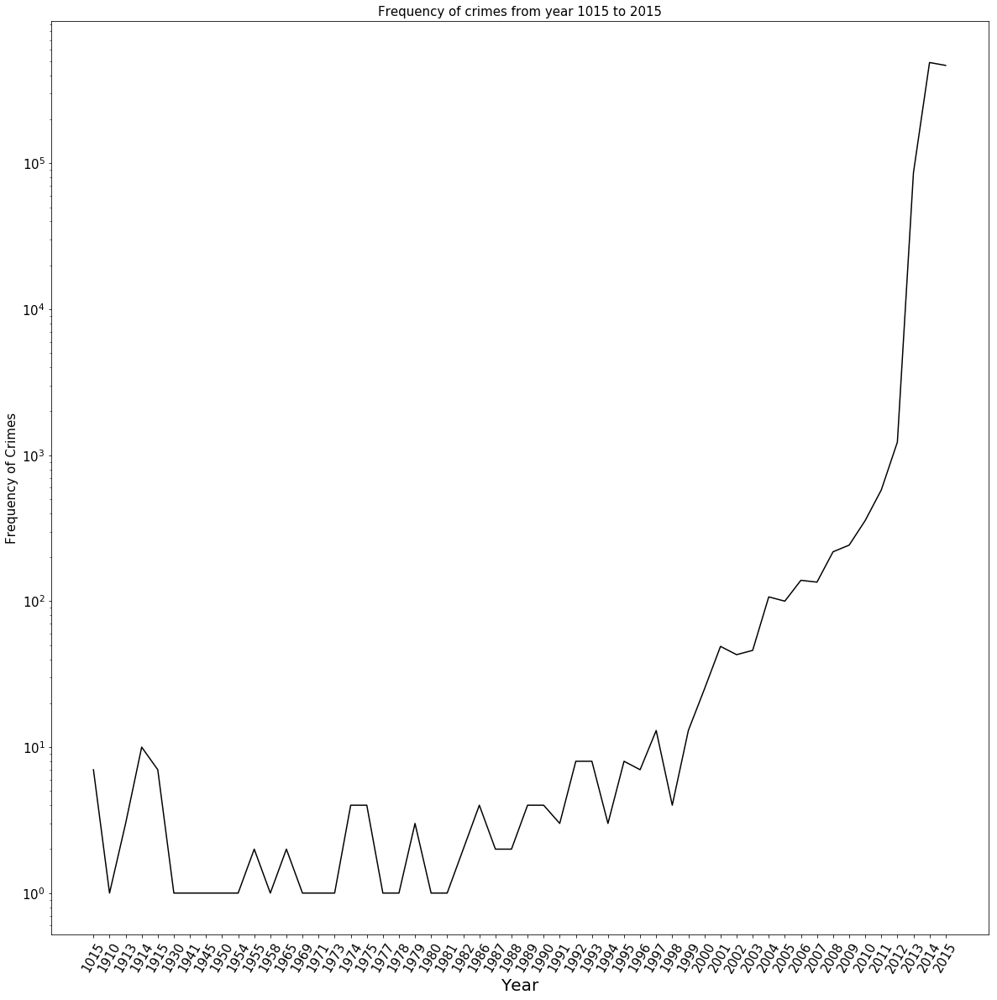

In [14]:
## set the figure dimensions
line_fig = plt.figure(figsize = (20, 20))
    
## make a line plot
_  = plt.plot(year_sort.keys(), year_sort.values(), color = "black")

_ = plt.yscale('log', nonposy = 'clip')

## Set the tick and label fontsize
plt.tick_params(labelsize = 15)

## Set the title
_ = plt.title("Frequency of crimes from year 1015 to 2015", fontsize = 15)

## Set the y-label
_ = plt.ylabel("Frequency of Crimes", fontsize = 15)

## Set the x-label
_ = plt.xlabel("Year", fontsize = 20)

_ = plt.xticks(rotation = 60)

In [15]:
#Since the data from 1015 to 2012 is is insignificant, we can probably infer from this analysis that not all crimes were reported during these years in NYC. 
#Therefore, we will remove the data from 1015 to 2012 and mask and keep only the significant data during the years 2013-2015.

In [16]:
def remove_years(data):
    remove_list = []
    consider_years = ['2013','2014','2015']
    for x,y in zip(data['Date'], data.index):
        z = x.split('/',2)[2]
        if z not in consider_years:
            remove_list.append(y)
    dl = dfa.drop(remove_list)
    return(dl)

In [17]:
dfa = remove_years(dfa)
print("Total len after removing: "+str(len(dfa)))
print(which_year(dfa))

Total len after removing: 1045152
Counter({'2014': 490394, '2015': 468591, '2013': 86167})


In [18]:
#Getting the frequency of crimes, and which crime occurred the most number of times

desc = Counter()
for d in dfh1['Description']:
    desc[d] += 1;
pprint(desc)
len(desc)

Counter({'PETIT LARCENY': 180244,
         'HARRASSMENT 2': 133177,
         'ASSAULT 3 & RELATED OFFENSES': 114429,
         'CRIMINAL MISCHIEF & RELATED OF': 102769,
         'GRAND LARCENY': 96230,
         'DANGEROUS DRUGS': 56868,
         'OFF. AGNST PUB ORD SENSBLTY &': 44769,
         'FELONY ASSAULT': 43920,
         'ROBBERY': 36800,
         'BURGLARY': 34994,
         'MISCELLANEOUS PENAL LAW': 29221,
         'DANGEROUS WEAPONS': 22953,
         'OFFENSES AGAINST PUBLIC ADMINI': 21353,
         'GRAND LARCENY OF MOTOR VEHICLE': 16223,
         'INTOXICATED & IMPAIRED DRIVING': 15169,
         'VEHICLE AND TRAFFIC LAWS': 13050,
         'SEX CRIMES': 11780,
         'FORGERY': 10591,
         'THEFT-FRAUD': 10472,
         'CRIMINAL TRESPASS': 10292,
         'FRAUDS': 7861,
         'POSSESSION OF STOLEN PROPERTY': 4928,
         'UNAUTHORIZED USE OF A VEHICLE': 3555,
         'OTHER OFFENSES RELATED TO THEF': 3081,
         'RAPE': 2978,
         'OFFENSES INVOLVING FRAUD

82

In [19]:
# Plotting a bar graph for the frequency of each crime during the years 2013-2015

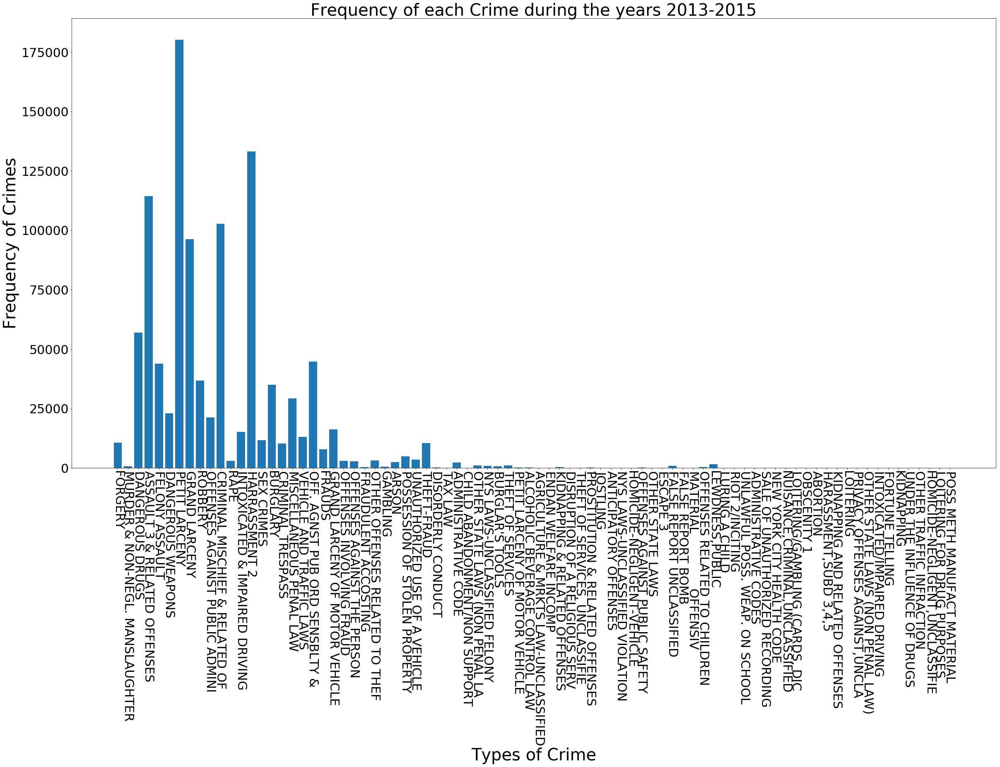

In [20]:
bar_fig = plt.figure(figsize = (40, 20))
    
_  = plt.bar(
    x = range(1, len(desc) + 1),
    height = list(desc.values()),
    tick_label = list(desc.keys())
)

## Set the tick and label fontsize
plt.tick_params(labelsize = 30)

## Set the title
_ = plt.title("Frequency of each Crime during the years 2013-2015", fontsize = 40)

## Set the x-label
_ = plt.xlabel("Types of Crime", fontsize = 40)

## Set the y-label
_ = plt.ylabel("Frequency of Crimes", fontsize = 40)

_ = plt.xticks(rotation = 270)

In [21]:
desc.most_common(1)

[('PETIT LARCENY', 180244)]

In [22]:
#Getting the frequency of crimes in each Borough

my_list = []
for i in dfh1['Borough']:
    my_list.append(i)
boro = Counter(my_list)
pprint(boro)

Counter({'BROOKLYN': 315644,
         'MANHATTAN': 244747,
         'BRONX': 227473,
         'QUEENS': 211954,
         'STATEN ISLAND': 48743})


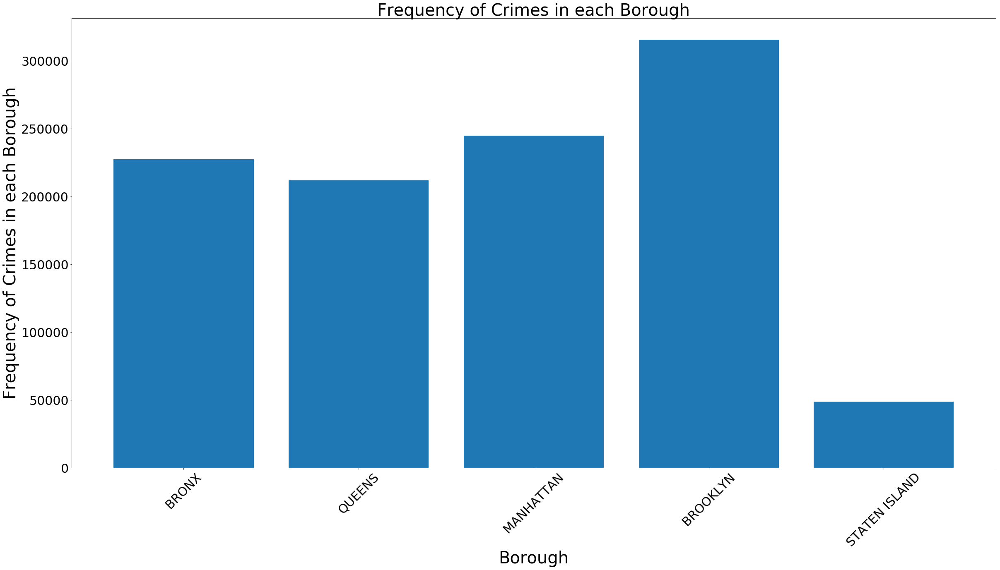

In [23]:
# Plotting a bar graph for the frequency of crimes in each Borough

bar_fig = plt.figure(figsize = (40, 20))
    
_  = plt.bar(
    x = range(1, len(boro) + 1),
    height = list(boro.values()),
    tick_label = list(boro.keys())
)

## Set the tick and label fontsize
plt.tick_params(labelsize = 30)

## Set the title
_ = plt.title("Frequency of Crimes in each Borough", fontsize = 40)

## Set the x-label
_ = plt.xlabel("Borough", fontsize = 40)

## Set the y-label
_ = plt.ylabel("Frequency of Crimes in each Borough", fontsize = 40)

_ = plt.xticks(rotation = 45)

In [24]:
boro.most_common(1)

[('BROOKLYN', 315644)]

In [25]:
#Frequency of crimes in each premise
premise = Counter()
for p in dfh1['Premise Description']:
    premise[p] += 1;
pprint(premise)
print(len(premise))
premise.most_common(1)

Counter({'STREET': 320259,
         'RESIDENCE - APT. HOUSE': 229484,
         'RESIDENCE-HOUSE': 97442,
         'RESIDENCE - PUBLIC HOUSING': 79577,
         'OTHER': 28726,
         'COMMERCIAL BUILDING': 27211,
         'CHAIN STORE': 24761,
         'TRANSIT - NYC SUBWAY': 23860,
         'DEPARTMENT STORE': 23682,
         'GROCERY/BODEGA': 15377,
         'RESTAURANT/DINER': 13412,
         'PARK/PLAYGROUND': 13221,
         'BAR/NIGHT CLUB': 12484,
         'PUBLIC SCHOOL': 10822,
         'CLOTHING/BOUTIQUE': 9725,
         'DRUG STORE': 9338,
         'PUBLIC BUILDING': 6447,
         'FOOD SUPERMARKET': 6437,
         'FAST FOOD': 5961,
         'PARKING LOT/GARAGE (PUBLIC)': 5205,
         'PARKING LOT/GARAGE (PRIVATE)': 5178,
         'HOSPITAL': 5149,
         'HOTEL/MOTEL': 4847,
         'nan': 4689,
         'STORE UNCLASSIFIED': 4319,
         'SMALL MERCHANT': 4317,
         'BANK': 4215,
         'HIGHWAY/PARKWAY': 3850,
         'AIRPORT TERMINAL': 3723,
         '

[('STREET', 320259)]

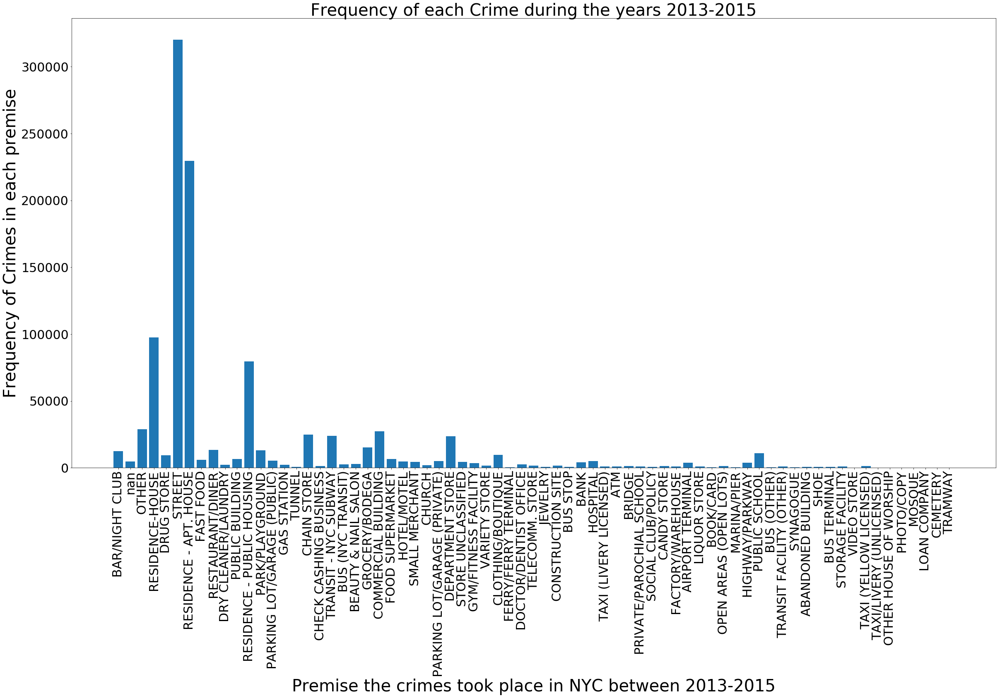

In [26]:
bar_fig = plt.figure(figsize = (40, 20))
    
_  = plt.bar(
    x = range(1, len(premise) + 1),
    height = list(premise.values()),
    tick_label = list(premise.keys())
)

## Set the tick and label fontsize
plt.tick_params(labelsize = 30)

## Set the title
_ = plt.title("Frequency of each Crime during the years 2013-2015", fontsize = 40)

## Set the x-label
_ = plt.xlabel("Premise the crimes took place in NYC between 2013-2015", fontsize = 40)

## Set the y-label
_ = plt.ylabel("Frequency of Crimes in each premise", fontsize = 40)

_ = plt.xticks(rotation = 90)

In [27]:
# Getting the frequency of what type of crime occurred in each borough
boro_desc = Counter()
for x in zip(dfh1['Borough'],dfh1['Description']):
    boro_desc[x] += 1
pprint(boro_desc)

Counter({('MANHATTAN', 'PETIT LARCENY'): 54316,
         ('BROOKLYN', 'PETIT LARCENY'): 50211,
         ('BROOKLYN', 'HARRASSMENT 2'): 41918,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES'): 35608,
         ('MANHATTAN', 'GRAND LARCENY'): 35198,
         ('QUEENS', 'PETIT LARCENY'): 35191,
         ('BRONX', 'PETIT LARCENY'): 32666,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF'): 31645,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES'): 28963,
         ('BRONX', 'HARRASSMENT 2'): 27966,
         ('QUEENS', 'HARRASSMENT 2'): 27645,
         ('BROOKLYN', 'GRAND LARCENY'): 26569,
         ('MANHATTAN', 'HARRASSMENT 2'): 26263,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES'): 23482,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF'): 23365,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF'): 21649,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES'): 21510,
         ('BRONX', 'DANGEROUS DRUGS'): 21335,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF'): 19

In [28]:
# Plotting bar graph for each Borough showing the frequency of each type of crime in that specific Borough

# Bar Graph for Manhattan, showing the frequency of each crime in Manhattan

new_dict = {}
for x,y in boro_desc.keys():
    if x == "MANHATTAN":
            new_dict[y] = boro_desc[(x,y)]
pprint(new_dict)     

{'ADMINISTRATIVE CODE': 257,
 'AGRICULTURE & MRKTS LAW-UNCLASSIFIED': 16,
 'ALCOHOLIC BEVERAGE CONTROL LAW': 34,
 'ANTICIPATORY OFFENSES': 3,
 'ARSON': 455,
 'ASSAULT 3 & RELATED OFFENSES': 21510,
 "BURGLAR'S TOOLS": 294,
 'BURGLARY': 6101,
 'CHILD ABANDONMENT/NON SUPPORT': 9,
 'CRIMINAL MISCHIEF & RELATED OF': 19997,
 'CRIMINAL TRESPASS': 3673,
 'DANGEROUS DRUGS': 13570,
 'DANGEROUS WEAPONS': 4415,
 'DISORDERLY CONDUCT': 24,
 'DISRUPTION OF A RELIGIOUS SERV': 3,
 'ENDAN WELFARE INCOMP': 10,
 'ESCAPE 3': 6,
 'FALSE REPORT BOMB': 8,
 'FALSE REPORT UNCLASSIFIED': 321,
 'FELONY ASSAULT': 7478,
 'FORGERY': 2788,
 'FORTUNE TELLING': 1,
 'FRAUDS': 2016,
 'FRAUDULENT ACCOSTING': 356,
 'GAMBLING': 204,
 'GRAND LARCENY': 35198,
 'GRAND LARCENY OF MOTOR VEHICLE': 1655,
 'HARRASSMENT 2': 26263,
 'HOMICIDE-NEGLIGENT-VEHICLE': 2,
 'INTOXICATED & IMPAIRED DRIVING': 2656,
 'INTOXICATED/IMPAIRED DRIVING': 2,
 'JOSTLING': 50,
 'KIDNAPPING & RELATED OFFENSES': 45,
 'KIDNAPPING AND RELATED OFFENSES': 2,


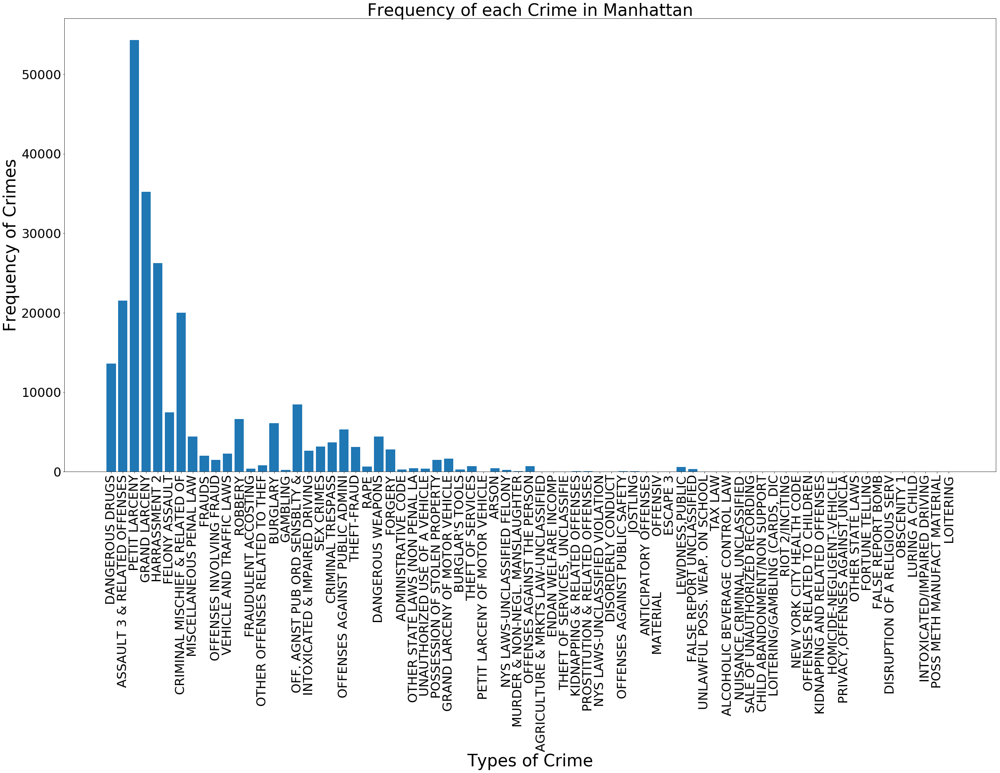

In [29]:
bar_fig = plt.figure(figsize = (40, 20))
    
_  = plt.bar(
    x = range(1, len(new_dict) + 1),
    height = list(new_dict.values()),
    tick_label = list(new_dict.keys())
)

## Set the tick and label fontsize
plt.tick_params(labelsize = 30)

## Set the title
_ = plt.title("Frequency of each Crime in Manhattan", fontsize = 40)

## Set the x-label
_ = plt.xlabel("Types of Crime", fontsize = 40)

## Set the y-label
_ = plt.ylabel("Frequency of Crimes", fontsize = 40)

_ = plt.xticks(rotation = 90)

In [30]:
# borough and crimes
def max_crimes_in_boro(borough,counts = 5):
    boro_count = Counter()
#     x = borough y = crimes
    for x,y in boro_desc.keys():
#         checks borough
        if x == borough:
            boro_count[y] = boro_desc[(x,y)]
    return(boro_count.most_common(counts))

In [31]:
pprint(max_crimes_in_boro('MANHATTAN',10))

[('PETIT LARCENY', 54316),
 ('GRAND LARCENY', 35198),
 ('HARRASSMENT 2', 26263),
 ('ASSAULT 3 & RELATED OFFENSES', 21510),
 ('CRIMINAL MISCHIEF & RELATED OF', 19997),
 ('DANGEROUS DRUGS', 13570),
 ('OFF. AGNST PUB ORD SENSBLTY &', 8473),
 ('FELONY ASSAULT', 7478),
 ('ROBBERY', 6606),
 ('BURGLARY', 6101)]


In [32]:
#Time-series analysis on the crimes
#Time and crime analysis for each borough

In [33]:
# Counter boro_desc_time contains ('Borough','Crime description','time')
boro_desc_time = Counter()
for x in zip(dfh1['Borough'],dfh1['Description'],dfh1['Time']):
    boro_desc_time[x] += 1
pprint(boro_desc_time)

Counter({('MANHATTAN', 'GRAND LARCENY', '12:00:00'): 1764,
         ('BROOKLYN', 'PETIT LARCENY', '18:00:00'): 1560,
         ('BROOKLYN', 'GRAND LARCENY', '12:00:00'): 1548,
         ('BROOKLYN', 'PETIT LARCENY', '12:00:00'): 1518,
         ('BROOKLYN', 'PETIT LARCENY', '16:00:00'): 1510,
         ('BROOKLYN', 'PETIT LARCENY', '15:00:00'): 1501,
         ('MANHATTAN', 'PETIT LARCENY', '12:00:00'): 1463,
         ('BROOKLYN', 'PETIT LARCENY', '17:00:00'): 1426,
         ('MANHATTAN', 'PETIT LARCENY', '17:00:00'): 1420,
         ('MANHATTAN', 'PETIT LARCENY', '15:00:00'): 1415,
         ('MANHATTAN', 'PETIT LARCENY', '18:00:00'): 1389,
         ('BROOKLYN', 'PETIT LARCENY', '20:00:00'): 1389,
         ('MANHATTAN', 'PETIT LARCENY', '16:00:00'): 1371,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '0:01:00'): 1336,
         ('QUEENS', 'GRAND LARCENY', '12:00:00'): 1306,
         ('BROOKLYN', 'PETIT LARCENY', '19:00:00'): 1300,
         ('MANHATTAN', 'PETIT LARCENY', '14:00:00'):

         ('BROOKLYN', 'BURGLARY', '7:30:00'): 160,
         ('BROOKLYN', 'BURGLARY', '16:30:00'): 159,
         ('BRONX', 'GRAND LARCENY', '17:30:00'): 159,
         ('BROOKLYN', 'FELONY ASSAULT', '12:00:00'): 159,
         ('BRONX', 'GRAND LARCENY', '16:30:00'): 159,
         ('QUEENS', 'FELONY ASSAULT', '19:00:00'): 159,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '20:00:00'): 159,
         ('QUEENS', 'GRAND LARCENY', '21:30:00'): 158,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '7:30:00'): 158,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '21:30:00'): 158,
         ('BROOKLYN', 'HARRASSMENT 2', '16:15:00'): 158,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '15:00:00'): 158,
         ('BROOKLYN', 'HARRASSMENT 2', '18:15:00'): 157,
         ('BROOKLYN', 'HARRASSMENT 2', '14:50:00'): 157,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '15:30:00'): 157,
         ('BROOKLYN', 'HARRASSMENT 2', '1:30:00'): 157,
         ('MANHATTAN

         ('BRONX', 'FELONY ASSAULT', '16:30:00'): 99,
         ('MANHATTAN', 'BURGLARY', '13:00:00'): 99,
         ('BROOKLYN', 'PETIT LARCENY', '11:40:00'): 99,
         ('QUEENS', 'ROBBERY', '15:00:00'): 99,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '15:00:00'): 99,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '20:00:00'): 99,
         ('BROOKLYN', 'FELONY ASSAULT', '15:30:00'): 99,
         ('BRONX', 'ROBBERY', '20:30:00'): 99,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '15:01:00'): 99,
         ('BROOKLYN', 'DANGEROUS DRUGS', '21:40:00'): 99,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '22:30:00'): 99,
         ('QUEENS', 'ROBBERY', '23:00:00'): 98,
         ('BRONX', 'HARRASSMENT 2', '14:50:00'): 98,
         ('QUEENS', 'GRAND LARCENY', '6:00:00'): 98,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '20:50:00'): 98,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '17:30:00'): 98,
         ('BROOKLYN', 'PETIT LARCENY', '10:15:00'): 98,


         ('BRONX', 'DANGEROUS DRUGS', '14:50:00'): 76,
         ('MANHATTAN', 'HARRASSMENT 2', '15:40:00'): 76,
         ('BRONX', 'DANGEROUS DRUGS', '14:35:00'): 76,
         ('BROOKLYN', 'DANGEROUS DRUGS', '21:55:00'): 76,
         ('BRONX', 'GRAND LARCENY', '6:00:00'): 76,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '5:30:00'): 76,
         ('MANHATTAN', 'DANGEROUS DRUGS', '16:30:00'): 76,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '9:30:00'): 76,
         ('BRONX', 'DANGEROUS DRUGS', '15:40:00'): 76,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '14:00:00'): 76,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '4:15:00'): 76,
         ('QUEENS', 'FELONY ASSAULT', '20:30:00'): 75,
         ('BROOKLYN', 'HARRASSMENT 2', '0:15:00'): 75,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '22:50:00'): 75,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '19:45:00'): 75,
         ('MANHATTAN', 'PETIT LARCENY', '9:20:00'): 75,
         ('BROOKLY

         ('MANHATTAN', 'PETIT LARCENY', '0:15:00'): 60,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '4:20:00'): 60,
         ('QUEENS', 'HARRASSMENT 2', '10:20:00'): 60,
         ('MANHATTAN', 'FELONY ASSAULT', '16:30:00'): 60,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '21:30:00'): 59,
         ('BROOKLYN', 'FELONY ASSAULT', '20:50:00'): 59,
         ('BRONX', 'ROBBERY', '3:30:00'): 59,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '19:40:00'): 59,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '14:20:00'): 59,
         ('MANHATTAN', 'ROBBERY', '0:30:00'): 59,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '0:15:00'): 59,
         ('BRONX', 'DANGEROUS DRUGS', '18:55:00'): 59,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '17:50:00'): 59,
         ('MANHATTAN', 'HARRASSMENT 2', '8:50:00'): 59,
         ('MANHATTAN', 'BURGLARY', '4:00:00'): 59,
         ('MANHATTAN', 'BURGLARY', '10:30:00'): 59,
         ('MANHATTAN', 'ROBBERY', '23:00:00'): 59,
 

         ('BROOKLYN', 'FELONY ASSAULT', '22:10:00'): 47,
         ('BRONX', 'BURGLARY', '4:00:00'): 47,
         ('BRONX', 'DANGEROUS WEAPONS', '20:50:00'): 47,
         ('QUEENS', 'HARRASSMENT 2', '23:10:00'): 47,
         ('MANHATTAN', 'PETIT LARCENY', '22:50:00'): 47,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '18:50:00'): 47,
         ('BROOKLYN', 'FELONY ASSAULT', '21:40:00'): 47,
         ('BRONX', 'ROBBERY', '9:00:00'): 47,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '21:45:00'): 47,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '15:40:00'): 47,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '14:40:00'): 47,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9:00:00'): 47,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '8:50:00'): 47,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '18:00:00'): 47,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '0:20:00'): 47,
         ('BROOKLYN', 'FELONY ASSAULT', '16:20:00'): 47,
         ('MANHATT

         ('BRONX', 'ROBBERY', '0:01:00'): 38,
         ('BRONX', 'FELONY ASSAULT', '21:50:00'): 38,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '16:50:00'): 38,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1:05:00'): 38,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '23:40:00'): 38,
         ('QUEENS', 'DANGEROUS WEAPONS', '16:00:00'): 38,
         ('QUEENS', 'THEFT-FRAUD', '0:00:00'): 38,
         ('MANHATTAN', 'PETIT LARCENY', '8:40:00'): 38,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '5:00:00'): 38,
         ('BROOKLYN', 'FELONY ASSAULT', '15:50:00'): 38,
         ('MANHATTAN', 'HARRASSMENT 2', '0:45:00'): 38,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '21:30:00'): 38,
         ('BRONX', 'DANGEROUS DRUGS', '11:35:00'): 38,
         ('MANHATTAN', 'HARRASSMENT 2', '23:20:00'): 38,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '19:00:00'): 38,
         ('BRONX', 'HARRASSMENT 2', '23:40:00'): 38,
         ('MANHATTAN', 'GRAND LARCENY', 

         ('BROOKLYN', 'DANGEROUS WEAPONS', '21:20:00'): 34,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '13:20:00'): 34,
         ('BRONX', 'FELONY ASSAULT', '10:45:00'): 34,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '2:50:00'): 34,
         ('BROOKLYN', 'PETIT LARCENY', '6:45:00'): 34,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '6:30:00'): 34,
         ('BROOKLYN', 'GRAND LARCENY', '21:15:00'): 34,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '1:25:00'): 34,
         ('BROOKLYN', 'FELONY ASSAULT', '4:20:00'): 34,
         ('BRONX', 'ROBBERY', '16:20:00'): 34,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '3:50:00'): 34,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '3:30:00'): 34,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '20:00:00'): 34,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '13:45:00'): 34,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '21:40:00'): 34,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '1:5

         ('BRONX', 'DANGEROUS WEAPONS', '23:40:00'): 31,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '18:05:00'): 31,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '21:10:00'): 31,
         ('QUEENS', 'FELONY ASSAULT', '23:20:00'): 31,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '16:45:00'): 31,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '0:30:00'): 31,
         ('STATEN ISLAND', 'HARRASSMENT 2', '18:20:00'): 31,
         ('MANHATTAN', 'FORGERY', '12:00:00'): 31,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '22:30:00'): 31,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '21:15:00'): 31,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '1:35:00'): 31,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '3:30:00'): 31,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '1:30:00'): 31,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '2:05:00'): 31,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '14:20:00'): 31,

         ('QUEENS', 'DANGEROUS WEAPONS', '16:20:00'): 27,
         ('STATEN ISLAND', 'HARRASSMENT 2', '4:00:00'): 27,
         ('BROOKLYN', 'ROBBERY', '13:45:00'): 27,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '21:45:00'): 27,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '17:00:00'): 27,
         ('QUEENS', 'HARRASSMENT 2', '18:35:00'): 27,
         ('MANHATTAN', 'FELONY ASSAULT', '3:10:00'): 27,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '0:01:00'): 27,
         ('QUEENS', 'ROBBERY', '20:50:00'): 27,
         ('BRONX', 'GRAND LARCENY', '16:45:00'): 27,
         ('MANHATTAN', 'DANGEROUS DRUGS', '12:45:00'): 27,
         ('QUEENS', 'ROBBERY', '19:45:00'): 27,
         ('BROOKLYN', 'FORGERY', '19:00:00'): 27,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '14:45:00'): 27,
         ('QUEENS', 'BURGLARY', '14:20:00'): 27,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '1:00:00'): 27,
         ('QUEENS', 'ROBBERY', '17:15:00'): 27,
         ('STATEN ISLAND', 'HARRA

         ('QUEENS', 'DANGEROUS DRUGS', '0:15:00'): 24,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '22:30:00'): 24,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '20:45:00'): 24,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '21:55:00'): 24,
         ('QUEENS', 'SEX CRIMES', '19:30:00'): 24,
         ('QUEENS', 'ROBBERY', '14:40:00'): 24,
         ('MANHATTAN', 'HARRASSMENT 2', '11:05:00'): 24,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '13:00:00'): 24,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '4:50:00'): 24,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '3:30:00'): 24,
         ('QUEENS', 'GRAND LARCENY', '21:45:00'): 24,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '3:50:00'): 24,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '2:15:00'): 24,
         ('STATEN ISLAND', 'HARRASSMENT 2', '20:40:00'): 24,
         ('QUEENS', 'FELONY ASSAULT', '19:40:00'): 24,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELA

         ('MANHATTAN', 'PETIT LARCENY', '16:27:00'): 21,
         ('MANHATTAN', 'SEX CRIMES', '12:30:00'): 21,
         ('BRONX', 'ROBBERY', '4:20:00'): 21,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '10:00:00'): 21,
         ('BRONX', 'RAPE', '20:00:00'): 21,
         ('STATEN ISLAND', 'FELONY ASSAULT', '1:00:00'): 21,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '18:00:00'): 21,
         ('BRONX', 'FELONY ASSAULT', '11:15:00'): 21,
         ('QUEENS', 'HARRASSMENT 2', '10:55:00'): 21,
         ('BRONX', 'FELONY ASSAULT', '4:20:00'): 21,
         ('BRONX', 'PETIT LARCENY', '23:50:00'): 21,
         ('BROOKLYN', 'BURGLARY', '14:50:00'): 21,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '21:15:00'): 21,
         ('BRONX', 'FELONY ASSAULT', '19:40:00'): 21,
         ('QUEENS', 'ROBBERY', '17:40:00'): 21,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '7:15:00'): 21,
         ('BROOKLYN', 'BURGLARY', '3:20:00'): 21,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '17:25:00'): 21

         ('BRONX', 'ROBBERY', '20:35:00'): 19,
         ('QUEENS', 'DANGEROUS WEAPONS', '19:40:00'): 19,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '15:30:00'): 19,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '5:00:00'): 19,
         ('MANHATTAN', 'HARRASSMENT 2', '19:55:00'): 19,
         ('QUEENS', 'HARRASSMENT 2', '11:25:00'): 19,
         ('BRONX', 'DANGEROUS WEAPONS', '3:00:00'): 19,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '5:20:00'): 19,
         ('BRONX', 'DANGEROUS DRUGS', '2:50:00'): 19,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '20:35:00'): 19,
         ('BRONX', 'SEX CRIMES', '3:00:00'): 19,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '12:50:00'): 19,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '22:20:00'): 19,
         ('MANHATTAN', 'PETIT LARCENY', '14:26:00'): 19,
         ('QUEENS', 'DANGEROUS DRUGS', '20:15:00'): 19,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '1:05:00'): 19,
         ('STATEN ISLAND', 'INTOX

         ('BRONX', 'DANGEROUS WEAPONS', '1:55:00'): 16,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '12:45:00'): 16,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '6:05:00'): 16,
         ('QUEENS', 'DANGEROUS DRUGS', '2:50:00'): 16,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '14:20:00'): 16,
         ('BRONX', 'RAPE', '8:00:00'): 16,
         ('BROOKLYN', 'GRAND LARCENY', '9:50:00'): 16,
         ('BROOKLYN', 'FORGERY', '22:20:00'): 16,
         ('QUEENS', 'GRAND LARCENY', '20:10:00'): 16,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '17:20:00'): 16,
         ('MANHATTAN', 'PETIT LARCENY', '14:34:00'): 16,
         ('QUEENS', 'CRIMINAL TRESPASS', '13:30:00'): 16,
         ('MANHATTAN', 'PETIT LARCENY', '13:13:00'): 16,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '8:35:00'): 16,
         ('MANHATTAN', 'HARRASSMENT 2', '7:55:00'): 16,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '7:40:00'): 16,
         ('BROOKLYN', 'ROBBERY', '6:20:00')

         ('MANHATTAN', 'BURGLARY', '12:45:00'): 14,
         ('BRONX', 'GRAND LARCENY', '10:50:00'): 14,
         ('QUEENS', 'BURGLARY', '7:50:00'): 14,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '1:15:00'): 14,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '0:40:00'): 14,
         ('MANHATTAN', 'PETIT LARCENY', '16:09:00'): 14,
         ('QUEENS', 'ROBBERY', '13:20:00'): 14,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '19:05:00'): 14,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '13:15:00'): 14,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '10:30:00'): 14,
         ('BROOKLYN', 'PETIT LARCENY', '14:18:00'): 14,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '15:40:00'): 14,
         ('MANHATTAN', 'FELONY ASSAULT', '22:55:00'): 14,
         ('MANHATTAN', 'PETIT LARCENY', '18:17:00'): 14,
         ('BRONX', 'RAPE', '17:00:00'): 14,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12:50:00'): 14,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADM

         ('BROOKLYN', 'FELONY ASSAULT', '0:55:00'): 13,
         ('BRONX', 'SEX CRIMES', '0:30:00'): 13,
         ('MANHATTAN', 'PETIT LARCENY', '5:40:00'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '14:20:00'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '12:20:00'): 13,
         ('BROOKLYN', 'PETIT LARCENY', '4:50:00'): 13,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '23:50:00'): 13,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10:40:00'): 13,
         ('BROOKLYN', 'GRAND LARCENY', '10:25:00'): 13,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '19:20:00'): 13,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '10:15:00'): 13,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '0:30:00'): 13,
         ('BROOKLYN', 'PETIT LARCENY', '14:22:00'): 13,
         ('BROOKLYN', 'FELONY ASSAULT', '9:25:00'): 13,
         ('BRONX', 'DANGEROUS WEAPONS', '6:15:00'): 13,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '5:05:00'): 13,
         ('BROO

         ('BROOKLYN', 'PETIT LARCENY', '15:26:00'): 11,
         ('MANHATTAN', 'PETIT LARCENY', '19:29:00'): 11,
         ('STATEN ISLAND', 'PETIT LARCENY', '10:50:00'): 11,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '7:45:00'): 11,
         ('MANHATTAN', 'ROBBERY', '7:45:00'): 11,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '6:05:00'): 11,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '4:55:00'): 11,
         ('BRONX', 'DANGEROUS DRUGS', '22:08:00'): 11,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '20:00:00'): 11,
         ('MANHATTAN', 'PETIT LARCENY', '18:36:00'): 11,
         ('BROOKLYN', 'BURGLARY', '15:40:00'): 11,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '12:45:00'): 11,
         ('QUEENS', 'BURGLARY', '12:20:00'): 11,
         ('QUEENS', 'HARRASSMENT 2', '7:05:00'): 11,
         ('BROOKLYN', 'FELONY ASSAULT', '5:05:00'): 11,
         ('BROOKLYN', 'GRAND LARCENY', '23:05:00'): 11,
         ('BROOKLYN', 'FELONY ASSAULT', '11:10:00'):

         ('BROOKLYN', 'PETIT LARCENY', '14:46:00'): 10,
         ('STATEN ISLAND', 'FELONY ASSAULT', '13:30:00'): 10,
         ('MANHATTAN', 'FORGERY', '13:05:00'): 10,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '9:55:00'): 10,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8:40:00'): 10,
         ('BRONX', 'PETIT LARCENY', '4:45:00'): 10,
         ('MANHATTAN', 'ROBBERY', '4:25:00'): 10,
         ('STATEN ISLAND', 'ROBBERY', '1:30:00'): 10,
         ('MANHATTAN', 'PETIT LARCENY', '17:36:00'): 10,
         ('BROOKLYN', 'PETIT LARCENY', '18:27:00'): 10,
         ('BRONX', 'DANGEROUS DRUGS', '21:38:00'): 10,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '20:15:00'): 10,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '17:30:00'): 10,
         ('MANHATTAN', 'BURGLARY', '10:50:00'): 10,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10:10:00'): 10,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '9:55:00'): 10,
         ('MANHATT

         ('MANHATTAN', 'DANGEROUS WEAPONS', '2:05:00'): 9,
         ('BROOKLYN', 'BURGLARY', '22:45:00'): 9,
         ('MANHATTAN', 'GRAND LARCENY', '16:32:00'): 9,
         ('MANHATTAN', 'SEX CRIMES', '20:45:00'): 9,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '20:15:00'): 9,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '19:20:00'): 9,
         ('QUEENS', 'CRIMINAL TRESPASS', '15:10:00'): 9,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '13:55:00'): 9,
         ('BRONX', 'ROBBERY', '8:10:00'): 9,
         ('QUEENS', 'HARRASSMENT 2', '2:55:00'): 9,
         ('MANHATTAN', 'ROBBERY', '5:50:00'): 9,
         ('BROOKLYN', 'PETIT LARCENY', '13:44:00'): 9,
         ('BROOKLYN', 'PETIT LARCENY', '17:44:00'): 9,
         ('STATEN ISLAND', 'FELONY ASSAULT', '22:40:00'): 9,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '17:05:00'): 9,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '15:35:00'): 9,
         ('BROOKLYN', 'SEX CRIMES', '15:20:00'): 9,
         ('BRO

         ('BRONX', 'DANGEROUS DRUGS', '16:27:00'): 9,
         ('MANHATTAN', 'ROBBERY', '10:40:00'): 9,
         ('MANHATTAN', 'FELONY ASSAULT', '1:05:00'): 9,
         ('QUEENS', 'FORGERY', '22:40:00'): 9,
         ('BROOKLYN', 'PETIT LARCENY', '17:52:00'): 9,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '17:30:00'): 9,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '3:55:00'): 9,
         ('MANHATTAN', 'GRAND LARCENY', '2:35:00'): 9,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '21:26:00'): 9,
         ('BROOKLYN', 'DANGEROUS DRUGS', '19:58:00'): 9,
         ('BRONX', 'CRIMINAL TRESPASS', '18:50:00'): 9,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '4:45:00'): 9,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '19:15:00'): 9,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '13:50:00'): 9,
         ('BROOKLYN', 'DANGEROUS DRUGS', '18:53:00'): 9,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '15:28:00'): 9,
         ('QUEENS', 'DAN

         ('BROOKLYN', 'DANGEROUS WEAPONS', '2:55:00'): 8,
         ('MANHATTAN', 'FORGERY', '1:20:00'): 8,
         ('QUEENS', 'PETIT LARCENY', '15:03:00'): 8,
         ('MANHATTAN', 'PETIT LARCENY', '10:43:00'): 8,
         ('QUEENS', 'FORGERY', '8:30:00'): 8,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '4:10:00'): 8,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '0:35:00'): 8,
         ('MANHATTAN', 'HARRASSMENT 2', '5:20:00'): 8,
         ('QUEENS', 'PETIT LARCENY', '15:41:00'): 8,
         ('BRONX', 'FORGERY', '15:05:00'): 8,
         ('QUEENS', 'DANGEROUS WEAPONS', '10:45:00'): 8,
         ('BROOKLYN', 'PETIT LARCENY', '10:11:00'): 8,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '9:10:00'): 8,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '7:50:00'): 8,
         ('BROOKLYN', 'GRAND LARCENY', '1:55:00'): 8,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '18:42:00'): 8,
         ('BROOKLYN', 'DANGEROUS DRUGS', '21:42:00'): 8,
         ('BRONX', 'DANGEROUS DRUGS',

         ('MANHATTAN', 'GRAND LARCENY', '18:47:00'): 7,
         ('QUEENS', 'PETIT LARCENY', '15:52:00'): 7,
         ('BROOKLYN', 'DANGEROUS DRUGS', '14:27:00'): 7,
         ('BROOKLYN', 'DANGEROUS DRUGS', '13:56:00'): 7,
         ('BROOKLYN', 'PETIT LARCENY', '11:34:00'): 7,
         ('MANHATTAN', 'FORGERY', '10:20:00'): 7,
         ('QUEENS', 'PETIT LARCENY', '10:08:00'): 7,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8:50:00'): 7,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '1:04:00'): 7,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '0:27:00'): 7,
         ('STATEN ISLAND', 'ROBBERY', '16:30:00'): 7,
         ('MANHATTAN', 'GRAND LARCENY', '12:57:00'): 7,
         ('BROOKLYN', 'PETIT LARCENY', '12:36:00'): 7,
         ('BROOKLYN', 'PETIT LARCENY', '16:46:00'): 7,
         ('QUEENS', 'BURGLARY', '14:55:00'): 7,
         ('BROOKLYN', 'PETIT LARCENY', '13:32:00'): 7,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '13:00:00'): 7,
         ('QUEENS', 'OFF.

         ('QUEENS', 'PETIT LARCENY', '19:53:00'): 7,
         ('BRONX', 'CRIMINAL TRESPASS', '14:45:00'): 7,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '23:29:00'): 7,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '18:20:00'): 7,
         ('MANHATTAN', 'DANGEROUS DRUGS', '22:31:00'): 7,
         ('MANHATTAN', 'DANGEROUS DRUGS', '19:48:00'): 7,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '18:30:00'): 7,
         ('BRONX', 'DANGEROUS DRUGS', '17:59:00'): 7,
         ('MANHATTAN', 'DANGEROUS DRUGS', '17:53:00'): 7,
         ('QUEENS', 'PETIT LARCENY', '13:27:00'): 7,
         ('BROOKLYN', 'DANGEROUS DRUGS', '13:08:00'): 7,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '13:10:00'): 7,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '22:45:00'): 7,
         ('BROOKLYN', 'FRAUDS', '19:50:00'): 7,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '2:09:00'): 7,
         ('STATEN ISLAND', 'PETIT LARCENY', '16:55:00'): 7,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE',

         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '3:00:00'): 6,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '1:35:00'): 6,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '21:15:00'): 6,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '23:58:00'): 6,
         ('BRONX', 'HARRASSMENT 2', '18:19:00'): 6,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '17:15:00'): 6,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '16:55:00'): 6,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '15:58:00'): 6,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '15:25:00'): 6,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '13:35:00'): 6,
         ('BROOKLYN', 'PETIT LARCENY', '13:29:00'): 6,
         ('MANHATTAN', 'PETIT LARCENY', '10:42:00'): 6,
         ('MANHATTAN', 'FELONY ASSAULT', '9:10:00'): 6,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '2:47:00'): 6,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '1:15:00'): 6,
         ('BROOKLYN', 'FORGERY', '1:05:00'): 6,
      

         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '15:51:00'): 6,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '12:50:00'): 6,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11:20:00'): 6,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '1:00:00'): 6,
         ('BROOKLYN', 'PETIT LARCENY', '20:18:00'): 6,
         ('MANHATTAN', 'SEX CRIMES', '17:20:00'): 6,
         ('BROOKLYN', 'FRAUDS', '22:45:00'): 6,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '19:45:00'): 6,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '19:25:00'): 6,
         ('BRONX', 'PETIT LARCENY', '18:49:00'): 6,
         ('MANHATTAN', 'HARRASSMENT 2', '17:03:00'): 6,
         ('BRONX', 'SEX CRIMES', '14:45:00'): 6,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '13:20:00'): 6,
         ('BROOKLYN', 'PETIT LARCENY', '11:11:00'): 6,
         ('STATEN ISLAND', 'FELONY ASSAULT', '2:15:00'): 6,
         ('BROOKLYN', 'BURGLARY', '20:50:00'): 6,
         ('BRONX', 'ASSAULT 3 & RELATED 

         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '21:26:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY', '20:22:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY', '19:58:00'): 5,
         ('MANHATTAN', 'DANGEROUS DRUGS', '18:59:00'): 5,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '18:15:00'): 5,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '14:28:00'): 5,
         ('MANHATTAN', 'FORGERY', '13:35:00'): 5,
         ('MANHATTAN', 'DANGEROUS DRUGS', '13:08:00'): 5,
         ('BROOKLYN', 'PETIT LARCENY', '9:47:00'): 5,
         ('BRONX', 'SEX CRIMES', '8:40:00'): 5,
         ('QUEENS', 'GRAND LARCENY', '8:35:00'): 5,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '8:10:00'): 5,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '5:20:00'): 5,
         ('BROOKLYN', 'PETIT LARCENY', '2:53:00'): 5,
         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '15:00:00'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '22:35:00'): 5,
         ('MANHATTAN', 'DANGEROUS DRU

         ('QUEENS', 'ARSON', '3:00:00'): 5,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '2:05:00'): 5,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '23:50:00'): 5,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '23:50:00'): 5,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '23:35:00'): 5,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '20:52:00'): 5,
         ('QUEENS', 'PETIT LARCENY', '13:49:00'): 5,
         ('BRONX', 'BURGLARY', '9:20:00'): 5,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '5:20:00'): 5,
         ('MANHATTAN', 'FELONY ASSAULT', '20:21:00'): 5,
         ('BRONX', 'FELONY ASSAULT', '20:16:00'): 5,
         ('BROOKLYN', 'HARRASSMENT 2', '19:07:00'): 5,
         ('BRONX', 'DANGEROUS DRUGS', '18:23:00'): 5,
         ('BRONX', 'PETIT LARCENY', '17:49:00'): 5,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '17:10:00'): 5,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '15:48:00'): 5,
         ('BRONX', 'HARRASSMENT 2', '15:03:00'): 5,
 

         ('BROOKLYN', 'PETIT LARCENY', '15:31:00'): 5,
         ('BRONX', 'DANGEROUS DRUGS', '12:23:00'): 5,
         ('MANHATTAN', 'ROBBERY', '4:18:00'): 5,
         ('BRONX', 'CRIMINAL TRESPASS', '3:00:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '0:05:00'): 5,
         ('MANHATTAN', 'FORGERY', '23:55:00'): 5,
         ('BRONX', 'GRAND LARCENY', '23:05:00'): 5,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '18:10:00'): 5,
         ('STATEN ISLAND', 'FELONY ASSAULT', '18:10:00'): 5,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '17:39:00'): 5,
         ('MANHATTAN', 'HARRASSMENT 2', '16:08:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY', '15:06:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY', '14:36:00'): 5,
         ('MANHATTAN', 'GRAND LARCENY', '10:33:00'): 5,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '10:17:00'): 5,
         ('BRONX', 'RAPE', '14:30:00'): 5,
         ('BROOKLYN', 'FRAUDS', '19:40:00'): 5,
         ('BROOKLYN', 'FRAU

         ('BRONX', 'PETIT LARCENY', '15:04:00'): 5,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10:47:00'): 5,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '12:18:00'): 5,
         ('MANHATTAN', 'HARRASSMENT 2', '3:05:00'): 5,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '3:00:00'): 5,
         ('QUEENS', 'FORGERY', '22:45:00'): 5,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '20:47:00'): 5,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '19:10:00'): 5,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '15:50:00'): 5,
         ('STATEN ISLAND', 'ROBBERY', '15:15:00'): 5,
         ('QUEENS', 'DANGEROUS WEAPONS', '13:05:00'): 5,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '2:50:00'): 5,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1:20:00'): 5,
         ('BROOKLYN', 'DANGEROUS DRUGS', '23:33:00'): 5,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '16:23:00'): 5,
         ('MANHATTAN', 'PETIT LARCENY', '0:49:00'): 5

         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '7:44:00'): 5,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '3:27:00'): 5,
         ('QUEENS', 'PETIT LARCENY', '10:11:00'): 5,
         ('MANHATTAN', 'DANGEROUS DRUGS', '17:24:00'): 5,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '13:50:00'): 5,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '2:07:00'): 5,
         ('BROOKLYN', 'DANGEROUS DRUGS', '14:34:00'): 5,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '7:10:00'): 5,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '20:06:00'): 5,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '20:28:00'): 5,
         ('BROOKLYN', 'ROBBERY', '15:47:00'): 5,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '18:55:00'): 5,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '8:40:00'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '20:35:00'): 5,
         ('MANHATTAN', 'SEX CRIMES', '16:38:00'): 5,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', 

         ('BRONX', 'HARRASSMENT 2', '20:47:00'): 4,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '11:35:00'): 4,
         ('BRONX', 'HARRASSMENT 2', '22:26:00'): 4,
         ('BRONX', 'DANGEROUS WEAPONS', '19:21:00'): 4,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '19:10:00'): 4,
         ('BRONX', 'FORGERY', '17:35:00'): 4,
         ('MANHATTAN', 'DANGEROUS DRUGS', '12:26:00'): 4,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '12:15:00'): 4,
         ('BRONX', 'DANGEROUS DRUGS', '11:14:00'): 4,
         ('BRONX', 'PETIT LARCENY', '11:03:00'): 4,
         ('BROOKLYN', 'PETIT LARCENY', '10:23:00'): 4,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '4:45:00'): 4,
         ('BROOKLYN', 'FELONY ASSAULT', '2:37:00'): 4,
         ('MANHATTAN', 'DANGEROUS DRUGS', '1:37:00'): 4,
         ('BRONX', 'FELONY ASSAULT', '23:36:00'): 4,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '23:35:00'): 4,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '22:48:00'): 4,
         ('BRONX', 'HARRASSMEN

         ('STATEN ISLAND', 'ADMINISTRATIVE CODE', '15:00:00'): 4,
         ('BRONX', 'FRAUDS', '8:30:00'): 4,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '11:54:00'): 4,
         ('BROOKLYN', 'HARRASSMENT 2', '21:31:00'): 4,
         ('QUEENS', 'FELONY ASSAULT', '19:55:00'): 4,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '18:15:00'): 4,
         ('BROOKLYN', 'DANGEROUS DRUGS', '18:06:00'): 4,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '16:30:00'): 4,
         ('BROOKLYN', 'FORGERY', '15:28:00'): 4,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '15:00:00'): 4,
         ('BRONX', 'DANGEROUS DRUGS', '14:42:00'): 4,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '7:10:00'): 4,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '2:44:00'): 4,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '1:40:00'): 4,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '23:34:00'): 4,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '23:

         ('BRONX', 'DANGEROUS WEAPONS', '0:12:00'): 4,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '0:06:00'): 4,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '0:03:00'): 4,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '23:47:00'): 4,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '20:48:00'): 4,
         ('BROOKLYN', 'GRAND LARCENY', '14:07:00'): 4,
         ('BRONX', 'FORGERY', '23:35:00'): 4,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '22:28:00'): 4,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '20:42:00'): 4,
         ('STATEN ISLAND', 'GRAND LARCENY', '20:20:00'): 4,
         ('MANHATTAN', 'DANGEROUS DRUGS', '19:22:00'): 4,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '18:03:00'): 4,
         ('BROOKLYN', 'PETIT LARCENY', '17:47:00'): 4,
         ('QUEENS', 'CRIMINAL TRESPASS', '13:45:00'): 4,
         ('QUEENS', 'BURGLARY', '13:35:00'): 4,
         ('MANHATTAN', 'GRAND LARCENY', '13:33:00'): 4,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLI

         ('BRONX', 'ADMINISTRATIVE CODE', '0:30:00'): 4,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '1:50:00'): 4,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '21:45:00'): 4,
         ('BROOKLYN', 'DANGEROUS DRUGS', '18:59:00'): 4,
         ('MANHATTAN', 'HARRASSMENT 2', '13:51:00'): 4,
         ('MANHATTAN', 'BURGLARY', '6:50:00'): 4,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '3:10:00'): 4,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '1:37:00'): 4,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '21:50:00'): 4,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '19:58:00'): 4,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '19:42:00'): 4,
         ('MANHATTAN', 'HARRASSMENT 2', '12:49:00'): 4,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11:31:00'): 4,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '8:51:00'): 4,
         ('MANHATTAN', 'RAPE', '4:45:00'): 4,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '22:30:00'): 4,
    

         ('MANHATTAN', 'THEFT OF SERVICES', '12:15:00'): 4,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '18:31:00'): 4,
         ('BROOKLYN', 'GRAND LARCENY', '19:37:00'): 4,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '10:55:00'): 4,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '21:43:00'): 4,
         ('QUEENS', 'OTHER STATE LAWS (NON PENAL LA', '21:00:00'): 4,
         ('BROOKLYN', 'ROBBERY', '19:32:00'): 4,
         ('STATEN ISLAND', 'PETIT LARCENY', '18:48:00'): 4,
         ('BROOKLYN', 'PETIT LARCENY', '17:31:00'): 4,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '13:38:00'): 4,
         ('BROOKLYN', 'FORGERY', '8:35:00'): 4,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '23:45:00'): 4,
         ('QUEENS', 'PETIT LARCENY', '2:23:00'): 4,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '15:34:00'): 4,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '5:38:00'): 4,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12:21:00'): 4,
   

         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '2:06:00'): 3,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '1:46:00'): 3,
         ('MANHATTAN', 'PETIT LARCENY', '1:38:00'): 3,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '1:15:00'): 3,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '0:25:00'): 3,
         ('MANHATTAN', 'PETIT LARCENY', '21:46:00'): 3,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '11:27:00'): 3,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '20:45:00'): 3,
         ('BRONX', 'PETIT LARCENY', '18:51:00'): 3,
         ('QUEENS', 'HARRASSMENT 2', '18:06:00'): 3,
         ('BRONX', 'HARRASSMENT 2', '17:53:00'): 3,
         ('STATEN ISLAND', 'PETIT LARCENY', '17:21:00'): 3,
         ('BROOKLYN', 'HARRASSMENT 2', '17:16:00'): 3,
         ('BROOKLYN', 'HARRASSMENT 2', '17:14:00'): 3,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '16:12:00'): 3,
         ('BRONX', 'DANGEROUS DRUGS', '15:51:00'): 3,
         ('MANHATTAN', "BU

         ('MANHATTAN', 'ADMINISTRATIVE CODE', '21:15:00'): 3,
         ('BRONX', 'GRAND LARCENY', '20:14:00'): 3,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '17:42:00'): 3,
         ('MANHATTAN', 'DANGEROUS DRUGS', '17:02:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '16:57:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '16:44:00'): 3,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '16:34:00'): 3,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '16:33:00'): 3,
         ('BROOKLYN', 'FELONY ASSAULT', '16:32:00'): 3,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '15:42:00'): 3,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '15:10:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '14:01:00'): 3,
         ('BRONX', 'HARRASSMENT 2', '12:58:00'): 3,
         ('BRONX', 'PETIT LARCENY', '10:02:00'): 3,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '8:50:00'): 3,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMIN

         ('MANHATTAN', 'GRAND LARCENY', '2:52:00'): 3,
         ('QUEENS', 'GRAND LARCENY', '11:48:00'): 3,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '14:43:00'): 3,
         ('BRONX', 'PETIT LARCENY', '6:02:00'): 3,
         ('BRONX', 'FRAUDS', '2:50:00'): 3,
         ('BROOKLYN', 'FELONY ASSAULT', '23:07:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '21:04:00'): 3,
         ('BROOKLYN', 'PETIT LARCENY', '20:54:00'): 3,
         ('BRONX', 'DANGEROUS WEAPONS', '20:12:00'): 3,
         ('STATEN ISLAND', 'FELONY ASSAULT', '19:20:00'): 3,
         ('BRONX', 'FRAUDS', '18:55:00'): 3,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '18:07:00'): 3,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '16:50:00'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '13:40:00'): 3,
         ('BRONX', 'DANGEROUS DRUGS', '11:48:00'): 3,
         ('QUEENS', 'CRIMINAL TRESPASS', '10:35:00'): 3,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '10:02:00'): 

         ('BROOKLYN', 'DANGEROUS WEAPONS', '13:46:00'): 3,
         ('QUEENS', 'PETIT LARCENY', '13:23:00'): 3,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '12:47:00'): 3,
         ('BRONX', 'GRAND LARCENY', '11:54:00'): 3,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '7:30:00'): 3,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '6:24:00'): 3,
         ('BROOKLYN', 'PETIT LARCENY', '6:03:00'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '5:18:00'): 3,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '5:07:00'): 3,
         ('BROOKLYN', 'HARRASSMENT 2', '3:55:00'): 3,
         ('BRONX', 'DANGEROUS DRUGS', '3:13:00'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '2:30:00'): 3,
         ('QUEENS', 'SEX CRIMES', '1:20:00'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '1:02:00'): 3,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '0:17:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '20:09:00'): 3,

         ('MANHATTAN', 'SEX CRIMES', '4:45:00'): 3,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '4:38:00'): 3,
         ('BRONX', 'HARRASSMENT 2', '2:48:00'): 3,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '1:58:00'): 3,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '1:01:00'): 3,
         ('MANHATTAN', 'SEX CRIMES', '23:35:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '20:32:00'): 3,
         ('STATEN ISLAND', 'PETIT LARCENY', '11:55:00'): 3,
         ('MANHATTAN', 'DANGEROUS DRUGS', '22:26:00'): 3,
         ('MANHATTAN', 'DANGEROUS DRUGS', '22:19:00'): 3,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '18:50:00'): 3,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '17:54:00'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '12:35:00'): 3,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '11:50:00'): 3,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '11:19:00'): 3,
         ('BRONX', 'LEWDNESS,PUBLIC', '8:00:00'): 3,
 

         ('MANHATTAN', 'LEWDNESS,PUBLIC', '0:10:00'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '23:36:00'): 3,
         ('BROOKLYN', 'FELONY ASSAULT', '23:17:00'): 3,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '20:41:00'): 3,
         ('MANHATTAN', 'THEFT-FRAUD', '14:53:00'): 3,
         ('BROOKLYN', 'PETIT LARCENY', '21:16:00'): 3,
         ('BROOKLYN', 'PETIT LARCENY', '22:17:00'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '18:25:00'): 3,
         ('BRONX', 'GRAND LARCENY', '14:33:00'): 3,
         ('BRONX', 'DANGEROUS DRUGS', '9:23:00'): 3,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '7:35:00'): 3,
         ('BRONX', 'HARRASSMENT 2', '2:14:00'): 3,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '0:26:00'): 3,
         ('BRONX', 'FELONY ASSAULT', '0:18:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '23:39:00'): 3,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '16:24:00'): 3,
         ('QUEENS', 'GRAND 

         ('MANHATTAN', 'GRAND LARCENY', '21:43:00'): 3,
         ('MANHATTAN', 'GRAND LARCENY', '9:36:00'): 3,
         ('BROOKLYN', 'SEX CRIMES', '6:55:00'): 3,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '22:49:00'): 3,
         ('BRONX', 'HARRASSMENT 2', '17:12:00'): 3,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '14:21:00'): 3,
         ('QUEENS', 'GRAND LARCENY', '12:37:00'): 3,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '10:30:00'): 3,
         ('QUEENS', 'ROBBERY', '6:55:00'): 3,
         ('MANHATTAN', 'FELONY ASSAULT', '4:11:00'): 3,
         ('MANHATTAN', 'DANGEROUS DRUGS', '1:57:00'): 3,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '1:49:00'): 3,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '1:23:00'): 3,
         ('QUEENS', 'FELONY ASSAULT', '1:12:00'): 3,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '20:17:00'): 3,
         ('MANHATTAN', 'FRAUDS', '16:15:00'): 3,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '11:57:00')

         ('QUEENS', 'BURGLARY', '10:05:00'): 3,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '16:37:00'): 3,
         ('BRONX', 'THEFT-FRAUD', '17:40:00'): 3,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '14:22:00'): 3,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '8:35:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '0:28:00'): 3,
         ('BROOKLYN', 'GRAND LARCENY', '17:46:00'): 3,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '11:55:00'): 3,
         ('BROOKLYN', 'FRAUDS', '4:30:00'): 3,
         ('BROOKLYN', 'GRAND LARCENY', '12:33:00'): 3,
         ('BROOKLYN', 'PETIT LARCENY', '19:43:00'): 3,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '17:11:00'): 3,
         ('MANHATTAN', 'DANGEROUS DRUGS', '12:03:00'): 3,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '10:47:00'): 3,
         ('BRONX', 'DANGEROUS DRUGS', '8:46:00'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '2:21:00'): 3,
         ('BROOKLYN', 'DAN

         ('QUEENS', 'FRAUDS', '0:35:00'): 3,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '21:50:00'): 3,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '18:55:00'): 3,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '17:05:00'): 3,
         ('BROOKLYN', 'FELONY ASSAULT', '15:33:00'): 3,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '11:58:00'): 3,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '8:55:00'): 3,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '0:06:00'): 3,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '3:40:00'): 3,
         ('STATEN ISLAND', 'PETIT LARCENY', '20:44:00'): 3,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '10:31:00'): 3,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '10:19:00'): 3,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '8:05:00'): 3,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '7:10:00'): 3,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '21:27:00'): 3,
         ('MANHATTAN', 'OFFE

         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '21:58:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '21:39:00'): 2,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '20:40:00'): 2,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '19:47:00'): 2,
         ('MANHATTAN', "BURGLAR'S TOOLS", '19:40:00'): 2,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '16:36:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '15:54:00'): 2,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '14:56:00'): 2,
         ('MANHATTAN', 'FORGERY', '14:52:00'): 2,
         ('BRONX', 'GRAND LARCENY', '13:02:00'): 2,
         ('BROOKLYN', 'ARSON', '12:58:00'): 2,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '12:40:00'): 2,
         ('QUEENS', 'PETIT LARCENY', '11:09:00'): 2,
         ('MANHATTAN', 'FELONY ASSAULT', '10:27:00'): 2,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '10:18:00'): 2,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '9:38:00'): 2,
         ('ST

         ('BRONX', 'FELONY ASSAULT', '1:56:00'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '1:31:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '1:19:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '0:58:00'): 2,
         ('BROOKLYN', 'DANGEROUS DRUGS', '0:54:00'): 2,
         ('MANHATTAN', 'FORGERY', '23:59:00'): 2,
         ('QUEENS', 'BURGLARY', '22:17:00'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '9:04:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '2:11:00'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '23:33:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '23:24:00'): 2,
         ('BROOKLYN', 'GRAND LARCENY', '21:27:00'): 2,
         ('BROOKLYN', 'GRAND LARCENY', '20:42:00'): 2,
         ('BROOKLYN', 'PETIT LARCENY', '8:56:00'): 2,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '12:48:00'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '21:08:00'): 2,
         ('QUEENS', 'INTOXICATED &

         ('STATEN ISLAND', 'FELONY ASSAULT', '9:08:00'): 2,
         ('BROOKLYN', 'BURGLARY', '8:53:00'): 2,
         ('MANHATTAN', 'FORGERY', '8:45:00'): 2,
         ('BRONX', 'DANGEROUS WEAPONS', '8:40:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '8:35:00'): 2,
         ('BROOKLYN', 'SEX CRIMES', '4:05:00'): 2,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '8:18:00'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '7:15:00'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '7:14:00'): 2,
         ('MANHATTAN', 'FELONY ASSAULT', '6:05:00'): 2,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '6:05:00'): 2,
         ('QUEENS', 'DANGEROUS WEAPONS', '3:48:00'): 2,
         ('BRONX', 'GRAND LARCENY', '3:34:00'): 2,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '3:25:00'): 2,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '2:42:00'): 2,
         ('QUEENS', 'BURGLARY', '2:36:00'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '0:51:00'): 2,
    

         ('BRONX', 'SEX CRIMES', '12:27:00'): 2,
         ('QUEENS', 'LEWDNESS,PUBLIC', '0:40:00'): 2,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '22:33:00'): 2,
         ('MANHATTAN', 'PETIT LARCENY', '23:03:00'): 2,
         ('BRONX', 'DANGEROUS WEAPONS', '23:01:00'): 2,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '21:48:00'): 2,
         ('MANHATTAN', 'FRAUDS', '21:25:00'): 2,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '20:59:00'): 2,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '20:20:00'): 2,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '19:53:00'): 2,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '19:50:00'): 2,
         ('MANHATTAN', 'THEFT-FRAUD', '19:35:00'): 2,
         ('BROOKLYN', 'HARRASSMENT 2', '19:13:00'): 2,
         ('BRONX', 'FRAUDS', '18:37:00'): 2,
         ('QUEENS', 'HARRASSMENT 2', '18:26:00'): 2,
         ('QUEENS', 'DANGEROUS WEAPONS', '18:22:00'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '18:17:00'): 2,
         (

         ('BRONX', 'FORGERY', '20:59:00'): 2,
         ('MANHATTAN', 'SEX CRIMES', '18:17:00'): 2,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '16:12:00'): 2,
         ('MANHATTAN', 'ROBBERY', '14:36:00'): 2,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '13:49:00'): 2,
         ('BRONX', 'CRIMINAL TRESPASS', '13:36:00'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '13:22:00'): 2,
         ('BRONX', 'ADMINISTRATIVE CODE', '12:55:00'): 2,
         ('BRONX', 'HARRASSMENT 2', '7:36:00'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '6:35:00'): 2,
         ('QUEENS', 'FORGERY', '6:10:00'): 2,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '4:40:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '4:08:00'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '3:58:00'): 2,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '3:20:00'): 2,
         ('BRONX', 'FELONY ASSAULT', '2:19:00'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', 

         ('BROOKLYN', 'GAMBLING', '16:30:00'): 2,
         ('BRONX', 'FELONY ASSAULT', '15:21:00'): 2,
         ('STATEN ISLAND', 'PETIT LARCENY', '11:54:00'): 2,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '7:40:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '6:05:00'): 2,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '5:35:00'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '5:35:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '4:04:00'): 2,
         ('BROOKLYN', 'ROBBERY', '3:59:00'): 2,
         ('BROOKLYN', 'PETIT LARCENY', '3:21:00'): 2,
         ('MANHATTAN', 'FELONY ASSAULT', '3:07:00'): 2,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '3:05:00'): 2,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '2:33:00'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '2:16:00'): 2,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '2:07:00'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '1:53:00'): 2,
   

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '10:49:00'): 2,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '9:25:00'): 2,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '8:03:00'): 2,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '6:35:00'): 2,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '5:10:00'): 2,
         ('MANHATTAN', 'FRAUDS', '4:55:00'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '0:41:00'): 2,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '23:44:00'): 2,
         ('BROOKLYN', 'PETIT LARCENY', '1:08:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '2:36:00'): 2,
         ('BRONX', 'HARRASSMENT 2', '9:13:00'): 2,
         ('STATEN ISLAND', 'OTHER STATE LAWS (NON PENAL LA', '0:01:00'): 2,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '22:11:00'): 2,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '21:19:00'): 2,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '20:12:00'): 2,
         ('BROOKLYN', 'OFF

         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '6:30:00'): 2,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '5:21:00'): 2,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '4:45:00'): 2,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '4:25:00'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '3:10:00'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '2:43:00'): 2,
         ('MANHATTAN', 'PETIT LARCENY', '2:28:00'): 2,
         ('BRONX', 'PETIT LARCENY', '2:27:00'): 2,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '2:05:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '1:47:00'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '1:37:00'): 2,
         ('MANHATTAN', 'DANGEROUS DRUGS', '0:36:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '0:03:00'): 2,
         ('MANHATTAN', 'GAMBLING', '23:15:00'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '22:22:00'): 2,
         ('BROOKLYN', 'PETIT LAR

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '15:17:00'): 2,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '14:33:00'): 2,
         ('MANHATTAN', 'FELONY ASSAULT', '13:48:00'): 2,
         ('BRONX', 'FELONY ASSAULT', '13:34:00'): 2,
         ('BROOKLYN', "BURGLAR'S TOOLS", '13:30:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '11:33:00'): 2,
         ('MANHATTAN', 'DANGEROUS DRUGS', '11:18:00'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '10:15:00'): 2,
         ('BRONX', 'ROBBERY', '8:43:00'): 2,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '7:35:00'): 2,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '4:40:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '4:08:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '3:53:00'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '2:12:00'): 2,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1:41:00'): 2,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '1:38:00'): 2,
   

         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '2:54:00'): 2,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '0:50:00'): 2,
         ('QUEENS', 'FRAUDS', '20:40:00'): 2,
         ('MANHATTAN', 'SEX CRIMES', '14:49:00'): 2,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '3:57:00'): 2,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '18:45:00'): 2,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '9:30:00'): 2,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '22:51:00'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '21:24:00'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '21:10:00'): 2,
         ('STATEN ISLAND', 'ROBBERY', '20:05:00'): 2,
         ('QUEENS', 'BURGLARY', '20:05:00'): 2,
         ('BRONX', 'GRAND LARCENY', '19:59:00'): 2,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '17:55:00'): 2,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '16:40:00'): 2,
         ('BRONX', 'ROBBERY', '16:28:00'): 2,
         ('BROO

         ('MANHATTAN', 'FORGERY', '9:40:00'): 2,
         ('MANHATTAN', 'ARSON', '14:00:00'): 2,
         ('STATEN ISLAND', 'THEFT-FRAUD', '18:30:00'): 2,
         ('MANHATTAN', 'NYS LAWS-UNCLASSIFIED FELONY', '20:10:00'): 2,
         ('BRONX', 'SEX CRIMES', '17:55:00'): 2,
         ('QUEENS', "BURGLAR'S TOOLS", '15:00:00'): 2,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '14:19:00'): 2,
         ('QUEENS', 'GRAND LARCENY', '14:16:00'): 2,
         ('BRONX', 'FORGERY', '13:39:00'): 2,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '12:05:00'): 2,
         ('BROOKLYN', 'FELONY ASSAULT', '11:13:00'): 2,
         ('BRONX', 'FELONY ASSAULT', '7:41:00'): 2,
         ('QUEENS', 'FELONY ASSAULT', '7:22:00'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '3:50:00'): 2,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '3:21:00'): 2,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '3:06:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '1:47:00'): 2

         ('BRONX', 'GRAND LARCENY', '9:23:00'): 2,
         ('STATEN ISLAND', 'PETIT LARCENY', '17:09:00'): 2,
         ('QUEENS', 'GRAND LARCENY', '17:49:00'): 2,
         ('MANHATTAN', 'ARSON', '18:25:00'): 2,
         ('MANHATTAN', 'PETIT LARCENY', '21:06:00'): 2,
         ('QUEENS', 'HARRASSMENT 2', '20:28:00'): 2,
         ('BROOKLYN', 'ROBBERY', '18:18:00'): 2,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '14:45:00'): 2,
         ('BRONX', 'FELONY ASSAULT', '13:33:00'): 2,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '9:15:00'): 2,
         ('QUEENS', 'HARRASSMENT 2', '6:12:00'): 2,
         ('BRONX', 'PETIT LARCENY', '4:27:00'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '3:07:00'): 2,
         ('MANHATTAN', 'GRAND LARCENY', '2:48:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '19:51:00'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '5:22:00'): 2,
         ('BROOKLYN', 'BURGLARY', '21:13:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & 

         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '1:35:00'): 2,
         ('MANHATTAN', 'GRAND LARCENY', '0:46:00'): 2,
         ('BROOKLYN', 'FORGERY', '0:32:00'): 2,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '0:24:00'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '23:23:00'): 2,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '23:12:00'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '11:16:00'): 2,
         ('QUEENS', 'HARRASSMENT 2', '15:48:00'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11:09:00'): 2,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '22:08:00'): 2,
         ('MANHATTAN', 'GRAND LARCENY', '21:38:00'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '21:32:00'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '20:13:00'): 2,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '20:09:00'): 2,
         ('QUEENS', 'DANGEROUS WEAPONS', '19:46:00'): 2,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '19:16:00'): 2,
         ('STATEN ISLA

         ('BROOKLYN', 'RAPE', '7:45:00'): 2,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '5:56:00'): 2,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '5:54:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '5:41:00'): 2,
         ('QUEENS', 'GRAND LARCENY', '5:35:00'): 2,
         ('MANHATTAN', 'BURGLARY', '4:58:00'): 2,
         ('BROOKLYN', 'BURGLARY', '1:06:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '21:37:00'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '21:02:00'): 2,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '16:25:00'): 2,
         ('STATEN ISLAND', 'ARSON', '23:32:00'): 2,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12:54:00'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '20:36:00'): 2,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '20:00:00'): 2,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '19:11:00'): 2,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', 

         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '16:34:00'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '15:46:00'): 2,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '15:00:00'): 2,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '13:06:00'): 2,
         ('MANHATTAN', 'FORGERY', '7:40:00'): 2,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '6:00:00'): 2,
         ('BRONX', 'PETIT LARCENY', '21:47:00'): 2,
         ('BRONX', 'BURGLARY', '6:25:00'): 2,
         ('BROOKLYN', 'ARSON', '15:10:00'): 2,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '19:51:00'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '19:10:00'): 2,
         ('STATEN ISLAND', 'PETIT LARCENY', '13:34:00'): 2,
         ('BROOKLYN', 'FELONY ASSAULT', '3:27:00'): 2,
         ('QUEENS', 'ROBBERY', '2:08:00'): 2,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '0:03:00'): 2,
         ('MANHATTAN', 'FORGERY', '23:29:00'): 2,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '21:29:00'): 2,
   

         ('MANHATTAN', 'ROBBERY', '16:12:00'): 2,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '14:44:00'): 2,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '12:55:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '11:47:00'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '11:23:00'): 2,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '6:30:00'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '0:35:00'): 2,
         ('MANHATTAN', 'ARSON', '21:59:00'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '20:36:00'): 2,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '15:36:00'): 2,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '10:02:00'): 2,
         ('BROOKLYN', 'HARRASSMENT 2', '17:57:00'): 2,
         ('QUEENS', 'ROBBERY', '10:39:00'): 2,
         ('QUEENS', 'PETIT LARCENY OF MOTOR VEHICLE', '10:00:00'): 2,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '9:38:00'): 2,
         ('MANHATTAN', 'INTOXICATE

         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '20:29:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '20:24:00'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '19:58:00'): 1,
         ('STATEN ISLAND', 'BURGLARY', '17:34:00'): 1,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '16:04:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '14:48:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '11:13:00'): 1,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '6:11:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '8:36:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '8:07:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '6:59:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '6:34:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '6:06:00'): 1,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '5:35:00'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '5:30:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '5:26:00'): 1,
         ('BR

         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '12:08:00'): 1,
         ('STATEN ISLAND', 'FORGERY', '11:10:00'): 1,
         ('MANHATTAN', 'DANGEROUS DRUGS', '10:58:00'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '10:21:00'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '10:13:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '8:51:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '8:32:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '7:34:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '7:26:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '6:30:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '5:52:00'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '4:53:00'): 1,
         ('QUEENS', 'ALCOHOLIC BEVERAGE CONTROL LAW', '4:50:00'): 1,
         ('BRONX', 'FRAUDS', '2:41:00'): 1,
         ('QUEENS', 'BURGLARY', '22:57:00'): 1,
         ('MANHATTAN', 'ARSON', '20:27:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '20:22:00'): 1,
         ('

         ('QUEENS', 'ARSON', '18:39:00'): 1,
         ('BRONX', 'GRAND LARCENY', '18:33:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '18:13:00'): 1,
         ('MANHATTAN', 'SEX CRIMES', '18:13:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '17:39:00'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '16:45:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '16:37:00'): 1,
         ('BROOKLYN', 'ROBBERY', '16:21:00'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '15:27:00'): 1,
         ('BROOKLYN', 'KIDNAPPING & RELATED OFFENSES', '14:28:00'): 1,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '13:58:00'): 1,
         ('STATEN ISLAND', 'PETIT LARCENY', '12:44:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10:10:00'): 1,
         ('BRONX', 'ARSON', '9:34:00'): 1,
         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '9:20:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8:53:00'): 1,
         ('BROOKLYN', 'POS

         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '4:01:00'): 1,
         ('QUEENS', 'HARRASSMENT 2', '3:58:00'): 1,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '2:29:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '2:24:00'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '2:04:00'): 1,
         ('BRONX', 'ROBBERY', '2:03:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '1:58:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '1:56:00'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '1:49:00'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '1:29:00'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '1:12:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES, UNCLASSIFIE', '0:30:00'): 1,
         ('BROOKLYN', 'ROBBERY', '23:51:00'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '23:01:00'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '19:02:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '8:59:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '0:

         ('QUEENS', 'FRAUDS', '9:33:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '9:28:00'): 1,
         ('QUEENS', 'THEFT-FRAUD', '8:50:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '8:48:00'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '8:27:00'): 1,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '7:57:00'): 1,
         ('MANHATTAN', 'SEX CRIMES', '6:59:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '5:52:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '5:35:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '5:04:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '4:27:00'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '4:07:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '4:01:00'): 1,
         ('BROOKLYN', 'ROBBERY', '2:24:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '0:04:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '21:34:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '21:33:00')

         ('QUEENS', 'FRAUDS', '3:30:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '2:34:00'): 1,
         ('BROOKLYN', 'FRAUDS', '1:38:00'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '1:26:00'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '0:43:00'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '0:28:00'): 1,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '13:10:00'): 1,
         ('QUEENS', 'FRAUDS', '10:44:00'): 1,
         ('BROOKLYN', 'AGRICULTURE & MRKTS LAW-UNCLASSIFIED', '7:00:00'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '6:08:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '23:18:00'): 1,
         ('BROOKLYN', 'KIDNAPPING & RELATED OFFENSES', '17:30:00'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '8:37:00'): 1,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '6:38:00'): 1,
         ('BRONX', 'FRAUDS', '23:58:00'): 1,
         ('BROOKLYN', 'ARSON', '15:30:00'): 1,
         ('QUEENS', 'TH

         ('STATEN ISLAND', 'LEWDNESS,PUBLIC', '12:00:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '11:39:00'): 1,
         ('BRONX', 'FRAUDS', '11:27:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '11:07:00'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '10:25:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '10:02:00'): 1,
         ('MANHATTAN', 'BURGLARY', '8:16:00'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '7:15:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '6:22:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '6:11:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '5:51:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '4:52:00'): 1,
         ('BROOKLYN', 'ARSON', '4:34:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '4:22:00'): 1,
         ('BRONX', 'FRAUDS', '3:47:00'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '1:59:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '1:19:00'): 1,
         ('BRONX', 'GRAND LARC

         ('BRONX', 'HARRASSMENT 2', '5:26:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '4:43:00'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '4:42:00'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '4:30:00'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '4:24:00'): 1,
         ('BRONX', 'DANGEROUS DRUGS', '3:52:00'): 1,
         ('BRONX', 'PROSTITUTION & RELATED OFFENSES', '3:36:00'): 1,
         ('BRONX', 'FRAUDS', '3:30:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '3:26:00'): 1,
         ('QUEENS', 'CRIMINAL TRESPASS', '3:19:00'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '2:42:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '2:12:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '2:02:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '1:52:00'): 1,
         ('MANHATTAN', 'ROBBERY', '1:44:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '1:35:00'): 1,
         ('BRONX', 'INTOXICATED & IMPAIR

         ('BRONX', 'OFFENSES AGAINST THE PERSON', '11:08:00'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '7:34:00'): 1,
         ('BRONX', 'DANGEROUS DRUGS', '8:24:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11:32:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '14:41:00'): 1,
         ('BRONX', 'RAPE', '1:34:00'): 1,
         ('MANHATTAN', 'FRAUDS', '18:26:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '13:24:00'): 1,
         ('BRONX', 'PETIT LARCENY', '7:21:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '21:48:00'): 1,
         ('MANHATTAN', 'FRAUDS', '21:37:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '21:37:00'): 1,
         ('QUEENS', 'FORGERY', '21:21:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '21:21:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '19:29:00'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '19:22:00'): 1,
         ('BROOKLYN', 'GAMBLING', '1

         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '3:42:00'): 1,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '3:17:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '2:54:00'): 1,
         ('BROOKLYN', 'ROBBERY', '2:21:00'): 1,
         ('MANHATTAN', 'SEX CRIMES', '2:06:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '1:53:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '0:29:00'): 1,
         ('QUEENS', 'SEX CRIMES', '0:24:00'): 1,
         ('BRONX', 'SEX CRIMES', '0:19:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '0:07:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '0:06:00'): 1,
         ('BROOKLYN', 'FRAUDS', '23:35:00'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '23:05:00'): 1,
         ('STATEN ISLAND', 'BURGLARY', '22:15:00'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '4:59:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '3:12:00'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '14:33:00'): 1,
         (

         ('STATEN ISLAND', 'FRAUDS', '19:42:00'): 1,
         ('MANHATTAN', 'ROBBERY', '19:38:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '19:32:00'): 1,
         ('BROOKLYN', 'FORGERY', '18:47:00'): 1,
         ('QUEENS', 'FORGERY', '18:39:00'): 1,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '18:35:00'): 1,
         ('MANHATTAN', 'LOITERING/GAMBLING (CARDS, DIC', '18:00:00'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '17:15:00'): 1,
         ('BROOKLYN', 'FORGERY', '16:12:00'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '15:50:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '15:26:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '15:25:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '15:16:00'): 1,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '13:52:00'): 1,
         ('QUEENS', 'HARRASSMENT 2', '13:47:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '12:52:00'): 1,
         ('BRONX', 'ROBBERY', '11:36:00'): 1,
         ('BROOKLYN', 'L

         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '7:14:00'): 1,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '4:34:00'): 1,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '3:30:00'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '2:32:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '2:29:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '2:22:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '2:04:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '0:36:00'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '23:58:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '23:47:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '22:51:00'): 1,
         ('BROOKLYN', 'ESCAPE 3', '22:50:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '22:12:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '22:01:00'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '19:12:00'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '18:05:00'): 1,
         ('BR

         ('BRONX', 'MISCELLANEOUS PENAL LAW', '21:53:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '21:52:00'): 1,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '21:06:00'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '20:51:00'): 1,
         ('BRONX', 'ROBBERY', '20:49:00'): 1,
         ('MANHATTAN', 'ROBBERY', '20:37:00'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '20:08:00'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '20:06:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '19:41:00'): 1,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '19:27:00'): 1,
         ('BROOKLYN', 'GAMBLING', '19:20:00'): 1,
         ('MANHATTAN', 'ROBBERY', '19:17:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '18:34:00'): 1,
         ('MANHATTAN', 'FRAUDS', '16:31:00'): 1,
         ('BROOKLYN', 'BURGLARY', '14:57:00'): 1,
         ('BRONX', 'GAMBLING', '14:50:00'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '14:13:00'): 1,
         ('BROOKLYN', 'GRAND LARCEN

         ('MANHATTAN', 'FORGERY', '6:12:00'): 1,
         ('BRONX', 'GAMBLING', '22:25:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '21:21:00'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '20:37:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '20:32:00'): 1,
         ('BROOKLYN', 'RIOT 2/INCITING', '20:15:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '19:01:00'): 1,
         ('QUEENS', 'THEFT OF SERVICES', '18:48:00'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '18:39:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '18:39:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '18:03:00'): 1,
         ('QUEENS', 'OTHER STATE LAWS (NON PENAL LA', '17:30:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '17:14:00'): 1,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '16:54:00'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '16:43:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '16:25:00'): 1,
         ('MANHATTAN', 'MISCELLAN

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '0:13:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '0:07:00'): 1,
         ('BROOKLYN', 'KIDNAPPING & RELATED OFFENSES', '18:30:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '3:18:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '15:34:00'): 1,
         ('BRONX', 'BURGLARY', '2:31:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '11:54:00'): 1,
         ('MANHATTAN', 'BURGLARY', '7:21:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '21:31:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '17:28:00'): 1,
         ('QUEENS', 'THEFT-FRAUD', '14:23:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '22:26:00'): 1,
         ('BRONX', 'PETIT LARCENY', '22:04:00'): 1,
         ('BRONX', 'GRAND LARCENY', '21:29:00'): 1,
         ('BROOKLYN', 'FORGERY', '21:16:00'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '20:50:00'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '17:16:00'): 1,
         ('QUEENS', 'M

         ('STATEN ISLAND', 'FELONY ASSAULT', '15:35:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '15:32:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '12:28:00'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '15:30:00'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '14:25:00'): 1,
         ('QUEENS', 'JOSTLING', '14:00:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '12:55:00'): 1,
         ('BRONX', 'FRAUDS', '12:54:00'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '12:18:00'): 1,
         ('BRONX', 'ROBBERY', '12:06:00'): 1,
         ('QUEENS', "BURGLAR'S TOOLS", '10:47:00'): 1,
         ('MANHATTAN', 'UNLAWFUL POSS. WEAP. ON SCHOOL', '10:44:00'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '10:36:00'): 1,
         ('BRONX', 'NUISANCE,CRIMINAL,UNCLASSIFIED', '6:30:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '6:23:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '6:11:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '5:37:00'): 1,
         ('BR

         ('MANHATTAN', 'DANGEROUS WEAPONS', '13:36:00'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '12:20:00'): 1,
         ('BROOKLYN', 'BURGLARY', '12:11:00'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '11:45:00'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '10:54:00'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '9:40:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '9:19:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '9:18:00'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3:53:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '8:15:00'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '7:38:00'): 1,
         ('QUEENS', 'BURGLARY', '3:57:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '3:14:00'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '2:08:00'): 1,
         ('MANHATTAN', 'FRAUDS', '2:05:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '1:49:00'): 1,
         ('B

         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '15:27:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '15:12:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '14:48:00'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '14:48:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '14:08:00'): 1,
         ('MANHATTAN', 'FRAUDS', '12:36:00'): 1,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '12:25:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '12:01:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '11:57:00'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '11:43:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '11:06:00'): 1,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '10:17:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '9:10:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '9:03:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '8:46:00'): 1,
         ('BROOKLYN', 'FORGERY', '8:18:00'): 1,

         ('BROOKLYN', 'ARSON', '12:11:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '21:53:00'): 1,
         ('BROOKLYN', 'ARSON', '14:29:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '0:31:00'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '13:34:00'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '1:16:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '21:27:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '16:37:00'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '6:47:00'): 1,
         ('BRONX', 'DANGEROUS DRUGS', '23:04:00'): 1,
         ('BRONX', 'ROBBERY', '22:27:00'): 1,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '20:40:00'): 1,
         ('QUEENS', 'ROBBERY', '19:36:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '19:11:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '19:02:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '18:49:00'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY',

         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '20:43:00'): 1,
         ('STATEN ISLAND', 'FELONY ASSAULT', '19:18:00'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '18:36:00'): 1,
         ('MANHATTAN', 'ROBBERY', '17:13:00'): 1,
         ('QUEENS', 'FRAUDULENT ACCOSTING', '15:30:00'): 1,
         ('STATEN ISLAND', 'FELONY ASSAULT', '14:08:00'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '13:14:00'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10:34:00'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '9:51:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8:03:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '7:09:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '5:29:00'): 1,
         ('BROOKLYN', 'BURGLARY', '5:24:00'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '4:45:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '4:41:00'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '4:40:00'): 1,
         ('BROOKLYN'

         ('BRONX', 'GRAND LARCENY', '23:08:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '18:37:00'): 1,
         ('QUEENS', 'PETIT LARCENY', '7:53:00'): 1,
         ('QUEENS', 'SEX CRIMES', '4:51:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '21:22:00'): 1,
         ('QUEENS', 'THEFT-FRAUD', '22:30:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '18:58:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '19:14:00'): 1,
         ('STATEN ISLAND', 'ADMINISTRATIVE CODE', '23:59:00'): 1,
         ('BROOKLYN', 'FRAUDS', '10:44:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '13:12:00'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '22:33:00'): 1,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '20:47:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '20:26:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '20:16:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '19:29:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '18:55:00'): 1,
        

         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '23:17:00'): 1,
         ('MANHATTAN', 'RAPE', '22:48:00'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '22:01:00'): 1,
         ('MANHATTAN', 'FORGERY', '21:44:00'): 1,
         ('QUEENS', 'FELONY ASSAULT', '21:14:00'): 1,
         ('STATEN ISLAND', 'OTHER OFFENSES RELATED TO THEF', '20:40:00'): 1,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '20:06:00'): 1,
         ('BROOKLYN', 'ALCOHOLIC BEVERAGE CONTROL LAW', '19:40:00'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '19:22:00'): 1,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '19:14:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '18:54:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '18:42:00'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '18:20:00'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '18:19:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '17:14:00'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '16:48:00'):

         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '8:40:00'): 1,
         ('MANHATTAN', 'BURGLARY', '6:33:00'): 1,
         ('BRONX', 'PETIT LARCENY', '5:43:00'): 1,
         ('QUEENS', 'BURGLARY', '5:03:00'): 1,
         ('BRONX', 'GRAND LARCENY', '4:24:00'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '4:16:00'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '3:50:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '3:18:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '3:14:00'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '2:37:00'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '1:13:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '1:13:00'): 1,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '22:43:00'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '22:36:00'): 1,
         ('BROOKLYN', 'ROBBERY', '22:14:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '13:16:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PE

         ('BROOKLYN', 'CRIMINAL TRESPASS', '5:10:00'): 1,
         ('MANHATTAN', 'BURGLARY', '3:31:00'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '2:07:00'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1:15:00'): 1,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '0:42:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '0:21:00'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '0:08:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '0:06:00'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '23:55:00'): 1,
         ('QUEENS', 'ARSON', '4:20:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '2:18:00'): 1,
         ('BRONX', 'FRAUDS', '18:26:00'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '15:40:00'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '17:39:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '19:53:00'): 1,
         ('BRONX', 'BURGLARY', '18:28:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '9:25:00'):

         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '17:14:00'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '12:10:00'): 1,
         ('STATEN ISLAND', 'PETIT LARCENY', '8:09:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '7:38:00'): 1,
         ('MANHATTAN', 'BURGLARY', '0:57:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '10:44:00'): 1,
         ('STATEN ISLAND', 'FALSE REPORT UNCLASSIFIED', '12:40:00'): 1,
         ('BROOKLYN', 'ROBBERY', '14:59:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '18:07:00'): 1,
         ('BRONX', 'GRAND LARCENY', '9:04:00'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '22:53:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '23:16:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '21:51:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '21:21:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '21:07:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '20:59:00'): 1,
         ('BRONX', 'RAPE', '20:42

         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '14:36:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '14:27:00'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '14:15:00'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '13:41:00'): 1,
         ('MANHATTAN', 'DANGEROUS DRUGS', '13:37:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11:48:00'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '11:22:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '11:14:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '9:46:00'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '8:21:00'): 1,
         ('MANHATTAN', 'TAX LAW', '6:55:00'): 1,
         ('QUEENS', 'ARSON', '6:40:00'): 1,
         ('BROOKLYN', 'PETIT LARCENY OF MOTOR VEHICLE', '6:00:00'): 1,
         ('BROOKLYN', 'FORGERY', '5:35:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '5:04:00'): 1,
         ('STATEN ISLAND', 'ROBBERY', '4:22:00'): 1,
         ('BRONX', 'ROBBERY', '4:17:00'): 1,
    

         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '1:51:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '1:44:00'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '1:21:00'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '1:19:00'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '0:47:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '0:35:00'): 1,
         ('QUEENS', 'HARRASSMENT 2', '23:42:00'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '23:39:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '23:11:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '22:47:00'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '22:37:00'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '21:34:00'): 1,
         ('BRONX', 'PETIT LARCENY', '0:48:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '21:31:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '1:34:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '0:00:

         ('QUEENS', 'THEFT-FRAUD', '5:15:00'): 1,
         ('STATEN ISLAND', 'PETIT LARCENY', '4:13:00'): 1,
         ('MANHATTAN', 'DANGEROUS DRUGS', '4:11:00'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '2:50:00'): 1,
         ('QUEENS', 'RAPE', '2:50:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '2:32:00'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '2:02:00'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '1:49:00'): 1,
         ('QUEENS', 'BURGLARY', '1:17:00'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '1:16:00'): 1,
         ('QUEENS', 'GAMBLING', '1:10:00'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '0:23:00'): 1,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '23:50:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '23:43:00'): 1,
         ('MANHATTAN', 'RAPE', '23:20:00'): 1,
         ('QUEENS', 'HARRASSMENT 2', '20:27:00'): 1,
         ('BRONX', 'GRAND LARCENY', '19:29:00'): 1,
         ('BRONX',

         ('MANHATTAN', 'MURDER & NON-NEGL. MANSLAUGHTER', '8:45:00'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '8:40:00'): 1,
         ('QUEENS', 'GRAND LARCENY', '8:37:00'): 1,
         ('STATEN ISLAND', 'NYS LAWS-UNCLASSIFIED FELONY', '8:35:00'): 1,
         ('QUEENS', 'HARRASSMENT 2', '7:57:00'): 1,
         ('STATEN ISLAND', 'PETIT LARCENY', '4:48:00'): 1,
         ('BRONX', 'PETIT LARCENY', '3:17:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '3:03:00'): 1,
         ('BRONX', 'THEFT-FRAUD', '2:00:00'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '1:08:00'): 1,
         ('QUEENS', 'FELONY ASSAULT', '1:02:00'): 1,
         ('QUEENS', 'FELONY ASSAULT', '23:48:00'): 1,
         ('BRONX', 'RAPE', '20:35:00'): 1,
         ('BROOKLYN', 'BURGLARY', '19:39:00'): 1,
         ('QUEENS', 'ARSON', '17:47:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '13:02:00'): 1,
         ('STATEN ISLAND', 'PETIT LARCENY', '4:45:00'): 1,
         ('BROOKL

         ('QUEENS', 'ALCOHOLIC BEVERAGE CONTROL LAW', '4:45:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '4:40:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '3:38:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '2:53:00'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '2:53:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '23:51:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '20:53:00'): 1,
         ('BROOKLYN', 'ARSON', '22:18:00'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '1:21:00'): 1,
         ('STATEN ISLAND', 'HARRASSMENT 2', '22:42:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '15:24:00'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '4:44:00'): 1,
         ('BRONX', 'BURGLARY', '13:56:00'): 1,
         ('MANHATTAN', 'FRAUDS', '12:16:00'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '16:44:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '1:26:00'): 1,
         ('BROOKLYN', 'FORGERY', '22:52:00'): 1,
   

         ('BRONX', 'HARRASSMENT 2', '1:46:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '1:45:00'): 1,
         ('BRONX', 'FRAUDS', '0:39:00'): 1,
         ('MANHATTAN', 'OBSCENITY 1', '23:00:00'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '18:08:00'): 1,
         ('MANHATTAN', 'ARSON', '17:46:00'): 1,
         ('BRONX', 'FORGERY', '15:01:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '14:53:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '11:12:00'): 1,
         ('QUEENS', 'THEFT-FRAUD', '13:13:00'): 1,
         ('BROOKLYN', 'RAPE', '21:15:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '16:35:00'): 1,
         ('QUEENS', 'FRAUDS', '8:20:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '21:03:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '22:03:00'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '21:30:00'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '17:57:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS

         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '9:39:00'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '3:29:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '2:57:00'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '7:04:00'): 1,
         ('BRONX', 'THEFT-FRAUD', '16:11:00'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '10:03:00'): 1,
         ('BRONX', 'DISORDERLY CONDUCT', '21:35:00'): 1,
         ('MANHATTAN', 'FORGERY', '20:02:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '22:52:00'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '21:30:00'): 1,
         ('BRONX', 'ROBBERY', '20:41:00'): 1,
         ('STATEN ISLAND', 'OTHER OFFENSES RELATED TO THEF', '20:30:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '20:09:00'): 1,
         ('BRONX', 'FRAUDS', '19:36:00'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '19:32:00'): 1,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '18:24:00'): 1,


         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '21:55:00'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '21:42:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '21:41:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '17:26:00'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '20:19:00'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '20:07:00'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '19:49:00'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '19:33:00'): 1,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '19:06:00'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC SAFETY', '19:00:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '18:41:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '18:37:00'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '18:32:00'): 1,
         ('QUEENS', 'BURGLARY', '18:07:00'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '17:45:00'): 1,
         ('MANHATTAN', 'ROBBERY', '17:14:00'): 1,
         ('QUEENS',

         ('BROOKLYN', "BURGLAR'S TOOLS", '22:30:00'): 1,
         ('STATEN ISLAND', 'SEX CRIMES', '22:10:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '22:02:00'): 1,
         ('QUEENS', 'ROBBERY', '21:44:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '20:52:00'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '20:35:00'): 1,
         ('BRONX', 'PETIT LARCENY', '19:44:00'): 1,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '19:32:00'): 1,
         ('MANHATTAN', 'FRAUDS', '19:06:00'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '19:05:00'): 1,
         ('BROOKLYN', 'FORGERY', '18:48:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '17:16:00'): 1,
         ('MANHATTAN', 'ROBBERY', '16:17:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '14:19:00'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '14:13:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '14:02:00'): 1,
         ('MANHATTAN', 'OFFENSES A

         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '12:24:00'): 1,
         ('MANHATTAN', 'FORGERY', '8:32:00'): 1,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '5:38:00'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '5:10:00'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '2:42:00'): 1,
         ('BRONX', 'ARSON', '22:26:00'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '22:26:00'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '18:31:00'): 1,
         ('STATEN ISLAND', 'LEWDNESS,PUBLIC', '14:00:00'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '12:48:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '10:06:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '8:58:00'): 1,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '1:51:00'): 1,
         ('MANHATTAN', 'ARSON', '18:06:00'): 1,
         ('BRONX', 'ARSON', '15:27:00'): 1,
         ('STATEN ISLAND', 'ARSON', '3:05:00'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '12:49:00'): 1,
       

         ('MANHATTAN', 'THEFT-FRAUD', '4:08:00'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '10:10:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '0:56:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12:46:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '8:26:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '7:41:00'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '17:18:00'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '22:02:00'): 1,
         ('QUEENS', 'FELONY ASSAULT', '21:21:00'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES, UNCLASSIFIE', '18:55:00'): 1,
         ('QUEENS', 'INTOXICATED/IMPAIRED DRIVING', '15:50:00'): 1,
         ('BROOKLYN', "BURGLAR'S TOOLS", '14:00:00'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '13:55:00'): 1,
         ('BROOKLYN', 'FORGERY', '13:17:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '13:13:00'): 1,
         ('MANHATTAN', 'CRI

         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '6:15:00'): 1,
         ('BRONX', 'BURGLARY', '17:17:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '13:52:00'): 1,
         ('MANHATTAN', 'ROBBERY', '22:36:00'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '22:35:00'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '22:32:00'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '21:45:00'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '21:12:00'): 1,
         ('MANHATTAN', 'FELONY ASSAULT', '21:03:00'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY', '20:35:00'): 1,
         ('MANHATTAN', 'ARSON', '19:59:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '19:53:00'): 1,
         ('QUEENS', 'KIDNAPPING & RELATED OFFENSES', '19:50:00'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '19:35:00'): 1,
         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '19:30:00'): 1,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '18:57:00'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '17:43:00'

         ('STATEN ISLAND', 'DANGEROUS DRUGS', '14:18:00'): 1,
         ('BROOKLYN', 'ROBBERY', '14:01:00'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '13:45:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '11:46:00'): 1,
         ('BROOKLYN', 'SEX CRIMES', '11:43:00'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '11:25:00'): 1,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '10:42:00'): 1,
         ('BROOKLYN', 'BURGLARY', '9:17:00'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '9:10:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '8:19:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '8:08:00'): 1,
         ('MANHATTAN', 'SEX CRIMES', '7:36:00'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '6:47:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '6:34:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '6:24:00'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '6:17:00'): 1,
         ('MANHATTAN', 'FRAUDS', '5:46:00')

         ('BRONX', 'GRAND LARCENY', '22:11:00'): 1,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '11:35:00'): 1,
         ('BRONX', 'PETIT LARCENY', '4:49:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '0:04:00'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '15:23:00'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '13:19:00'): 1,
         ('BRONX', 'DANGEROUS WEAPONS', '20:52:00'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '18:08:00'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '16:27:00'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '16:20:00'): 1,
         ('QUEENS', 'ROBBERY', '13:52:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '13:32:00'): 1,
         ('QUEENS', 'BURGLARY', '13:24:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '13:07:00'): 1,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '12:55:00'): 1,
         ('BROOKLYN', 'FELONY ASSAULT', '11:32:00'): 1,
         ('MANHATTAN', 'ARSON

         ('BROOKLYN', 'DANGEROUS DRUGS', '10:07:00'): 1,
         ('BROOKLYN', 'DANGEROUS DRUGS', '9:56:00'): 1,
         ('QUEENS', 'SEX CRIMES', '9:34:00'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '9:26:00'): 1,
         ('BRONX', 'HARRASSMENT 2', '7:46:00'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '7:21:00'): 1,
         ('BROOKLYN', 'RAPE', '7:15:00'): 1,
         ('BROOKLYN', 'FRAUDS', '6:20:00'): 1,
         ('QUEENS', 'ROBBERY', '6:19:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '5:38:00'): 1,
         ('BROOKLYN', 'BURGLARY', '5:06:00'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '4:11:00'): 1,
         ('BRONX', 'FELONY ASSAULT', '3:23:00'): 1,
         ('BROOKLYN', 'FALSE REPORT UNCLASSIFIED', '1:38:00'): 1,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '1:18:00'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1:04:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC SAFETY', '0:51:00'): 1,
  

         ('BROOKLYN', 'ADMINISTRATIVE CODE', '13:25:00'): 1,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '13:06:00'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '12:55:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '12:49:00'): 1,
         ('BROOKLYN', 'THEFT OF SERVICES', '12:20:00'): 1,
         ('QUEENS', 'DISORDERLY CONDUCT', '12:10:00'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '11:52:00'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '11:52:00'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '11:50:00'): 1,
         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '11:05:00'): 1,
         ('STATEN ISLAND', 'ROBBERY', '10:35:00'): 1,
         ('MANHATTAN', 'MURDER & NON-NEGL. MANSLAUGHTER', '10:00:00'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '9:48:00'): 1,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '9:32:00'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '9:03:00'): 1,
         ('BRONX', 'PETIT LARCENY', '8:26:00'): 1,
        

         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '20:47:00'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '20:10:00'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '20:09:00'): 1,
         ('BRONX', 'THEFT OF SERVICES', '20:00:00'): 1,
         ('STATEN ISLAND', 'FELONY ASSAULT', '19:28:00'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '19:11:00'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '19:10:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '18:52:00'): 1,
         ('MANHATTAN', 'FALSE REPORT BOMB', '18:05:00'): 1,
         ('MANHATTAN', 'FALSE REPORT BOMB', '17:59:00'): 1,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '17:35:00'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '17:14:00'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '17:04:00'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '16:24:00'): 1,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '16:12:00'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW'

In [34]:
# just borough, crimes, time_in and time_out 
from datetime import datetime
def max_crimes_in_boro_time_diff(borough, time_in = 0, time_out = 23, counts = 5):
    boro_timediff = Counter()
#     time_list contains time difference in hours, only includes hours
    time_list = []

#include midnight also
    if time_out < time_in:
        time_diff = abs(24 - time_in)
#         counts till midnight(00)
        for j in range(time_diff):
            time_list.append(str(time_in + j))
#         counts after midnight, including midnight
        for j in range(time_out+1):
            time_list.append(str(j))

# normal condition
    else:
        time_diff = abs(time_out - time_in)
        for j in range(time_diff + 1):
            time_list.append(str(time_in + j))

    print("Hours: "+str(time_list))

#     x = borough y = crimes z = time
    for x,y,z in boro_desc_time.keys():
#         checks borough
        if x == borough:
#             checks time in time_list(only hours)
            if str(z.split(':',2)[0]) in time_list:
                boro_timediff[y,z] = boro_desc_time[(x,y,z)]
    return(boro_timediff.most_common(counts))

In [35]:
pprint(max_crimes_in_boro_time_diff('MANHATTAN',0,23,5))

Hours: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23']
[(('GRAND LARCENY', '12:00:00'), 1764),
 (('PETIT LARCENY', '12:00:00'), 1463),
 (('PETIT LARCENY', '17:00:00'), 1420),
 (('PETIT LARCENY', '15:00:00'), 1415),
 (('PETIT LARCENY', '18:00:00'), 1389)]


In [36]:
def scatt_plot(borough, date):
   ## set the figure dimensions
    scat_fig = plt.figure(figsize = (15, 18))
    scat_desc = []
    scat_time = []
    for x,y,z,da in zip(dfh1['Borough'],dfh1['Description'],dfh1['Time'], dfh1['Date']):
        if x == borough:
            if da.split('/',2)[2] == date:
                scat_desc.append(y)
                j = z.split(':',2)
                k = (int(j[0]) * 60) + int(j[1])
                scat_time.append(int(k))
    hou = np.arange(0, 1440, 60)
   # print(hou)
   # hour = []
   # for x in hou:
   #     hour.append(x/60)
   # print(hour)
   ## make a scatter plot
    _  = plt.scatter(
       scat_time,scat_desc,
       color = "black", s = 5, alpha = 0.05
    )
   ## Set the tick and label fontsize
    plt.tick_params(labelsize = 15)
   ## Set the title
    _ = plt.title("Time vs. crimes - "+ str(date), fontsize = 15)
   ## Set the y-label
    _ = plt.ylabel("Crimes", fontsize = 15)
   ## Set the y-label
    _ = plt.xlabel("Time (mins)", fontsize = 15)
   ## rotate the x-tick labels
    _ = plt.xticks(rotation = 45)
    _ = plt.xticks(hou)



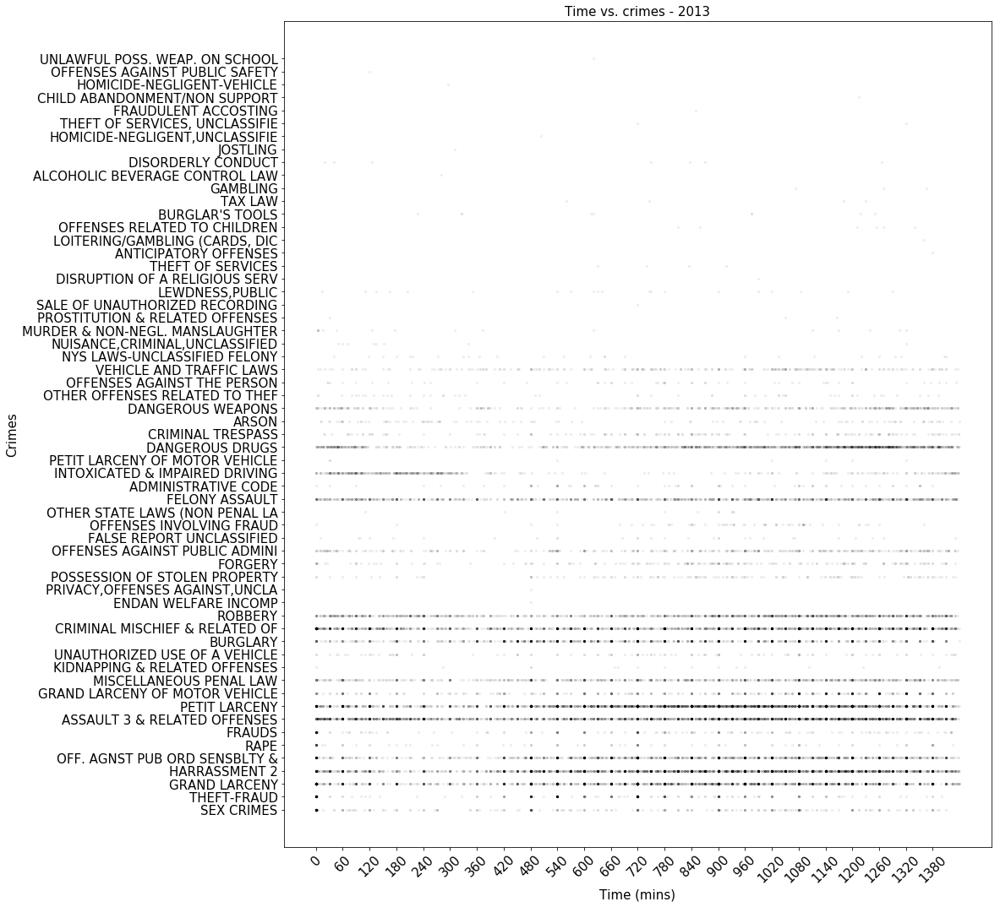

In [37]:
scatt_plot('BROOKLYN', '2013')

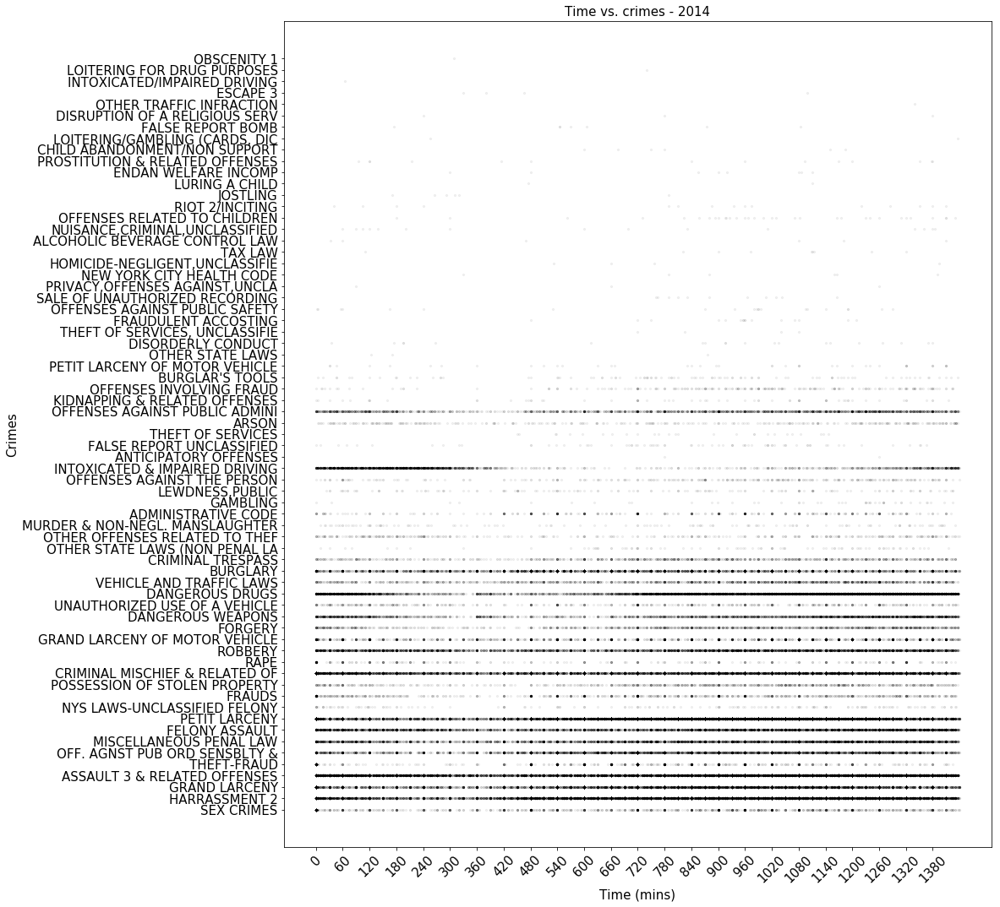

In [38]:
scatt_plot('BROOKLYN', '2014')

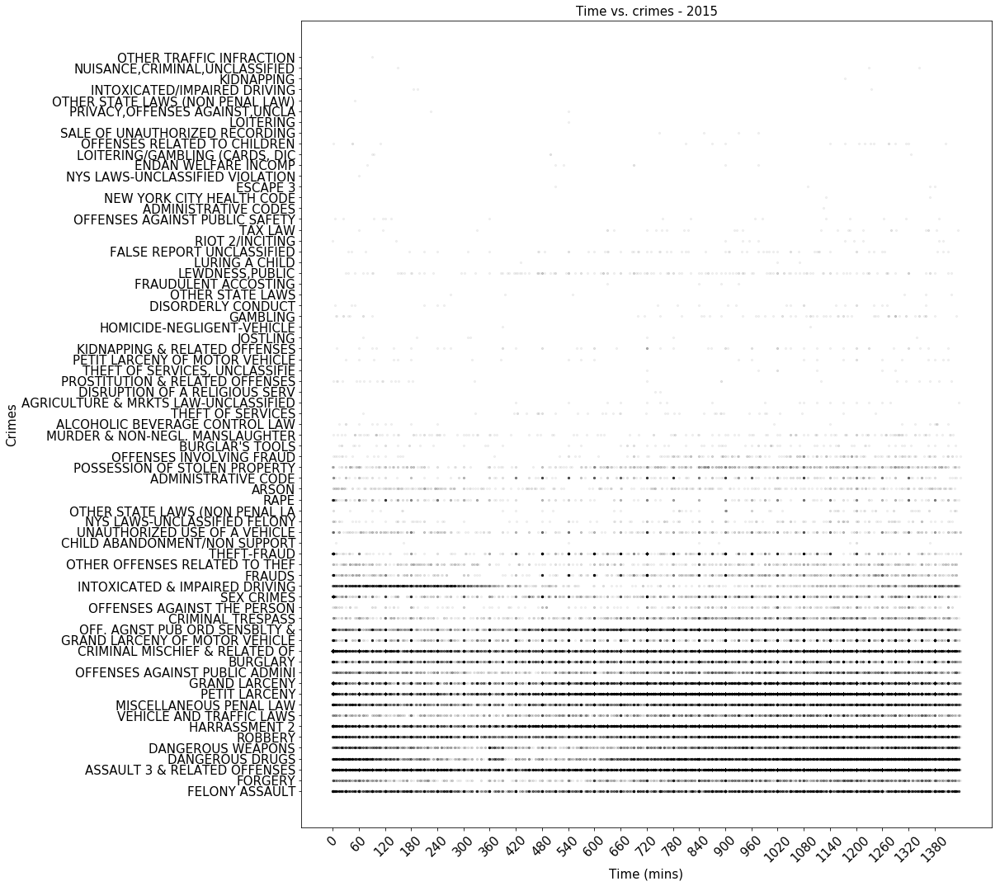

In [39]:
scatt_plot('BROOKLYN', '2015')

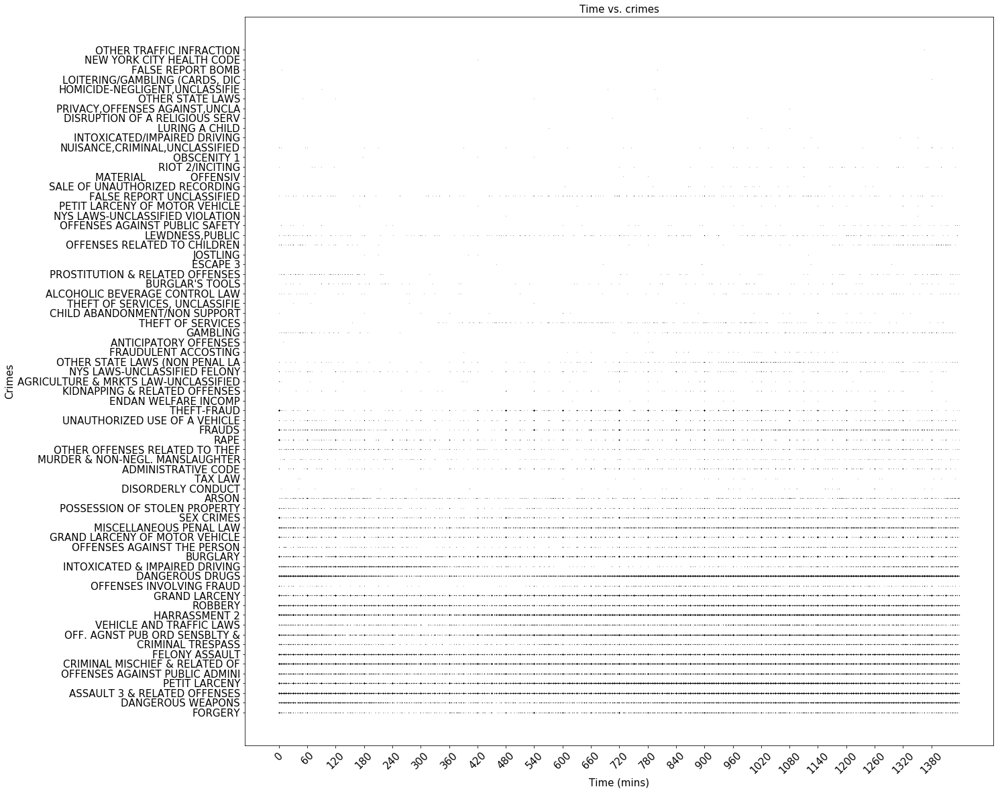

In [40]:
## set the figure dimensions
scat_fig = plt.figure(figsize = (20, 20))
scat_desc = []
scat_time = []
for x,y,z in zip(dfh1['Borough'],dfh1['Description'],dfh1['Time']):
    if x == 'BRONX':
        scat_desc.append(y)
#         scat_time.append(z)
        j = z.split(':',2)
        k = (int(j[0]) * 60) + int(j[1])
        scat_time.append(int(k))
hou = np.arange(0, 1440, 60)
# print(hou)
# hour = []
# for x in hou:
#     hour.append(x/60)
# print(hour)
## make a scatter plot
_  = plt.scatter(
   scat_time,scat_desc,
   color = "black", s = 0.01, alpha = 1
)
## Set the tick and label fontsize
plt.tick_params(labelsize = 15)
## Set the title
_ = plt.title("Time vs. crimes", fontsize = 15)
## Set the y-label
_ = plt.ylabel("Crimes", fontsize = 15)
## Set the y-label
_ = plt.xlabel("Time (mins)", fontsize = 15)
## rotate the x-tick labels
_ = plt.xticks(rotation = 45)
_ = plt.xticks(hou)

In [41]:
#flourish = dict(max_crimes_in_boro_time_diff('MANHATTAN',0,23,5))

In [47]:
# Counter boro_desc_date contains ('Borough','Crime description','date')
boro_desc_date = Counter()
for x in zip(dfh1['Borough'],dfh1['Description'],dfh1['Date']):
    boro_desc_date[x] += 1
pprint(boro_desc_date)

Counter({('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '1/1/2015'): 225,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '1/1/2014'): 189,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '5/1/2015'): 176,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '4/1/2015'): 116,
         ('BROOKLYN', 'PETIT LARCENY', '8/1/2014'): 113,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '1/1/2014'): 113,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '4/1/2014'): 112,
         ('MANHATTAN', 'PETIT LARCENY', '6/20/2014'): 112,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '1/1/2015'): 106,
         ('MANHATTAN', 'PETIT LARCENY', '4/22/2015'): 101,
         ('MANHATTAN', 'PETIT LARCENY', '5/30/2015'): 101,
         ('MANHATTAN', 'PETIT LARCENY', '7/24/2015'): 99,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '1/1/2015'): 99,
         ('MANHATTAN', 'PETIT LARCENY', '6/24/2015'): 99,
         ('MANHATTAN', 'PETIT LARCENY', '7/28/2015'): 99,
       

         ('BROOKLYN', 'PETIT LARCENY', '6/2/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '9/29/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '9/23/2015'): 65,
         ('BROOKLYN', 'HARRASSMENT 2', '6/24/2015'): 65,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '4/18/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '6/27/2015'): 65,
         ('BROOKLYN', 'HARRASSMENT 2', '7/29/2015'): 65,
         ('BROOKLYN', 'HARRASSMENT 2', '5/21/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '4/6/2015'): 65,
         ('BROOKLYN', 'HARRASSMENT 2', '6/13/2015'): 65,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '2/1/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '3/28/2015'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '2/17/2015'): 65,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '9/18/2014'): 65,
         ('BROOKLYN', 'PETIT LARCENY', '7/4/2014'): 65,
         ('MANHATTAN', 'PETIT LARCENY', '7/4/2014'): 65,
         ('BROOKLYN', 'PETIT LARCENY',

         ('MANHATTAN', 'PETIT LARCENY', '10/10/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '3/3/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '5/12/2014'): 59,
         ('MANHATTAN', 'GRAND LARCENY', '7/22/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '9/7/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '6/17/2015'): 59,
         ('BROOKLYN', 'PETIT LARCENY', '6/29/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '7/31/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '8/22/2015'): 59,
         ('BROOKLYN', 'HARRASSMENT 2', '7/3/2015'): 59,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '6/21/2015'): 59,
         ('MANHATTAN', 'PETIT LARCENY', '7/5/2015'): 59,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '8/22/2015'): 59,
         ('MANHATTAN', 'PETIT LARCENY', '8/2/2015'): 59,
         ('QUEENS', 'PETIT LARCENY', '4/15/2015'): 59,
         ('QUEENS', 'PETIT LARCENY', '7/27/2015'): 59,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '8/5/2015

         ('BRONX', 'HARRASSMENT 2', '9/9/2015'): 53,
         ('MANHATTAN', 'GRAND LARCENY', '11/15/2014'): 53,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '10/9/2014'): 53,
         ('MANHATTAN', 'GRAND LARCENY', '7/1/2014'): 53,
         ('BROOKLYN', 'HARRASSMENT 2', '10/1/2015'): 53,
         ('MANHATTAN', 'PETIT LARCENY', '4/5/2015'): 53,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '10/31/2015'): 53,
         ('BROOKLYN', 'HARRASSMENT 2', '9/22/2015'): 53,
         ('MANHATTAN', 'GRAND LARCENY', '8/28/2015'): 53,
         ('MANHATTAN', 'GRAND LARCENY', '8/19/2015'): 53,
         ('QUEENS', 'PETIT LARCENY', '7/16/2015'): 53,
         ('BROOKLYN', 'PETIT LARCENY', '9/10/2015'): 53,
         ('BROOKLYN', 'HARRASSMENT 2', '10/12/2015'): 53,
         ('BROOKLYN', 'HARRASSMENT 2', '10/7/2015'): 53,
         ('MANHATTAN', 'PETIT LARCENY', '8/11/2015'): 53,
         ('BROOKLYN', 'HARRASSMENT 2', '9/28/2015'): 53,
         ('QUEENS', 'PETIT LARCENY', '8/29/2015'): 53,
  

         ('BROOKLYN', 'HARRASSMENT 2', '7/10/2015'): 48,
         ('BROOKLYN', 'GRAND LARCENY', '4/27/2015'): 48,
         ('MANHATTAN', 'GRAND LARCENY', '7/3/2014'): 48,
         ('QUEENS', 'PETIT LARCENY', '7/8/2015'): 48,
         ('BROOKLYN', 'HARRASSMENT 2', '10/8/2015'): 48,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '10/7/2015'): 48,
         ('MANHATTAN', 'GRAND LARCENY', '7/27/2015'): 48,
         ('BROOKLYN', 'PETIT LARCENY', '4/12/2015'): 48,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '9/18/2015'): 48,
         ('BRONX', 'HARRASSMENT 2', '4/16/2015'): 48,
         ('QUEENS', 'HARRASSMENT 2', '9/18/2015'): 48,
         ('QUEENS', 'PETIT LARCENY', '9/9/2015'): 48,
         ('BRONX', 'PETIT LARCENY', '7/31/2015'): 48,
         ('BRONX', 'PETIT LARCENY', '4/25/2015'): 48,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '8/20/2015'): 48,
         ('BROOKLYN', 'HARRASSMENT 2', '8/12/2015'): 48,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '9/8/2

         ('BRONX', 'PETIT LARCENY', '6/13/2014'): 46,
         ('BROOKLYN', 'GRAND LARCENY', '12/9/2013'): 46,
         ('BROOKLYN', 'HARRASSMENT 2', '3/10/2014'): 46,
         ('BROOKLYN', 'PETIT LARCENY', '11/1/2013'): 46,
         ('QUEENS', 'PETIT LARCENY', '3/12/2014'): 46,
         ('MANHATTAN', 'GRAND LARCENY', '2/28/2014'): 46,
         ('BRONX', 'HARRASSMENT 2', '6/4/2014'): 46,
         ('MANHATTAN', 'GRAND LARCENY', '4/12/2014'): 46,
         ('QUEENS', 'PETIT LARCENY', '3/26/2014'): 46,
         ('QUEENS', 'PETIT LARCENY', '5/15/2014'): 46,
         ('BROOKLYN', 'HARRASSMENT 2', '1/30/2014'): 46,
         ('BRONX', 'PETIT LARCENY', '3/24/2014'): 46,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '11/6/2013'): 46,
         ('BRONX', 'PETIT LARCENY', '2/22/2014'): 46,
         ('BRONX', 'DANGEROUS DRUGS', '5/8/2014'): 46,
         ('BROOKLYN', 'GRAND LARCENY', '12/11/2013'): 46,
         ('QUEENS', 'PETIT LARCENY', '3/16/2014'): 46,
         ('MANHATTAN', 'GRAND LARCENY',

         ('BRONX', 'PETIT LARCENY', '6/5/2015'): 43,
         ('BRONX', 'PETIT LARCENY', '8/22/2015'): 43,
         ('MANHATTAN', 'GRAND LARCENY', '8/5/2015'): 43,
         ('MANHATTAN', 'HARRASSMENT 2', '6/1/2015'): 43,
         ('BROOKLYN', 'HARRASSMENT 2', '10/17/2015'): 43,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '10/9/2015'): 43,
         ('QUEENS', 'PETIT LARCENY', '9/27/2015'): 43,
         ('BROOKLYN', 'GRAND LARCENY', '6/10/2015'): 43,
         ('BROOKLYN', 'HARRASSMENT 2', '10/18/2015'): 43,
         ('BRONX', 'HARRASSMENT 2', '9/20/2015'): 43,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '10/8/2015'): 43,
         ('BRONX', 'DANGEROUS DRUGS', '10/15/2015'): 43,
         ('BRONX', 'PETIT LARCENY', '9/27/2015'): 43,
         ('QUEENS', 'PETIT LARCENY', '8/28/2015'): 43,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '10/11/2015'): 43,
         ('BROOKLYN', 'GRAND LARCENY', '7/23/2015'): 43,
         ('MANHATTAN', 'GRAND LARCENY', '2/1/2015'): 43,
  

         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1/25/2015'): 42,
         ('MANHATTAN', 'HARRASSMENT 2', '8/26/2014'): 42,
         ('BRONX', 'DANGEROUS DRUGS', '1/16/2014'): 42,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12/17/2014'): 42,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '11/9/2014'): 42,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '12/18/2014'): 42,
         ('BRONX', 'HARRASSMENT 2', '8/25/2014'): 42,
         ('BROOKLYN', 'GRAND LARCENY', '12/20/2013'): 42,
         ('BROOKLYN', 'PETIT LARCENY', '12/21/2014'): 42,
         ('MANHATTAN', 'HARRASSMENT 2', '12/12/2014'): 42,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '12/25/2014'): 42,
         ('BRONX', 'HARRASSMENT 2', '11/12/2014'): 42,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '7/13/2014'): 42,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '10/28/2014'): 42,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '12/6/2014'): 42,
         ('MANHATTA

         ('BROOKLYN', 'HARRASSMENT 2', '1/28/2014'): 41,
         ('QUEENS', 'PETIT LARCENY', '12/15/2013'): 41,
         ('BROOKLYN', 'GRAND LARCENY', '11/30/2013'): 41,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1/10/2014'): 41,
         ('BRONX', 'PETIT LARCENY', '12/18/2013'): 41,
         ('BRONX', 'PETIT LARCENY', '12/30/2013'): 41,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12/30/2013'): 41,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12/31/2013'): 41,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '12/8/2013'): 41,
         ('QUEENS', 'PETIT LARCENY', '11/11/2013'): 41,
         ('MANHATTAN', 'PETIT LARCENY', '12/8/2013'): 41,
         ('BRONX', 'PETIT LARCENY', '11/22/2013'): 41,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '11/18/2013'): 41,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '11/16/2013'): 41,
         ('QUEENS', 'HARRASSMENT 2', '11/14/2013'): 41,
         ('BRONX', 'PETIT LARCENY', '11/30/2015'): 40,
    

         ('BRONX', 'PETIT LARCENY', '5/30/2015'): 39,
         ('BRONX', 'PETIT LARCENY', '1/16/2014'): 39,
         ('QUEENS', 'PETIT LARCENY', '8/14/2015'): 39,
         ('BRONX', 'PETIT LARCENY', '2/16/2015'): 39,
         ('MANHATTAN', 'GRAND LARCENY', '6/17/2015'): 39,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '5/6/2015'): 39,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '7/18/2015'): 39,
         ('BRONX', 'PETIT LARCENY', '6/26/2015'): 39,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '8/31/2015'): 39,
         ('MANHATTAN', 'HARRASSMENT 2', '5/22/2014'): 39,
         ('MANHATTAN', 'GRAND LARCENY', '7/19/2015'): 39,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '6/19/2015'): 39,
         ('MANHATTAN', 'GRAND LARCENY', '6/3/2015'): 39,
         ('MANHATTAN', 'HARRASSMENT 2', '6/4/2015'): 39,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '8/14/2015'): 39,
         ('QUEENS', 'HARRASSMENT 2', '7/15/2015'): 39,
         ('QUEENS', 'HA

         ('QUEENS', 'HARRASSMENT 2', '12/10/2015'): 37,
         ('MANHATTAN', 'HARRASSMENT 2', '12/4/2015'): 37,
         ('BROOKLYN', 'PETIT LARCENY', '12/26/2015'): 37,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '12/23/2015'): 37,
         ('MANHATTAN', 'GRAND LARCENY', '12/21/2015'): 37,
         ('MANHATTAN', 'HARRASSMENT 2', '12/20/2015'): 37,
         ('BROOKLYN', 'GRAND LARCENY', '12/11/2015'): 37,
         ('BROOKLYN', 'HARRASSMENT 2', '11/24/2015'): 37,
         ('QUEENS', 'PETIT LARCENY', '9/7/2015'): 37,
         ('BRONX', 'PETIT LARCENY', '12/26/2015'): 37,
         ('BRONX', 'PETIT LARCENY', '12/15/2015'): 37,
         ('BRONX', 'PETIT LARCENY', '12/9/2015'): 37,
         ('BRONX', 'HARRASSMENT 2', '12/3/2015'): 37,
         ('MANHATTAN', 'GRAND LARCENY', '1/14/2014'): 37,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '12/17/2015'): 37,
         ('BRONX', 'PETIT LARCENY', '12/17/2015'): 37,
         ('BROOKLYN', 'HARRASSMENT 2', '12/1/2015'): 37,
    

         ('BRONX', 'PETIT LARCENY', '11/7/2014'): 36,
         ('BROOKLYN', 'GRAND LARCENY', '9/29/2014'): 36,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '9/19/2014'): 36,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '10/27/2014'): 36,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1/9/2015'): 36,
         ('QUEENS', 'PETIT LARCENY', '4/2/2014'): 36,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '1/4/2015'): 36,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '12/14/2014'): 36,
         ('BRONX', 'PETIT LARCENY', '1/7/2014'): 36,
         ('MANHATTAN', 'HARRASSMENT 2', '11/26/2014'): 36,
         ('MANHATTAN', 'HARRASSMENT 2', '11/11/2014'): 36,
         ('QUEENS', 'PETIT LARCENY', '12/21/2014'): 36,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '12/16/2014'): 36,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '12/4/2014'): 36,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '8/9/2014'): 36,
         ('BRONX', 'ASSAULT 3 & RELAT

         ('BRONX', 'PETIT LARCENY', '8/13/2015'): 34,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '11/28/2014'): 34,
         ('BROOKLYN', 'GRAND LARCENY', '11/16/2014'): 34,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '8/20/2015'): 34,
         ('QUEENS', 'HARRASSMENT 2', '1/16/2015'): 34,
         ('BRONX', 'PETIT LARCENY', '1/7/2015'): 34,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '6/5/2015'): 34,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '8/31/2014'): 34,
         ('BRONX', 'HARRASSMENT 2', '4/15/2014'): 34,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '8/11/2015'): 34,
         ('BROOKLYN', 'GRAND LARCENY', '3/11/2015'): 34,
         ('QUEENS', 'HARRASSMENT 2', '7/21/2015'): 34,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '7/24/2015'): 34,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '12/11/2014'): 34,
         ('BRONX', 'DANGEROUS DRUGS', '8/15/2015'): 34,
         ('BROOKLYN', 'DANGEROUS DRUGS', '8/13/2015'): 

         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '8/7/2014'): 33,
         ('BRONX', 'DANGEROUS DRUGS', '7/16/2015'): 33,
         ('MANHATTAN', 'GRAND LARCENY', '7/5/2015'): 33,
         ('BROOKLYN', 'GRAND LARCENY', '5/12/2015'): 33,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '9/15/2014'): 33,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '6/28/2015'): 33,
         ('BRONX', 'DANGEROUS DRUGS', '7/7/2015'): 33,
         ('MANHATTAN', 'HARRASSMENT 2', '8/28/2014'): 33,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '5/2/2015'): 33,
         ('BRONX', 'HARRASSMENT 2', '5/18/2015'): 33,
         ('BRONX', 'PETIT LARCENY', '3/5/2015'): 33,
         ('BRONX', 'DANGEROUS DRUGS', '6/23/2015'): 33,
         ('BRONX', 'PETIT LARCENY', '3/3/2015'): 33,
         ('MANHATTAN', 'HARRASSMENT 2', '12/27/2014'): 33,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '6/5/2015'): 33,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '6/9/2015'): 33,
      

         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '4/18/2014'): 32,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '6/6/2014'): 32,
         ('MANHATTAN', 'DANGEROUS DRUGS', '6/11/2014'): 32,
         ('MANHATTAN', 'HARRASSMENT 2', '4/19/2014'): 32,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '5/10/2014'): 32,
         ('BROOKLYN', 'BURGLARY', '5/23/2014'): 32,
         ('MANHATTAN', 'HARRASSMENT 2', '2/6/2014'): 32,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '6/4/2014'): 32,
         ('BROOKLYN', 'DANGEROUS DRUGS', '6/3/2014'): 32,
         ('BRONX', 'HARRASSMENT 2', '3/21/2014'): 32,
         ('MANHATTAN', 'GRAND LARCENY', '5/25/2014'): 32,
         ('MANHATTAN', 'DANGEROUS DRUGS', '5/31/2014'): 32,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '5/16/2014'): 32,
         ('BRONX', 'PETIT LARCENY', '4/25/2014'): 32,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '5/24/2014'): 32,
         ('BRONX', 'PETIT LARCENY', '4/19/2014'): 32,
         (

         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '2/3/2015'): 30,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '3/27/2015'): 30,
         ('MANHATTAN', 'HARRASSMENT 2', '12/26/2014'): 30,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '5/24/2015'): 30,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '5/17/2015'): 30,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '4/28/2015'): 30,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '5/19/2015'): 30,
         ('QUEENS', 'HARRASSMENT 2', '5/19/2015'): 30,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '5/19/2015'): 30,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '5/13/2015'): 30,
         ('MANHATTAN', 'HARRASSMENT 2', '12/28/2014'): 30,
         ('BRONX', 'DANGEROUS DRUGS', '5/14/2015'): 30,
         ('BROOKLYN', 'GRAND LARCENY', '3/20/2015'): 30,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '4/2/2015'): 30,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '12/30/2014'): 30,

         ('BROOKLYN', 'DANGEROUS DRUGS', '9/2/2015'): 29,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '8/29/2015'): 29,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '8/23/2015'): 29,
         ('BROOKLYN', 'GRAND LARCENY', '7/30/2015'): 29,
         ('MANHATTAN', 'DANGEROUS DRUGS', '8/28/2015'): 29,
         ('BRONX', 'FELONY ASSAULT', '7/26/2015'): 29,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/29/2015'): 29,
         ('BROOKLYN', 'DANGEROUS DRUGS', '8/18/2015'): 29,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '8/3/2015'): 29,
         ('QUEENS', 'PETIT LARCENY', '2/10/2015'): 29,
         ('BRONX', 'PETIT LARCENY', '2/6/2015'): 29,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '7/25/2015'): 29,
         ('BRONX', 'DANGEROUS DRUGS', '8/13/2015'): 29,
         ('QUEENS', 'GRAND LARCENY', '1/15/2015'): 29,
         ('QUEENS', 'PETIT LARCENY', '7/18/2015'): 29,
         ('QUEENS', 'GRAND LARCENY', '1/17/2015'): 29,
         ('MANH

         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '9/3/2015'): 28,
         ('BROOKLYN', 'GRAND LARCENY', '8/12/2015'): 28,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '7/27/2015'): 28,
         ('QUEENS', 'HARRASSMENT 2', '6/12/2015'): 28,
         ('QUEENS', 'HARRASSMENT 2', '8/11/2015'): 28,
         ('MANHATTAN', 'HARRASSMENT 2', '1/20/2015'): 28,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '8/22/2015'): 28,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '7/28/2015'): 28,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '8/24/2015'): 28,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '8/21/2015'): 28,
         ('QUEENS', 'HARRASSMENT 2', '2/20/2015'): 28,
         ('BRONX', 'FELONY ASSAULT', '8/22/2015'): 28,
         ('BROOKLYN', 'DANGEROUS DRUGS', '8/20/2015'): 28,
         ('MANHATTAN', 'HARRASSMENT 2', '8/9/2015'): 28,
         ('QUEENS', 'GRAND LARCENY', '1/8/2015'): 28,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '4/5/2015')

         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '10/3/2014'): 27,
         ('QUEENS', 'HARRASSMENT 2', '11/7/2014'): 27,
         ('QUEENS', 'GRAND LARCENY', '9/13/2014'): 27,
         ('QUEENS', 'HARRASSMENT 2', '11/20/2014'): 27,
         ('MANHATTAN', 'HARRASSMENT 2', '11/17/2014'): 27,
         ('QUEENS', 'GRAND LARCENY', '6/16/2014'): 27,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '9/25/2014'): 27,
         ('BROOKLYN', 'GRAND LARCENY', '8/31/2014'): 27,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '11/10/2014'): 27,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '11/14/2014'): 27,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '11/18/2014'): 27,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '10/2/2014'): 27,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '11/17/2014'): 27,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '11/15/2014'): 27,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '5/15/2014'): 27,
         ('BR

         ('BROOKLYN', 'ROBBERY', '1/27/2014'): 26,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '2/26/2014'): 26,
         ('BROOKLYN', 'GRAND LARCENY', '1/31/2014'): 26,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '2/7/2014'): 26,
         ('BRONX', 'DANGEROUS DRUGS', '2/27/2014'): 26,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '2/21/2014'): 26,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '2/19/2014'): 26,
         ('QUEENS', 'HARRASSMENT 2', '1/23/2014'): 26,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '11/11/2013'): 26,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '2/14/2014'): 26,
         ('BRONX', 'HARRASSMENT 2', '2/9/2014'): 26,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '11/23/2013'): 26,
         ('BROOKLYN', 'ROBBERY', '2/16/2014'): 26,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '1/23/2014'): 26,
         ('QUEENS', 'HARRASSMENT 2', '1/24/2014'): 26,
         ('BROOKLYN', 'BURGLARY', '11/6/2013'):

         ('MANHATTAN', 'HARRASSMENT 2', '1/25/2014'): 25,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '6/19/2014'): 25,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '6/12/2014'): 25,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '4/4/2014'): 25,
         ('QUEENS', 'HARRASSMENT 2', '12/14/2013'): 25,
         ('MANHATTAN', 'DANGEROUS DRUGS', '6/12/2014'): 25,
         ('QUEENS', 'FELONY ASSAULT', '6/6/2014'): 25,
         ('BRONX', 'PETIT LARCENY', '3/13/2014'): 25,
         ('MANHATTAN', 'GRAND LARCENY', '12/25/2013'): 25,
         ('BRONX', 'DANGEROUS DRUGS', '6/7/2014'): 25,
         ('BRONX', 'HARRASSMENT 2', '11/1/2013'): 25,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '5/31/2014'): 25,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '1/27/2014'): 25,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '3/28/2014'): 25,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '4/16/2014'): 25,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', 

         ('BROOKLYN', 'BURGLARY', '11/25/2015'): 23,
         ('QUEENS', 'GRAND LARCENY', '12/31/2014'): 23,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '12/11/2015'): 23,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '12/17/2015'): 23,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '12/17/2015'): 23,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '12/17/2015'): 23,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '11/25/2015'): 23,
         ('BROOKLYN', 'GRAND LARCENY', '3/10/2015'): 23,
         ('BRONX', 'GRAND LARCENY', '10/19/2015'): 23,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11/24/2015'): 23,
         ('QUEENS', 'GRAND LARCENY', '11/5/2015'): 23,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '12/8/2015'): 23,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '11/23/2015'): 23,
         ('BRONX', 'GRAND LARCENY', '9/23/2015'): 23,
         ('QUEENS', 'GRAND LARCENY', '7/7/2015'): 23,
         ('QUEENS', 'GRAND LARCENY', '11

         ('BRONX', 'FELONY ASSAULT', '4/18/2015'): 22,
         ('BROOKLYN', 'GRAND LARCENY', '3/15/2015'): 22,
         ('BROOKLYN', 'DANGEROUS DRUGS', '7/18/2015'): 22,
         ('BRONX', 'GRAND LARCENY', '12/4/2014'): 22,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '7/9/2015'): 22,
         ('BROOKLYN', 'GRAND LARCENY', '2/11/2015'): 22,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '1/11/2015'): 22,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '4/20/2015'): 22,
         ('MANHATTAN', 'DANGEROUS DRUGS', '7/4/2015'): 22,
         ('MANHATTAN', 'HARRASSMENT 2', '12/24/2014'): 22,
         ('BRONX', 'FELONY ASSAULT', '6/9/2014'): 22,
         ('MANHATTAN', 'DANGEROUS DRUGS', '6/27/2015'): 22,
         ('BROOKLYN', 'ROBBERY', '6/24/2015'): 22,
         ('MANHATTAN', 'HARRASSMENT 2', '2/2/2015'): 22,
         ('BRONX', 'GRAND LARCENY', '7/15/2014'): 22,
         ('BROOKLYN', 'GRAND LARCENY', '5/25/2015'): 22,
         ('STATEN ISLAND', 'HARRASSMENT 2', '

         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '4/17/2015'): 21,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/8/2015'): 21,
         ('STATEN ISLAND', 'HARRASSMENT 2', '3/16/2015'): 21,
         ('BROOKLYN', 'FELONY ASSAULT', '4/21/2015'): 21,
         ('BROOKLYN', 'ROBBERY', '3/31/2015'): 21,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10/31/2014'): 21,
         ('BRONX', 'GRAND LARCENY', '5/9/2014'): 21,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '2/26/2015'): 21,
         ('QUEENS', 'GRAND LARCENY', '7/8/2014'): 21,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '4/17/2015'): 21,
         ('BROOKLYN', 'ROBBERY', '4/11/2015'): 21,
         ('QUEENS', 'GRAND LARCENY', '9/8/2014'): 21,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '3/31/2015'): 21,
         ('QUEENS', 'GRAND LARCENY', '4/24/2014'): 21,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/14/2014'): 21,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '4/5/2015'):

         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '4/2/2014'): 20,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11/3/2013'): 20,
         ('BRONX', 'FELONY ASSAULT', '3/15/2014'): 20,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '4/11/2014'): 20,
         ('QUEENS', 'GRAND LARCENY', '2/2/2014'): 20,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/5/2014'): 20,
         ('BROOKLYN', 'FELONY ASSAULT', '5/6/2014'): 20,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '1/18/2014'): 20,
         ('BRONX', 'FELONY ASSAULT', '4/12/2014'): 20,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '11/20/2013'): 20,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/24/2014'): 20,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '4/28/2014'): 20,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '4/26/2014'): 20,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/26/2014'): 20,
         ('QUEENS', 'GRAND LARCENY', '1/28/2014'): 20,
  

         ('QUEENS', 'GRAND LARCENY', '1/13/2014'): 19,
         ('BROOKLYN', 'ROBBERY', '8/10/2014'): 19,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '5/22/2014'): 19,
         ('MANHATTAN', 'DANGEROUS DRUGS', '8/12/2014'): 19,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '7/30/2014'): 19,
         ('QUEENS', 'GRAND LARCENY', '5/26/2014'): 19,
         ('BROOKLYN', 'FELONY ASSAULT', '8/6/2014'): 19,
         ('BROOKLYN', 'ROBBERY', '7/23/2014'): 19,
         ('BROOKLYN', 'FELONY ASSAULT', '7/12/2014'): 19,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '7/29/2014'): 19,
         ('QUEENS', 'GRAND LARCENY', '1/25/2014'): 19,
         ('BRONX', 'BURGLARY', '7/21/2014'): 19,
         ('BROOKLYN', 'ROBBERY', '6/17/2014'): 19,
         ('BROOKLYN', 'BURGLARY', '2/10/2014'): 19,
         ('BROOKLYN', 'ROBBERY', '7/27/2014'): 19,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '7/24/2014'): 19,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '7/23/2014'): 19,
       

         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '10/5/2014'): 18,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '8/26/2014'): 18,
         ('BRONX', 'FELONY ASSAULT', '9/20/2014'): 18,
         ('BRONX', 'DANGEROUS DRUGS', '10/5/2014'): 18,
         ('QUEENS', 'ROBBERY', '9/20/2014'): 18,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '9/7/2014'): 18,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/22/2014'): 18,
         ('BRONX', 'GRAND LARCENY', '9/11/2014'): 18,
         ('BRONX', 'GRAND LARCENY', '9/21/2014'): 18,
         ('BROOKLYN', 'DANGEROUS DRUGS', '9/25/2014'): 18,
         ('QUEENS', 'FELONY ASSAULT', '9/7/2014'): 18,
         ('BROOKLYN', 'FELONY ASSAULT', '3/1/2014'): 18,
         ('BRONX', 'DANGEROUS DRUGS', '9/22/2014'): 18,
         ('BRONX', 'FELONY ASSAULT', '7/14/2014'): 18,
         ('BROOKLYN', 'BURGLARY', '9/21/2014'): 18,
         ('BRONX', 'ROBBERY', '9/19/2014'): 18,
         ('BROOKLYN', 'ROBBERY', '9/17/2014'): 18,
         ('BRONX', 'DANG

         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '1/28/2015'): 17,
         ('BRONX', 'DANGEROUS DRUGS', '2/15/2015'): 17,
         ('BRONX', 'DANGEROUS DRUGS', '2/14/2015'): 17,
         ('MANHATTAN', 'DANGEROUS DRUGS', '2/14/2015'): 17,
         ('BROOKLYN', 'DANGEROUS DRUGS', '2/13/2015'): 17,
         ('QUEENS', 'FELONY ASSAULT', '2/12/2015'): 17,
         ('BRONX', 'ROBBERY', '2/10/2015'): 17,
         ('BRONX', 'GRAND LARCENY', '12/29/2014'): 17,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '2/5/2015'): 17,
         ('BROOKLYN', 'FELONY ASSAULT', '1/11/2015'): 17,
         ('BROOKLYN', 'FELONY ASSAULT', '2/7/2015'): 17,
         ('BROOKLYN', 'DANGEROUS DRUGS', '2/7/2015'): 17,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '1/7/2015'): 17,
         ('MANHATTAN', 'DANGEROUS DRUGS', '2/18/2014'): 17,
         ('BROOKLYN', 'ROBBERY', '2/6/2015'): 17,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/5/2014'): 17,
         ('BROOKLYN', 'OFF. AGNST PUB OR

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '8/13/2014'): 16,
         ('MANHATTAN', 'ROBBERY', '8/5/2015'): 16,
         ('BROOKLYN', 'DANGEROUS DRUGS', '8/10/2015'): 16,
         ('BROOKLYN', 'FELONY ASSAULT', '8/9/2015'): 16,
         ('BRONX', 'FELONY ASSAULT', '8/6/2015'): 16,
         ('QUEENS', 'GRAND LARCENY', '7/4/2015'): 16,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '8/4/2015'): 16,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '7/15/2015'): 16,
         ('BRONX', 'ROBBERY', '8/5/2015'): 16,
         ('QUEENS', 'FELONY ASSAULT', '8/1/2015'): 16,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '8/2/2015'): 16,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '2/1/2015'): 16,
         ('BRONX', 'GRAND LARCENY', '3/3/2014'): 16,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '8/1/2015'): 16,
         ('BRONX', 'GRAND LARCENY', '7/20/2015'): 16,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '7/31/2015'): 16,
         ('STATEN ISLAND', 'CRIMINAL M

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '11/22/2013'): 16,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '11/19/2013'): 16,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '12/2/2013'): 16,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '11/28/2013'): 16,
         ('MANHATTAN', 'DANGEROUS DRUGS', '12/3/2013'): 16,
         ('BRONX', 'GRAND LARCENY', '11/11/2013'): 16,
         ('BROOKLYN', 'FELONY ASSAULT', '11/23/2013'): 16,
         ('BROOKLYN', 'DANGEROUS DRUGS', '11/30/2013'): 16,
         ('BRONX', 'FELONY ASSAULT', '11/26/2013'): 16,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '11/22/2013'): 16,
         ('BROOKLYN', 'FELONY ASSAULT', '11/26/2013'): 16,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/18/2013'): 16,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11/9/2013'): 16,
         ('BROOKLYN', 'ROBBERY', '11/23/2013'): 16,
         ('BROOKLYN', 'FELONY ASSAULT', '11/9/2013'): 16,
         ('BROOKLYN', 'ROBBERY', '11/21/2013'): 1

         ('MANHATTAN', 'DANGEROUS DRUGS', '5/11/2014'): 15,
         ('MANHATTAN', 'ROBBERY', '5/10/2014'): 15,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '5/9/2014'): 15,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '4/25/2014'): 15,
         ('BROOKLYN', 'ROBBERY', '5/9/2014'): 15,
         ('QUEENS', 'FELONY ASSAULT', '5/7/2014'): 15,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '2/9/2014'): 15,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '5/5/2014'): 15,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '5/4/2014'): 15,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '4/17/2014'): 15,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '2/7/2014'): 15,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '4/25/2014'): 15,
         ('BROOKLYN', 'DANGEROUS DRUGS', '5/5/2014'): 15,
         ('MANHATTAN', 'FELONY ASSAULT', '5/3/2014'): 15,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '2/10/2014'): 15,
         ('BROOKLYN', 'OFFENSES

         ('BRONX', 'GRAND LARCENY', '10/19/2014'): 14,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '11/15/2014'): 14,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/13/2014'): 14,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '11/6/2014'): 14,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '9/28/2014'): 14,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '11/11/2014'): 14,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '11/9/2014'): 14,
         ('QUEENS', 'FELONY ASSAULT', '11/7/2014'): 14,
         ('MANHATTAN', 'FELONY ASSAULT', '11/9/2014'): 14,
         ('QUEENS', 'FELONY ASSAULT', '11/9/2014'): 14,
         ('BRONX', 'ROBBERY', '11/9/2014'): 14,
         ('BROOKLYN', 'FELONY ASSAULT', '11/7/2014'): 14,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '11/2/2014'): 14,
         ('MANHATTAN', 'BURGLARY', '5/20/2014'): 14,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '11/8/2014'): 14,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED O

         ('BRONX', 'FELONY ASSAULT', '9/17/2015'): 13,
         ('QUEENS', 'BURGLARY', '5/14/2015'): 13,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '5/3/2015'): 13,
         ('BRONX', 'ROBBERY', '9/16/2015'): 13,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '9/15/2015'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '9/3/2015'): 13,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8/30/2015'): 13,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '8/9/2015'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '7/30/2015'): 13,
         ('BROOKLYN', 'DANGEROUS DRUGS', '9/15/2015'): 13,
         ('STATEN ISLAND', 'HARRASSMENT 2', '9/3/2015'): 13,
         ('MANHATTAN', 'THEFT-FRAUD', '4/15/2015'): 13,
         ('MANHATTAN', 'FELONY ASSAULT', '9/13/2015'): 13,
         ('QUEENS', 'FELONY ASSAULT', '9/13/2015'): 13,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '9/11/2015'): 13,
         ('BRONX', 'GRAND LARCENY', '9/1/2015'): 13,
         ('STATEN

         ('BRONX', 'FELONY ASSAULT', '9/15/2014'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '8/3/2014'): 13,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '9/21/2014'): 13,
         ('STATEN ISLAND', 'HARRASSMENT 2', '9/20/2014'): 13,
         ('BROOKLYN', 'FELONY ASSAULT', '9/8/2014'): 13,
         ('STATEN ISLAND', 'PETIT LARCENY', '9/8/2014'): 13,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8/6/2014'): 13,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '9/17/2014'): 13,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '8/30/2014'): 13,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '9/17/2014'): 13,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '9/17/2014'): 13,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '9/12/2014'): 13,
         ('BRONX', 'BURGLARY', '9/9/2014'): 13,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/18/2014'): 13,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '5/17/2014'): 13,
         ('BRONX', 'OFF

         ('BRONX', 'FELONY ASSAULT', '10/16/2015'): 12,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '9/5/2015'): 12,
         ('QUEENS', 'DANGEROUS DRUGS', '10/16/2015'): 12,
         ('BRONX', 'ROBBERY', '10/16/2015'): 12,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '9/30/2015'): 12,
         ('STATEN ISLAND', 'HARRASSMENT 2', '9/29/2015'): 12,
         ('BRONX', 'FELONY ASSAULT', '9/14/2015'): 12,
         ('QUEENS', 'FELONY ASSAULT', '3/25/2015'): 12,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/18/2015'): 12,
         ('QUEENS', 'FELONY ASSAULT', '10/13/2015'): 12,
         ('MANHATTAN', 'DANGEROUS DRUGS', '10/11/2015'): 12,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '10/13/2015'): 12,
         ('QUEENS', 'BURGLARY', '10/9/2015'): 12,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '8/11/2015'): 12,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '10/10/2015'): 12,
         ('MANHATTAN', 'BURGLARY', '10/9/2015'): 12,
         ('STATEN ISLAND

         ('BRONX', 'BURGLARY', '11/26/2014'): 12,
         ('MANHATTAN', 'ROBBERY', '11/5/2014'): 12,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '11/26/2014'): 12,
         ('BRONX', 'GRAND LARCENY', '11/21/2014'): 12,
         ('BROOKLYN', 'DANGEROUS DRUGS', '12/1/2014'): 12,
         ('BRONX', 'DANGEROUS DRUGS', '12/1/2014'): 12,
         ('MANHATTAN', 'FELONY ASSAULT', '11/11/2014'): 12,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/2/2014'): 12,
         ('MANHATTAN', 'FELONY ASSAULT', '11/12/2014'): 12,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '11/30/2014'): 12,
         ('QUEENS', 'ROBBERY', '11/3/2014'): 12,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10/9/2014'): 12,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '9/30/2014'): 12,
         ('STATEN ISLAND', 'PETIT LARCENY', '10/29/2014'): 12,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '11/14/2014'): 12,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY 

         ('QUEENS', 'DANGEROUS WEAPONS', '11/30/2013'): 12,
         ('BRONX', 'DANGEROUS WEAPONS', '11/29/2013'): 12,
         ('QUEENS', 'DANGEROUS WEAPONS', '11/29/2013'): 12,
         ('BRONX', 'DANGEROUS DRUGS', '11/28/2013'): 12,
         ('MANHATTAN', 'BURGLARY', '11/26/2013'): 12,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '11/26/2013'): 12,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '11/26/2013'): 12,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/26/2013'): 12,
         ('MANHATTAN', 'DANGEROUS DRUGS', '11/26/2013'): 12,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/14/2013'): 12,
         ('BROOKLYN', 'DANGEROUS DRUGS', '11/25/2013'): 12,
         ('BROOKLYN', 'ROBBERY', '11/24/2013'): 12,
         ('BRONX', 'ROBBERY', '11/23/2013'): 12,
         ('MANHATTAN', 'BURGLARY', '11/22/2013'): 12,
         ('STATEN ISLAND', 'PETIT LARCENY', '11/18/2013'): 12,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '11/23/2013'): 12,
         ('BROOKLYN', 'DANGERO

         ('BRONX', 'GRAND LARCENY', '1/4/2015'): 11,
         ('BRONX', 'DANGEROUS WEAPONS', '5/9/2015'): 11,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '4/29/2015'): 11,
         ('BRONX', 'ROBBERY', '5/9/2015'): 11,
         ('BROOKLYN', 'DANGEROUS DRUGS', '5/8/2015'): 11,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/21/2014'): 11,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '5/6/2015'): 11,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '5/6/2015'): 11,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '4/27/2015'): 11,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '5/6/2015'): 11,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '4/27/2015'): 11,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '2/7/2015'): 11,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '5/5/2015'): 11,
         ('BROOKLYN', 'DANGEROUS DRUGS', '5/4/2015'): 11,
         ('BRONX', 'ROBBERY', '4/4/2015'): 11,
         ('STATEN ISLAND', 'HARRASSMENT 2', '5/5/2014'): 11,
         ('STATEN I

         ('BRONX', 'DANGEROUS WEAPONS', '7/11/2014'): 11,
         ('BROOKLYN', 'ROBBERY', '7/2/2014'): 11,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '7/1/2014'): 11,
         ('MANHATTAN', 'ROBBERY', '7/10/2014'): 11,
         ('QUEENS', 'ROBBERY', '7/10/2014'): 11,
         ('BRONX', 'FELONY ASSAULT', '6/27/2014'): 11,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '4/2/2014'): 11,
         ('QUEENS', 'DANGEROUS WEAPONS', '7/9/2014'): 11,
         ('MANHATTAN', 'FELONY ASSAULT', '7/8/2014'): 11,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '7/6/2014'): 11,
         ('MANHATTAN', 'BURGLARY', '7/4/2014'): 11,
         ('QUEENS', 'BURGLARY', '5/29/2014'): 11,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '5/29/2014'): 11,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '7/5/2014'): 11,
         ('MANHATTAN', 'FELONY ASSAULT', '6/23/2014'): 11,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '7/4/2014'): 11,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADM

         ('BRONX', 'DANGEROUS WEAPONS', '10/31/2015'): 10,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '10/2/2015'): 10,
         ('QUEENS', 'BURGLARY', '10/1/2015'): 10,
         ('STATEN ISLAND', 'PETIT LARCENY', '9/30/2015'): 10,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '10/22/2015'): 10,
         ('MANHATTAN', 'ROBBERY', '10/27/2015'): 10,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/24/2015'): 10,
         ('QUEENS', 'FELONY ASSAULT', '10/27/2015'): 10,
         ('BRONX', 'BURGLARY', '10/26/2015'): 10,
         ('BRONX', 'ROBBERY', '10/22/2015'): 10,
         ('MANHATTAN', 'THEFT-FRAUD', '5/1/2015'): 10,
         ('BRONX', 'FELONY ASSAULT', '10/26/2015'): 10,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '10/24/2015'): 10,
         ('BRONX', 'GRAND LARCENY', '9/16/2015'): 10,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '5/27/2015'): 10,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '10/24/2015'): 10,
         ('BROOKLYN', 'INTOXICAT

         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '4/10/2015'): 10,
         ('QUEENS', 'DANGEROUS WEAPONS', '5/20/2015'): 10,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '5/7/2015'): 10,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '5/21/2015'): 10,
         ('QUEENS', 'FELONY ASSAULT', '5/11/2015'): 10,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '5/19/2015'): 10,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '4/18/2015'): 10,
         ('BRONX', 'DANGEROUS WEAPONS', '5/19/2015'): 10,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '5/16/2015'): 10,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '5/13/2015'): 10,
         ('QUEENS', 'BURGLARY', '5/5/2015'): 10,
         ('BROOKLYN', 'THEFT-FRAUD', '4/15/2015'): 10,
         ('MANHATTAN', 'SEX CRIMES', '11/24/2014'): 10,
         ('BROOKLYN', 'ROBBERY', '5/17/2015'): 10,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '5/17/2015'): 10,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '5

         ('QUEENS', 'FELONY ASSAULT', '10/22/2014'): 10,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10/12/2014'): 10,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '8/1/2014'): 10,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '2/13/2014'): 10,
         ('QUEENS', 'ROBBERY', '11/16/2014'): 10,
         ('BRONX', 'ROBBERY', '11/16/2014'): 10,
         ('BRONX', 'FELONY ASSAULT', '11/15/2014'): 10,
         ('BRONX', 'ROBBERY', '11/15/2014'): 10,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '11/10/2014'): 10,
         ('QUEENS', 'DANGEROUS WEAPONS', '11/13/2014'): 10,
         ('MANHATTAN', 'FELONY ASSAULT', '11/13/2014'): 10,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '11/8/2014'): 10,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '9/21/2014'): 10,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11/13/2014'): 10,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '11/13/2014'): 10,
         ('MANHATTAN', 'BURGLARY', '11/12/2014'): 10,
   

         ('QUEENS', 'FELONY ASSAULT', '3/1/2014'): 10,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '2/28/2014'): 10,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '2/25/2014'): 10,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '1/16/2014'): 10,
         ('BROOKLYN', 'ROBBERY', '2/27/2014'): 10,
         ('QUEENS', 'DANGEROUS WEAPONS', '2/27/2014'): 10,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '2/24/2014'): 10,
         ('BRONX', 'ROBBERY', '2/26/2014'): 10,
         ('BRONX', 'DANGEROUS WEAPONS', '2/25/2014'): 10,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '2/25/2014'): 10,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '2/25/2014'): 10,
         ('STATEN ISLAND', 'HARRASSMENT 2', '2/25/2014'): 10,
         ('BROOKLYN', 'FELONY ASSAULT', '2/24/2014'): 10,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '2/20/2014'): 10,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '1/31/2014'): 10,
         ('QUEENS', 'DANGEROUS WEAPONS', '2/25/2014'): 10,
         ('MANHA

         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '8/13/2015'): 9,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/13/2015'): 9,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '8/13/2015'): 9,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '8/11/2015'): 9,
         ('BRONX', 'BURGLARY', '8/17/2014'): 9,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '8/16/2015'): 9,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '8/14/2015'): 9,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '8/13/2015'): 9,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '12/14/2014'): 9,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '8/14/2015'): 9,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '8/14/2015'): 9,
         ('MANHATTAN', 'ROBBERY', '8/14/2015'): 9,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '8/13/2015'): 9,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '8/13/2015'): 9,
         ('BRONX', 'BURGLARY', '8/8/2015'): 9,
         ('MANHATTAN',

         ('BROOKLYN', 'FELONY ASSAULT', '3/25/2015'): 9,
         ('QUEENS', 'FELONY ASSAULT', '3/24/2015'): 9,
         ('MANHATTAN', 'ROBBERY', '3/23/2015'): 9,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '3/18/2015'): 9,
         ('BRONX', 'BURGLARY', '3/17/2015'): 9,
         ('BROOKLYN', 'BURGLARY', '3/15/2015'): 9,
         ('BROOKLYN', 'THEFT-FRAUD', '7/1/2014'): 9,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/23/2015'): 9,
         ('BROOKLYN', 'ROBBERY', '3/23/2015'): 9,
         ('BRONX', 'FELONY ASSAULT', '3/20/2015'): 9,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '3/21/2015'): 9,
         ('BRONX', 'BURGLARY', '3/12/2015'): 9,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '1/18/2015'): 9,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/10/2014'): 9,
         ('MANHATTAN', 'THEFT-FRAUD', '2/20/2015'): 9,
         ('MANHATTAN', 'FORGERY', '2/13/2015'): 9,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '10/5/2014'): 9,
         ('BRONX'

         ('BRONX', 'MISCELLANEOUS PENAL LAW', '10/4/2014'): 9,
         ('MANHATTAN', 'FELONY ASSAULT', '10/9/2014'): 9,
         ('MANHATTAN', 'ROBBERY', '10/9/2014'): 9,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10/6/2014'): 9,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '10/3/2014'): 9,
         ('QUEENS', 'DANGEROUS DRUGS', '10/8/2014'): 9,
         ('BRONX', 'BURGLARY', '10/7/2014'): 9,
         ('MANHATTAN', 'FELONY ASSAULT', '10/7/2014'): 9,
         ('QUEENS', 'ROBBERY', '10/6/2014'): 9,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '10/4/2014'): 9,
         ('QUEENS', 'FELONY ASSAULT', '10/2/2014'): 9,
         ('QUEENS', 'DANGEROUS DRUGS', '10/6/2014'): 9,
         ('BRONX', 'DANGEROUS WEAPONS', '10/6/2014'): 9,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '10/4/2014'): 9,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '10/2/2014'): 9,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '9/14/2014'): 9,
         ('BROOKLYN', 'INTO

         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '5/3/2014'): 9,
         ('STATEN ISLAND', 'HARRASSMENT 2', '5/12/2014'): 9,
         ('QUEENS', 'BURGLARY', '5/12/2014'): 9,
         ('BRONX', 'ROBBERY', '5/11/2014'): 9,
         ('QUEENS', 'FELONY ASSAULT', '4/30/2014'): 9,
         ('BROOKLYN', 'BURGLARY', '3/1/2014'): 9,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '12/28/2013'): 9,
         ('MANHATTAN', 'DANGEROUS DRUGS', '5/12/2014'): 9,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '5/12/2014'): 9,
         ('QUEENS', 'ROBBERY', '5/11/2014'): 9,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '5/10/2014'): 9,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '4/11/2014'): 9,
         ('QUEENS', 'ROBBERY', '3/25/2014'): 9,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '11/1/2013'): 9,
         ('STATEN ISLAND', 'PETIT LARCENY', '5/11/2014'): 9,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '5/10/2014'): 9,
         ('BROOKLYN', 'VEHICLE A

         ('BROOKLYN', 'FELONY ASSAULT', '11/21/2013'): 9,
         ('BRONX', 'ROBBERY', '11/26/2013'): 9,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '11/24/2013'): 9,
         ('QUEENS', 'FELONY ASSAULT', '11/24/2013'): 9,
         ('BRONX', 'ROBBERY', '11/24/2013'): 9,
         ('MANHATTAN', 'GRAND LARCENY', '10/30/2013'): 9,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/25/2013'): 9,
         ('BRONX', 'DANGEROUS DRUGS', '11/25/2013'): 9,
         ('BRONX', 'DANGEROUS DRUGS', '11/24/2013'): 9,
         ('QUEENS', 'BURGLARY', '11/16/2013'): 9,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '11/13/2013'): 9,
         ('QUEENS', 'BURGLARY', '11/23/2013'): 9,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11/23/2013'): 9,
         ('MANHATTAN', 'ROBBERY', '11/23/2013'): 9,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '11/23/2013'): 9,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '11/22/2013'): 9,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '11/22/2013'): 9,
 

         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '9/27/2015'): 8,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '9/27/2015'): 8,
         ('BROOKLYN', 'ROBBERY', '9/26/2015'): 8,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/26/2015'): 8,
         ('BRONX', 'ROBBERY', '9/26/2015'): 8,
         ('QUEENS', 'DANGEROUS WEAPONS', '9/25/2015'): 8,
         ('QUEENS', 'BURGLARY', '9/23/2015'): 8,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '9/23/2015'): 8,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '9/24/2015'): 8,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '9/23/2015'): 8,
         ('QUEENS', 'FELONY ASSAULT', '9/23/2015'): 8,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/17/2015'): 8,
         ('BRONX', 'DANGEROUS WEAPONS', '9/23/2015'): 8,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '9/21/2015'): 8,
         ('QUEENS', 'ROBBERY', '9/19/2015'): 8,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '9/17/2015'): 8,
   

         ('BRONX', 'BURGLARY', '5/19/2015'): 8,
         ('QUEENS', 'BURGLARY', '5/16/2015'): 8,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '5/11/2015'): 8,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '5/5/2015'): 8,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '5/18/2015'): 8,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '5/18/2015'): 8,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '5/18/2015'): 8,
         ('MANHATTAN', 'ROBBERY', '5/17/2015'): 8,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '5/13/2015'): 8,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '4/23/2015'): 8,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '4/23/2015'): 8,
         ('STATEN ISLAND', 'HARRASSMENT 2', '1/1/2015'): 8,
         ('BRONX', 'DANGEROUS WEAPONS', '5/18/2015'): 8,
         ('MANHATTAN', 'DANGEROUS DRUGS', '5/18/2015'): 8,
         ('BRONX', 'DANGEROUS WEAPONS', '5/17/2015'): 8,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '5/17/2015'): 

         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '10/30/2014'): 8,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '10/15/2014'): 8,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '9/16/2014'): 8,
         ('BROOKLYN', 'THEFT-FRAUD', '2/24/2014'): 8,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '9/30/2014'): 8,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '10/27/2014'): 8,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '10/6/2014'): 8,
         ('BRONX', 'GRAND LARCENY', '6/4/2014'): 8,
         ('BROOKLYN', 'DANGEROUS DRUGS', '11/2/2014'): 8,
         ('MANHATTAN', 'ROBBERY', '11/2/2014'): 8,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '11/1/2014'): 8,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '10/29/2014'): 8,
         ('STATEN ISLAND', 'PETIT LARCENY', '10/19/2014'): 8,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '11/1/2014'): 8,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '10/31

         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '4/17/2014'): 8,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/15/2014'): 8,
         ('QUEENS', 'BURGLARY', '4/15/2014'): 8,
         ('MANHATTAN', 'CRIMINAL MISCHIEF & RELATED OF', '4/7/2014'): 8,
         ('MANHATTAN', 'ROBBERY', '4/15/2014'): 8,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '4/11/2014'): 8,
         ('QUEENS', 'FELONY ASSAULT', '4/5/2014'): 8,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '4/14/2014'): 8,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '4/14/2014'): 8,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '4/11/2014'): 8,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '4/6/2014'): 8,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '2/6/2014'): 8,
         ('QUEENS', 'FELONY ASSAULT', '2/3/2014'): 8,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '4/13/2014'): 8,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '4/12/2014'): 8,
        

         ('MANHATTAN', 'SEX CRIMES', '7/1/2015'): 7,
         ('QUEENS', 'DANGEROUS WEAPONS', '11/18/2015'): 7,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '11/17/2015'): 7,
         ('BROOKLYN', 'FORGERY', '11/17/2015'): 7,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '11/17/2015'): 7,
         ('BRONX', 'SEX CRIMES', '5/1/2015'): 7,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/28/2013'): 7,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11/15/2015'): 7,
         ('MANHATTAN', 'BURGLARY', '11/15/2015'): 7,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '11/15/2015'): 7,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '11/14/2015'): 7,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/1/2015'): 7,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '11/15/2015'): 7,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '11/14/2015'): 7,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11/14/2015'): 7,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '10/30/2015'): 7,
 

         ('QUEENS', 'DANGEROUS WEAPONS', '6/11/2015'): 7,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '6/8/2015'): 7,
         ('MANHATTAN', 'SEX CRIMES', '6/2/2015'): 7,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '5/29/2015'): 7,
         ('MANHATTAN', 'THEFT-FRAUD', '5/7/2015'): 7,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '5/31/2015'): 7,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/1/2015'): 7,
         ('BRONX', 'DANGEROUS WEAPONS', '6/10/2015'): 7,
         ('MANHATTAN', 'FORGERY', '6/9/2015'): 7,
         ('MANHATTAN', 'BURGLARY', '6/9/2015'): 7,
         ('BRONX', 'BURGLARY', '6/2/2015'): 7,
         ('BRONX', 'ROBBERY', '5/5/2015'): 7,
         ('MANHATTAN', 'THEFT-FRAUD', '4/16/2015'): 7,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '2/15/2015'): 7,
         ('MANHATTAN', 'THEFT-FRAUD', '1/22/2015'): 7,
         ('QUEENS', 'DANGEROUS WEAPONS', '6/9/2015'): 7,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '6/9/2015'): 

         ('MANHATTAN', 'ROBBERY', '12/26/2014'): 7,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '12/4/2014'): 7,
         ('MANHATTAN', 'ROBBERY', '12/25/2014'): 7,
         ('BRONX', 'ROBBERY', '12/25/2014'): 7,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/24/2014'): 7,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '12/23/2014'): 7,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '12/23/2014'): 7,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '12/23/2014'): 7,
         ('STATEN ISLAND', 'HARRASSMENT 2', '12/21/2014'): 7,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '12/18/2014'): 7,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '12/22/2014'): 7,
         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '12/20/2014'): 7,
         ('BRONX', 'BURGLARY', '12/20/2014'): 7,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '12/20/2014'): 7,
         ('MANHATTAN', 'FELONY ASSAULT', '12/19/2014'): 7,
         ('QUEENS', 'MISCELLANEOUS PENAL L

         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '7/6/2014'): 7,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '6/24/2014'): 7,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '7/9/2014'): 7,
         ('MANHATTAN', 'BURGLARY', '7/8/2014'): 7,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/8/2014'): 7,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '7/7/2014'): 7,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '6/4/2014'): 7,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '5/13/2014'): 7,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '7/8/2014'): 7,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '7/7/2014'): 7,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '7/6/2014'): 7,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '7/3/2014'): 7,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '6/26/2014'): 7,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '7/6/2014'): 7,
         ('STATEN ISLAND', 'CRIMINAL MISC

         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '1/15/2014'): 7,
         ('MANHATTAN', 'BURGLARY', '1/15/2014'): 7,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '1/14/2014'): 7,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '1/4/2014'): 7,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '1/14/2014'): 7,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '12/13/2013'): 7,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '1/12/2014'): 7,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/30/2013'): 7,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '12/17/2013'): 7,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '1/12/2014'): 7,
         ('MANHATTAN', 'FELONY ASSAULT', '1/11/2014'): 7,
         ('MANHATTAN', 'BURGLARY', '1/9/2014'): 7,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '1/5/2014'): 7,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '12/21/2013'): 7,
         ('MANHATTAN', 'PETIT LARCENY', '10/20/2013'): 7,
     

         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '8/4/2015'): 6,
         ('BROOKLYN', 'SEX CRIMES', '6/19/2015'): 6,
         ('BRONX', 'FORGERY', '12/17/2014'): 6,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '10/5/2015'): 6,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '10/5/2015'): 6,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '9/27/2015'): 6,
         ('BROOKLYN', 'SEX CRIMES', '9/12/2015'): 6,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '8/25/2015'): 6,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '10/4/2015'): 6,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '10/3/2015'): 6,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '10/2/2015'): 6,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '10/3/2015'): 6,
         ('MANHATTAN', 'FELONY ASSAULT', '9/3/2015'): 6,
         ('MANHATTAN', 'BURGLARY', '9/24/2015'): 6,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '9/14/2015'): 6,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC 

         ('QUEENS', 'GRAND LARCENY', '1/1/2013'): 6,
         ('BRONX', 'CRIMINAL TRESPASS', '5/13/2015'): 6,
         ('BROOKLYN', 'FORGERY', '5/13/2015'): 6,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '5/13/2015'): 6,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '5/12/2015'): 6,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '5/12/2015'): 6,
         ('BROOKLYN', 'SEX CRIMES', '5/12/2015'): 6,
         ('MANHATTAN', 'SEX CRIMES', '5/11/2015'): 6,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '5/7/2015'): 6,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '2/14/2015'): 6,
         ('BRONX', 'FORGERY', '12/1/2014'): 6,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '5/6/2015'): 6,
         ('BROOKLYN', 'SEX CRIMES', '5/5/2015'): 6,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '5/11/2015'): 6,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '5/10/2015'): 6,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '5/8/2015'): 6,
         ('BROOKLYN', 'GRAND LARCENY

         ('QUEENS', 'ROBBERY', '12/25/2014'): 6,
         ('QUEENS', 'ROBBERY', '12/24/2014'): 6,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '12/24/2014'): 6,
         ('MANHATTAN', 'FELONY ASSAULT', '12/24/2014'): 6,
         ('BROOKLYN', 'SEX CRIMES', '11/20/2014'): 6,
         ('QUEENS', 'FELONY ASSAULT', '12/22/2014'): 6,
         ('MANHATTAN', 'ROBBERY', '12/21/2014'): 6,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '12/21/2014'): 6,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '12/20/2014'): 6,
         ('MANHATTAN', 'SEX CRIMES', '12/19/2014'): 6,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '9/15/2014'): 6,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '8/30/2014'): 6,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '7/15/2014'): 6,
         ('BRONX', 'DANGEROUS DRUGS', '12/21/2014'): 6,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '12/21/2014'): 6,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '12/14/

         ('BROOKLYN', 'SEX CRIMES', '2/15/2014'): 6,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '7/28/2014'): 6,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '6/30/2014'): 6,
         ('BROOKLYN', 'THEFT-FRAUD', '6/13/2014'): 6,
         ('MANHATTAN', 'FORGERY', '5/22/2014'): 6,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '7/28/2014'): 6,
         ('MANHATTAN', 'BURGLARY', '7/27/2014'): 6,
         ('BRONX', 'SEX CRIMES', '7/27/2014'): 6,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '7/27/2014'): 6,
         ('MANHATTAN', 'ROBBERY', '7/23/2014'): 6,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/22/2014'): 6,
         ('BROOKLYN', 'FRAUDS', '6/30/2014'): 6,
         ('QUEENS', 'SEX CRIMES', '6/21/2014'): 6,
         ('MANHATTAN', 'THEFT-FRAUD', '6/16/2014'): 6,
         ('BROOKLYN', 'SEX CRIMES', '4/4/2014'): 6,
         ('STATEN ISLAND', 'PETIT LARCENY', '1/26/2014'): 6,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '7/27/2014'): 6,
         ('QUE

         ('BROOKLYN', 'FORGERY', '3/10/2014'): 6,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '3/7/2014'): 6,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '3/5/2014'): 6,
         ('QUEENS', 'FELONY ASSAULT', '1/27/2014'): 6,
         ('BROOKLYN', 'SEX CRIMES', '1/10/2014'): 6,
         ('STATEN ISLAND', 'PETIT LARCENY', '11/1/2013'): 6,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '3/9/2014'): 6,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '3/8/2014'): 6,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/8/2014'): 6,
         ('QUEENS', 'DANGEROUS WEAPONS', '3/8/2014'): 6,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '3/7/2014'): 6,
         ('MANHATTAN', 'THEFT-FRAUD', '1/30/2014'): 6,
         ('QUEENS', 'FORGERY', '1/20/2014'): 6,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '1/7/2014'): 6,
         ('MANHATTAN', 'ROBBERY', '3/7/2014'): 6,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '3/6/2014'): 6,
         ('MANHATTAN', 'OFFENSES AGAINST P

         ('BRONX', 'GRAND LARCENY', '10/19/2013'): 5,
         ('MANHATTAN', 'DANGEROUS DRUGS', '12/7/2015'): 5,
         ('QUEENS', 'DANGEROUS WEAPONS', '12/7/2015'): 5,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '12/7/2015'): 5,
         ('MANHATTAN', 'BURGLARY', '12/5/2015'): 5,
         ('BRONX', 'SEX CRIMES', '1/1/2012'): 5,
         ('MANHATTAN', 'FORGERY', '11/28/2015'): 5,
         ('MANHATTAN', 'THEFT-FRAUD', '11/30/2014'): 5,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '12/6/2015'): 5,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '12/6/2015'): 5,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '12/5/2015'): 5,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '12/5/2015'): 5,
         ('MANHATTAN', 'BURGLARY', '12/1/2015'): 5,
         ('MANHATTAN', 'SEX CRIMES', '11/30/2015'): 5,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '11/30/2015'): 5,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '12/5/2015'): 5,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW

         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '8/19/2015'): 5,
         ('MANHATTAN', 'FORGERY', '8/19/2015'): 5,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '8/18/2015'): 5,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '8/17/2015'): 5,
         ('BROOKLYN', 'FRAUDS', '8/11/2015'): 5,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/8/2015'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '7/17/2015'): 5,
         ('BROOKLYN', 'THEFT-FRAUD', '6/28/2015'): 5,
         ('BRONX', 'FORGERY', '5/2/2015'): 5,
         ('QUEENS', 'DANGEROUS DRUGS', '8/18/2015'): 5,
         ('MANHATTAN', 'FORGERY', '8/18/2015'): 5,
         ('BRONX', 'SEX CRIMES', '10/1/2013'): 5,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '8/17/2015'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '8/14/2015'): 5,
         ('MANHATTAN', 'BURGLARY', '8/11/2015'): 5,
         ('QUEENS', 'SEX CRIMES', '6/21/2015'): 5,
         ('QUEENS', 'SEX CRIMES', '5/26/2015

         ('BRONX', 'MISCELLANEOUS PENAL LAW', '4/21/2015'): 5,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '4/20/2015'): 5,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '4/17/2015'): 5,
         ('MANHATTAN', 'FRAUDS', '3/27/2015'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '3/16/2015'): 5,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/2/2015'): 5,
         ('QUEENS', 'THEFT-FRAUD', '2/11/2015'): 5,
         ('BROOKLYN', 'THEFT-FRAUD', '10/31/2014'): 5,
         ('BRONX', 'SEX CRIMES', '7/1/2014'): 5,
         ('BROOKLYN', 'FORGERY', '4/25/2015'): 5,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '4/21/2015'): 5,
         ('QUEENS', 'DANGEROUS WEAPONS', '4/25/2015'): 5,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '4/25/2015'): 5,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '4/22/2015'): 5,
         ('STATEN ISLAND', 'HARRASSMENT 2', '4/11/2015'): 5,
         ('BRONX', 'THEFT-FRAUD', '1/29/2015'): 5,
         ('BRON

         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '1/7/2015'): 5,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '1/7/2015'): 5,
         ('BRONX', 'BURGLARY', '1/7/2015'): 5,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '1/3/2015'): 5,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '12/30/2014'): 5,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '12/15/2014'): 5,
         ('BRONX', 'THEFT-FRAUD', '3/11/2014'): 5,
         ('BROOKLYN', 'PETIT LARCENY', '10/24/2013'): 5,
         ('BRONX', 'DANGEROUS WEAPONS', '1/7/2015'): 5,
         ('BRONX', 'CRIMINAL TRESPASS', '1/6/2015'): 5,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '1/6/2015'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '1/4/2015'): 5,
         ('QUEENS', 'FRAUDS', '10/28/2014'): 5,
         ('QUEENS', 'DANGEROUS WEAPONS', '1/6/2015'): 5,
         ('MANHATTAN', 'ROBBERY', '1/5/2015'): 5,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '1/4/2015'): 5,
         ('MANH

         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/6/2014'): 5,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '9/5/2014'): 5,
         ('MANHATTAN', 'THEFT OF SERVICES', '9/5/2014'): 5,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '9/5/2014'): 5,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '9/4/2014'): 5,
         ('BRONX', 'DANGEROUS WEAPONS', '9/4/2014'): 5,
         ('BRONX', 'BURGLARY', '9/1/2014'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '8/29/2014'): 5,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/31/2014'): 5,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '3/17/2014'): 5,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '9/4/2014'): 5,
         ('MANHATTAN', 'SEX CRIMES', '9/4/2014'): 5,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '8/27/2014'): 5,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '7/29/2014'): 5,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '9/3/2014'): 5,
         ('BRONX', 'VEHICLE AND TRAF

         ('QUEENS', 'DANGEROUS DRUGS', '5/15/2014'): 5,
         ('BROOKLYN', 'FORGERY', '5/15/2014'): 5,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '5/12/2014'): 5,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '5/14/2014'): 5,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '5/14/2014'): 5,
         ('MANHATTAN', 'FELONY ASSAULT', '5/14/2014'): 5,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '5/13/2014'): 5,
         ('MANHATTAN', 'FRAUDS', '5/6/2014'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/24/2014'): 5,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '2/6/2014'): 5,
         ('BROOKLYN', 'THEFT-FRAUD', '11/21/2013'): 5,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '5/14/2014'): 5,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '5/14/2014'): 5,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '5/14/2014'): 5,
         ('MANHATTAN', 'FORGERY', '5/13/2014'): 5,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELA

         ('QUEENS', 'FORGERY', '1/10/2014'): 5,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '1/10/2014'): 5,
         ('STATEN ISLAND', 'ROBBERY', '1/10/2014'): 5,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '1/9/2014'): 5,
         ('QUEENS', 'FORGERY', '1/7/2014'): 5,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '1/5/2014'): 5,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '1/1/2014'): 5,
         ('MANHATTAN', 'FORGERY', '12/12/2013'): 5,
         ('STATEN ISLAND', 'GRAND LARCENY', '11/16/2013'): 5,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '1/9/2014'): 5,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '1/9/2014'): 5,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '1/6/2014'): 5,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '1/5/2014'): 5,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '1/3/2014'): 5,
         ('BROOKLYN', 'SEX CRIMES', '12/12/2013'): 5,
         ('BROOKLYN', 'FRAUDS', '11/30/2013'): 5,
         ('QUEENS', 'GRAND LARCENY', '10/9/2013

         ('BROOKLYN', 'CRIMINAL TRESPASS', '11/23/2015'): 4,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '11/23/2015'): 4,
         ('MANHATTAN', 'THEFT OF SERVICES', '11/23/2015'): 4,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '11/22/2015'): 4,
         ('QUEENS', 'ROBBERY', '11/22/2015'): 4,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '11/18/2015'): 4,
         ('BRONX', 'THEFT-FRAUD', '10/21/2015'): 4,
         ('BRONX', 'THEFT-FRAUD', '10/19/2015'): 4,
         ('BRONX', 'FRAUDS', '10/10/2015'): 4,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '9/22/2015'): 4,
         ('BROOKLYN', 'THEFT-FRAUD', '7/1/2015'): 4,
         ('BRONX', 'DANGEROUS WEAPONS', '11/22/2015'): 4,
         ('MANHATTAN', 'SEX CRIMES', '11/22/2015'): 4,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '11/22/2015'): 4,
         ('STATEN ISLAND', 'HARRASSMENT 2', '11/22/2015'): 4,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/21/2015'): 4,
         ('STATEN ISLAND', 'ASSAULT 3 

         ('BROOKLYN', 'DANGEROUS WEAPONS', '9/24/2015'): 4,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '9/24/2015'): 4,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '9/17/2015'): 4,
         ('BROOKLYN', 'SEX CRIMES', '9/15/2015'): 4,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '9/24/2015'): 4,
         ('QUEENS', 'DANGEROUS DRUGS', '9/24/2015'): 4,
         ('BRONX', 'GAMBLING', '9/24/2015'): 4,
         ('BRONX', 'SEX CRIMES', '9/23/2015'): 4,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '9/23/2015'): 4,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '9/23/2015'): 4,
         ('QUEENS', 'FRAUDS', '9/22/2015'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '9/21/2015'): 4,
         ('BROOKLYN', 'FRAUDS', '9/11/2015'): 4,
         ('MANHATTAN', 'THEFT-FRAUD', '9/2/2015'): 4,
         ('QUEENS', 'THEFT-FRAUD', '3/27/2015'): 4,
         ('BROOKLYN', 'SEX CRIMES', '1/19/2015'): 4,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', 

         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '6/24/2015'): 4,
         ('QUEENS', 'SEX CRIMES', '6/24/2015'): 4,
         ('QUEENS', 'FORGERY', '6/24/2015'): 4,
         ('QUEENS', 'BURGLARY', '6/21/2015'): 4,
         ('QUEENS', 'SEX CRIMES', '5/15/2015'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '6/24/2015'): 4,
         ('QUEENS', 'CRIMINAL TRESPASS', '6/24/2015'): 4,
         ('QUEENS', 'THEFT-FRAUD', '6/8/2015'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '6/23/2015'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '6/20/2015'): 4,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '6/4/2015'): 4,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '11/11/2014'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '6/23/2015'): 4,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '6/22/2015'): 4,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '6/19/2015'): 4,
         ('BROOKLYN', 'FORGERY', '6/19/2015'): 4,
         ('QUEEN

         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '3/28/2015'): 4,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '3/28/2015'): 4,
         ('BRONX', 'SEX CRIMES', '3/27/2015'): 4,
         ('MANHATTAN', 'FELONY ASSAULT', '3/26/2015'): 4,
         ('STATEN ISLAND', 'GRAND LARCENY', '3/24/2015'): 4,
         ('BRONX', 'FRAUDS', '2/18/2015'): 4,
         ('STATEN ISLAND', 'PETIT LARCENY', '2/9/2015'): 4,
         ('QUEENS', 'DANGEROUS WEAPONS', '3/28/2015'): 4,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/28/2015'): 4,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '3/27/2015'): 4,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '3/27/2015'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '3/25/2015'): 4,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '2/24/2015'): 4,
         ('BRONX', 'CRIMINAL TRESPASS', '3/27/2015'): 4,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '3/27/2015'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '3/26/2015'): 4,
        

         ('BRONX', 'BURGLARY', '11/28/2014'): 4,
         ('QUEENS', 'SEX CRIMES', '2/14/2014'): 4,
         ('MANHATTAN', 'GRAND LARCENY', '8/1/2012'): 4,
         ('BRONX', 'CRIMINAL TRESPASS', '12/29/2014'): 4,
         ('BRONX', 'BURGLARY', '12/28/2014'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '12/26/2014'): 4,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '12/22/2014'): 4,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '12/6/2014'): 4,
         ('STATEN ISLAND', 'GRAND LARCENY', '12/1/2014'): 4,
         ('MANHATTAN', 'THEFT-FRAUD', '11/25/2014'): 4,
         ('MANHATTAN', 'THEFT-FRAUD', '10/7/2014'): 4,
         ('BRONX', 'THEFT-FRAUD', '9/30/2014'): 4,
         ('QUEENS', 'THEFT-FRAUD', '3/14/2014'): 4,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '12/28/2014'): 4,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '12/28/2014'): 4,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '12/28/2014'): 4,
         ('BRONX', 'OFFENSES AGAI

         ('QUEENS', 'FRAUDS', '9/4/2014'): 4,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '9/25/2014'): 4,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '9/25/2014'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '9/25/2014'): 4,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '9/24/2014'): 4,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '9/24/2014'): 4,
         ('MANHATTAN', 'FRAUDS', '9/18/2014'): 4,
         ('BROOKLYN', 'SEX CRIMES', '9/4/2014'): 4,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '9/2/2014'): 4,
         ('STATEN ISLAND', 'GRAND LARCENY', '8/25/2014'): 4,
         ('MANHATTAN', 'ROBBERY', '5/9/2014'): 4,
         ('QUEENS', 'THEFT-FRAUD', '12/3/2013'): 4,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '9/24/2014'): 4,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '9/23/2014'): 4,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '9/23/2014'): 4,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/1/2014'): 4,
         

         ('QUEENS', 'SEX CRIMES', '6/26/2014'): 4,
         ('STATEN ISLAND', 'FELONY ASSAULT', '6/26/2014'): 4,
         ('MANHATTAN', 'SEX CRIMES', '6/26/2014'): 4,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '6/25/2014'): 4,
         ('STATEN ISLAND', 'PETIT LARCENY', '5/26/2014'): 4,
         ('MANHATTAN', 'THEFT-FRAUD', '1/1/2009'): 4,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '6/25/2014'): 4,
         ('BRONX', 'CRIMINAL TRESPASS', '6/25/2014'): 4,
         ('QUEENS', 'CRIMINAL TRESPASS', '6/25/2014'): 4,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '6/25/2014'): 4,
         ('BRONX', 'SEX CRIMES', '6/24/2014'): 4,
         ('MANHATTAN', 'SEX CRIMES', '6/24/2014'): 4,
         ('BRONX', 'BURGLARY', '6/24/2014'): 4,
         ('STATEN ISLAND', 'GRAND LARCENY', '6/21/2014'): 4,
         ('BROOKLYN', 'FRAUDS', '6/13/2014'): 4,
         ('MANHATTAN', 'THEFT-FRAUD', '6/12/2014'): 4,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '6/11/2014'): 4,
         

         ('BRONX', 'CRIMINAL TRESPASS', '3/21/2014'): 4,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/21/2014'): 4,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '3/21/2014'): 4,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '3/20/2014'): 4,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '3/18/2014'): 4,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '3/17/2014'): 4,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '3/16/2014'): 4,
         ('QUEENS', 'THEFT-FRAUD', '3/5/2014'): 4,
         ('BROOKLYN', 'HARRASSMENT 2', '3/13/2013'): 4,
         ('BROOKLYN', 'FORGERY', '3/20/2014'): 4,
         ('QUEENS', 'CRIMINAL TRESPASS', '3/20/2014'): 4,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '3/20/2014'): 4,
         ('MANHATTAN', 'FELONY ASSAULT', '3/19/2014'): 4,
         ('BRONX', 'BURGLARY', '3/19/2014'): 4,
         ('QUEENS', 'CRIMINAL TRESPASS', '3/18/2014'): 4,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '3/16/2014

         ('MANHATTAN', 'CRIMINAL TRESPASS', '12/9/2013'): 4,
         ('BRONX', 'DANGEROUS WEAPONS', '12/9/2013'): 4,
         ('QUEENS', 'DANGEROUS WEAPONS', '12/9/2013'): 4,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '12/9/2013'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '12/9/2013'): 4,
         ('MANHATTAN', 'SEX CRIMES', '12/7/2013'): 4,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '12/6/2013'): 4,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '11/23/2013'): 4,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '11/5/2013'): 4,
         ('QUEENS', 'THEFT-FRAUD', '11/5/2013'): 4,
         ('BROOKLYN', 'GRAND LARCENY', '10/5/2013'): 4,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '12/8/2013'): 4,
         ('MANHATTAN', 'FORGERY', '12/8/2013'): 4,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '12/7/2013'): 4,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '11/26/2013'): 4,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '12/7

         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/19/2015'): 3,
         ('QUEENS', 'SEX CRIMES', '11/18/2015'): 3,
         ('STATEN ISLAND', 'BURGLARY', '11/17/2015'): 3,
         ('MANHATTAN', 'THEFT-FRAUD', '11/11/2015'): 3,
         ('STATEN ISLAND', 'FELONY ASSAULT', '11/6/2015'): 3,
         ('BROOKLYN', 'GRAND LARCENY', '8/2/2013'): 3,
         ('QUEENS', 'ADMINISTRATIVE CODE', '11/19/2015'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '11/19/2015'): 3,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '11/19/2015'): 3,
         ('QUEENS', 'ADMINISTRATIVE CODE', '11/18/2015'): 3,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '11/14/2015'): 3,
         ('BROOKLYN', 'THEFT-FRAUD', '11/7/2015'): 3,
         ('MANHATTAN', 'SEX CRIMES', '10/11/2015'): 3,
         ('MANHATTAN', 'THEFT-FRAUD', '9/18/2015'): 3,
         ('BROOKLYN', 'FRAUDS', '6/9/2015'): 3,
         ('QUEENS', 'THEFT-FRAUD', '1/23/2015'): 3,
         ('MANHATTAN', 'RAPE', '2/15/20

         ('BROOKLYN', 'SEX CRIMES', '12/22/2014'): 3,
         ('MANHATTAN', 'FORGERY', '12/8/2014'): 3,
         ('BROOKLYN', 'THEFT-FRAUD', '12/2/2014'): 3,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '9/17/2015'): 3,
         ('QUEENS', 'DANGEROUS DRUGS', '9/17/2015'): 3,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '9/17/2015'): 3,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '9/17/2015'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '9/17/2015'): 3,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '9/16/2015'): 3,
         ('QUEENS', 'SEX CRIMES', '9/14/2015'): 3,
         ('BROOKLYN', 'ARSON', '9/13/2015'): 3,
         ('QUEENS', 'FRAUDS', '8/18/2015'): 3,
         ('STATEN ISLAND', 'GRAND LARCENY', '8/16/2015'): 3,
         ('BRONX', 'SEX CRIMES', '5/2/2014'): 3,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '9/16/2015'): 3,
         ('BRONX', 'ADMINISTRATIVE CODE', '9/16/2015'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '9/

         ('BROOKLYN', 'FRAUDS', '5/26/2015'): 3,
         ('BROOKLYN', 'THEFT-FRAUD', '3/20/2015'): 3,
         ('QUEENS', 'CRIMINAL TRESPASS', '7/15/2015'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '7/15/2015'): 3,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '7/15/2015'): 3,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '7/15/2015'): 3,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '7/15/2015'): 3,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '7/14/2015'): 3,
         ('STATEN ISLAND', 'BURGLARY', '7/12/2015'): 3,
         ('MANHATTAN', 'FORGERY', '7/10/2015'): 3,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '7/2/2015'): 3,
         ('BROOKLYN', 'THEFT-FRAUD', '6/27/2015'): 3,
         ('BROOKLYN', 'SEX CRIMES', '6/4/2015'): 3,
         ('QUEENS', 'THEFT-FRAUD', '5/16/2015'): 3,
         ('MANHATTAN', 'SEX CRIMES', '7/14/2015'): 3,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '7/14/2015'): 3,
         ('QUEENS', 'DANG

         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '5/6/2015'): 3,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '5/5/2015'): 3,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '5/5/2015'): 3,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '5/5/2015'): 3,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '5/3/2015'): 3,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '5/1/2015'): 3,
         ('BRONX', 'FRAUDS', '4/27/2015'): 3,
         ('BROOKLYN', 'FRAUDS', '4/24/2015'): 3,
         ('STATEN ISLAND', 'FRAUDS', '3/6/2015'): 3,
         ('STATEN ISLAND', 'THEFT-FRAUD', '3/2/2015'): 3,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '8/14/2014'): 3,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '5/5/2015'): 3,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '5/5/2015'): 3,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '5/5/2015'): 3,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '5/5/2015'): 3,
         ('QUEENS', 'FORGERY', '5/4

         ('MANHATTAN', 'CRIMINAL TRESPASS', '3/1/2015'): 3,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '2/28/2015'): 3,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '2/28/2015'): 3,
         ('STATEN ISLAND', 'GRAND LARCENY', '2/25/2015'): 3,
         ('STATEN ISLAND', 'BURGLARY', '2/25/2015'): 3,
         ('BROOKLYN', 'RAPE', '2/21/2015'): 3,
         ('QUEENS', 'FRAUDS', '2/19/2015'): 3,
         ('BRONX', 'THEFT-FRAUD', '2/12/2015'): 3,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '1/26/2015'): 3,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '3/1/2015'): 3,
         ('QUEENS', 'MISCELLANEOUS PENAL LAW', '2/28/2015'): 3,
         ('QUEENS', 'DANGEROUS DRUGS', '2/28/2015'): 3,
         ('BRONX', 'ALCOHOLIC BEVERAGE CONTROL LAW', '2/28/2015'): 3,
         ('QUEENS', 'ROBBERY', '2/27/2015'): 3,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '2/26/2015'): 3,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '2/26/2015'): 3,
         ('QUEENS', 'TH

         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '12/23/2014'): 3,
         ('MANHATTAN', 'PETIT LARCENY', '9/9/2013'): 3,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '12/23/2014'): 3,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '12/23/2014'): 3,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '12/23/2014'): 3,
         ('QUEENS', 'FORGERY', '12/23/2014'): 3,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '12/23/2014'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/23/2014'): 3,
         ('QUEENS', 'FELONY ASSAULT', '12/23/2014'): 3,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '12/22/2014'): 3,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '12/22/2014'): 3,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '12/20/2014'): 3,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '12/15/2014'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/6/2014'): 3,
         ('BROOKLYN', 'THEFT-FR

         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '10/12/2014'): 3,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '10/11/2014'): 3,
         ('QUEENS', 'FRAUDS', '10/2/2014'): 3,
         ('QUEENS', 'FRAUDS', '9/10/2014'): 3,
         ('MANHATTAN', 'FRAUDS', '5/31/2014'): 3,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '10/11/2014'): 3,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '10/11/2014'): 3,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '10/11/2014'): 3,
         ('MANHATTAN', 'GAMBLING', '10/11/2014'): 3,
         ('BROOKLYN', 'FORGERY', '10/11/2014'): 3,
         ('BRONX', 'CRIMINAL TRESPASS', '10/11/2014'): 3,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '10/10/2014'): 3,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '10/10/2014'): 3,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '10/10/2014'): 3,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '10/10/2014'): 3,
         ('MANHATTAN', 'GRAND LARCENY 

         ('QUEENS', 'THEFT-FRAUD', '5/9/2014'): 3,
         ('MANHATTAN', 'UNAUTHORIZED USE OF A VEHICLE', '8/6/2014'): 3,
         ('MANHATTAN', 'FORGERY', '8/6/2014'): 3,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '8/6/2014'): 3,
         ('BROOKLYN', 'FORGERY', '8/6/2014'): 3,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '8/6/2014'): 3,
         ('MANHATTAN', "BURGLAR'S TOOLS", '8/6/2014'): 3,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '8/6/2014'): 3,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '8/6/2014'): 3,
         ('BRONX', 'CRIMINAL TRESPASS', '8/6/2014'): 3,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '8/6/2014'): 3,
         ('QUEENS', 'DANGEROUS WEAPONS', '8/5/2014'): 3,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '8/5/2014'): 3,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '8/5/2014'): 3,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '8/5/2014'): 3,
         ('QUEENS', 'OTHER STATE LAWS (NON PENAL LA', '8/4/2

         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '5/28/2014'): 3,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '5/28/2014'): 3,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '5/27/2014'): 3,
         ('BROOKLYN', 'FORGERY', '5/27/2014'): 3,
         ('BRONX', 'ARSON', '5/27/2014'): 3,
         ('BRONX', 'FRAUDS', '5/16/2014'): 3,
         ('QUEENS', 'FRAUDS', '5/1/2014'): 3,
         ('BRONX', 'THEFT-FRAUD', '11/2/2013'): 3,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '5/27/2014'): 3,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '5/27/2014'): 3,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '5/27/2014'): 3,
         ('QUEENS', 'CRIMINAL TRESPASS', '5/27/2014'): 3,
         ('BRONX', 'RAPE', '5/25/2014'): 3,
         ('QUEENS', 'DANGEROUS WEAPONS', '5/26/2014'): 3,
         ('STATEN ISLAND', 'THEFT-FRAUD', '5/5/2014'): 3,
         ('STATEN ISLAND', 'CRIMINAL MISCHIEF & RELATED OF', '5/26/2014'): 3,
         ('QUEENS', 'DANGEROUS DRUGS', '5/26

         ('BRONX', 'CRIMINAL TRESPASS', '3/23/2014'): 3,
         ('BROOKLYN', 'FRAUDS', '3/23/2014'): 3,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '3/23/2014'): 3,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '3/23/2014'): 3,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '3/23/2014'): 3,
         ('QUEENS', 'FORGERY', '3/23/2014'): 3,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '3/23/2014'): 3,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '3/23/2014'): 3,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '3/22/2014'): 3,
         ('BRONX', 'FRAUDS', '3/22/2014'): 3,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '3/22/2014'): 3,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '3/22/2014'): 3,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '3/22/2014'): 3,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '3/21/2014'): 3,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '3/21/2014'): 3,
         ('BROOKLYN', 'GRAND LAR

         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/8/2013'): 3,
         ('BRONX', 'CRIMINAL TRESPASS', '1/9/2014'): 3,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '1/9/2014'): 3,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1/9/2014'): 3,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '1/9/2014'): 3,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '1/8/2014'): 3,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '1/8/2014'): 3,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '1/8/2014'): 3,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '1/7/2014'): 3,
         ('BROOKLYN', 'GRAND LARCENY OF MOTOR VEHICLE', '1/1/2014'): 3,
         ('BROOKLYN', 'ARSON', '11/15/2013'): 3,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '10/25/2013'): 3,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '1/8/2014'): 3,
         ('MANHATTAN', 'FORGERY', '1/8/2014'): 3,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '1/8/2014'): 3,
         ('BROOKLYN', 'FORGERY',

         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/26/2015'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/26/2015'): 2,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '12/26/2015'): 2,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '12/26/2015'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '12/26/2015'): 2,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '12/25/2015'): 2,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '12/25/2015'): 2,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '12/25/2015'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '12/25/2015'): 2,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '12/25/2015'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '12/25/2015'): 2,
         ('MANHATTAN', 'FORGERY', '12/21/2015'): 2,
         ('MANHATTAN', 'ARSON', '12/20/2015'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '11/24/2015'): 2,
         ('BROOKLYN', 'VEHICLE A

         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '11/11/2015'): 2,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '11/11/2015'): 2,
         ('BRONX', 'FRAUDS', '11/11/2015'): 2,
         ('STATEN ISLAND', 'ROBBERY', '11/11/2015'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '11/11/2015'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '11/11/2015'): 2,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '11/10/2015'): 2,
         ('BRONX', 'ARSON', '11/10/2015'): 2,
         ('BRONX', 'FRAUDS', '11/10/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '11/10/2015'): 2,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '11/9/2015'): 2,
         ('QUEENS', 'SEX CRIMES', '11/8/2015'): 2,
         ('QUEENS', 'RAPE', '11/7/2015'): 2,
         ('BROOKLYN', 'RAPE', '11/6/2015'): 2,
         ('BRONX', 'FRAUDS', '11/4/2015'): 2,
         ('BROOKLYN', 'ARSON', '11/1/2015'): 2,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '10/2

         ('STATEN ISLAND', 'GRAND LARCENY', '9/29/2015'): 2,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '9/27/2015'): 2,
         ('BROOKLYN', 'RAPE', '9/25/2015'): 2,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '9/20/2015'): 2,
         ('BROOKLYN', 'THEFT-FRAUD', '9/16/2015'): 2,
         ('MANHATTAN', 'THEFT-FRAUD', '9/10/2015'): 2,
         ('QUEENS', 'SEX CRIMES', '9/7/2015'): 2,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '8/10/2015'): 2,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '5/20/2015'): 2,
         ('BRONX', 'SEX CRIMES', '1/30/2015'): 2,
         ('BRONX', 'SEX CRIMES', '12/1/2012'): 2,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '9/29/2015'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '9/29/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '9/29/2015'): 2,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '9/29/2015'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '9/29/2015'): 2,
         ('BROOKLYN', 'POSSESSION

         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '8/18/2015'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '8/18/2015'): 2,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '8/18/2015'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '8/18/2015'): 2,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '8/18/2015'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '8/17/2015'): 2,
         ('MANHATTAN', 'SEX CRIMES', '8/14/2015'): 2,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '8/11/2015'): 2,
         ('MANHATTAN', 'RAPE', '7/10/2015'): 2,
         ('BRONX', 'RAPE', '12/1/2013'): 2,
         ('BRONX', 'THEFT-FRAUD', '11/26/2013'): 2,
         ('BROOKLYN', 'DISORDERLY CONDUCT', '8/17/2015'): 2,
         ('STATEN ISLAND', 'ROBBERY', '8/17/2015'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '8/17/2015'): 2,
         ('QUEENS', 'FORGERY', '8/17/2015'): 2,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '8/17/2015'): 2,
         ('

         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '6/21/2015'): 2,
         ('BRONX', 'SEX CRIMES', '1/4/2014'): 2,
         ('BROOKLYN', 'FORGERY', '7/4/2015'): 2,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '7/4/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '7/4/2015'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '7/4/2015'): 2,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '7/4/2015'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC SAFETY', '7/4/2015'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '7/4/2015'): 2,
         ('BROOKLYN', 'FRAUDS', '7/4/2015'): 2,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '7/4/2015'): 2,
         ('QUEENS', 'FORGERY', '7/4/2015'): 2,
         ('BROOKLYN', 'SEX CRIMES', '7/3/2015'): 2,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '7/3/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '7/3/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '7/3/201

         ('QUEENS', 'LEWDNESS,PUBLIC', '5/20/2015'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '5/20/2015'): 2,
         ('QUEENS', "BURGLAR'S TOOLS", '5/20/2015'): 2,
         ('QUEENS', 'CRIMINAL TRESPASS', '5/19/2015'): 2,
         ('BROOKLYN', 'RAPE', '5/19/2015'): 2,
         ('MANHATTAN', 'RAPE', '5/16/2015'): 2,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '5/11/2015'): 2,
         ('BROOKLYN', 'FRAUDS', '5/9/2015'): 2,
         ('STATEN ISLAND', 'THEFT-FRAUD', '4/6/2015'): 2,
         ('QUEENS', 'THEFT-FRAUD', '4/18/2015'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '2/7/2015'): 2,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '5/19/2015'): 2,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '5/19/2015'): 2,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '5/19/2015'): 2,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '5/19/2015'): 2,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '5/19/2015'): 2,
         ('MANHATTAN', 'THEFT

         ('BROOKLYN', 'RAPE', '11/1/2012'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '4/5/2015'): 2,
         ('QUEENS', 'SEX CRIMES', '4/5/2015'): 2,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '4/5/2015'): 2,
         ('QUEENS', 'CRIMINAL TRESPASS', '4/5/2015'): 2,
         ('MANHATTAN', 'ARSON', '3/28/2015'): 2,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '4/4/2015'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '4/4/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '4/4/2015'): 2,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '4/4/2015'): 2,
         ('STATEN ISLAND', 'ROBBERY', '4/4/2015'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '4/4/2015'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '4/3/2015'): 2,
         ('BROOKLYN', 'GRAND LARCENY', '9/30/2010'): 2,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '4/3/2015'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '4/3/2015'): 2,
         ('STATEN ISLAND', 'OFF. A

         ('BRONX', 'FORGERY', '11/23/2014'): 2,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '9/15/2014'): 2,
         ('BRONX', 'THEFT-FRAUD', '8/30/2014'): 2,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '2/14/2014'): 2,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '2/15/2015'): 2,
         ('BRONX', 'CRIMINAL TRESPASS', '2/15/2015'): 2,
         ('MANHATTAN', 'FORGERY', '2/15/2015'): 2,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '2/15/2015'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '2/15/2015'): 2,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '2/15/2015'): 2,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC ADMINI', '2/15/2015'): 2,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '2/15/2015'): 2,
         ('QUEENS', 'THEFT-FRAUD', '1/10/2015'): 2,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '2/15/2015'): 2,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '2/15/2015'): 2,
         ('BRONX', 'POSSESSION OF STOLEN PRO

         ('QUEENS', 'DANGEROUS WEAPONS', '12/29/2014'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/26/2014'): 2,
         ('STATEN ISLAND', 'FRAUDS', '12/23/2014'): 2,
         ('BRONX', 'FORGERY', '11/24/2014'): 2,
         ('BROOKLYN', 'THEFT-FRAUD', '11/20/2014'): 2,
         ('STATEN ISLAND', 'FRAUDS', '9/19/2014'): 2,
         ('QUEENS', 'THEFT-FRAUD', '7/21/2014'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST PUBLIC ADMINI', '12/28/2014'): 2,
         ('BRONX', 'DANGEROUS WEAPONS', '12/28/2014'): 2,
         ('BROOKLYN', 'DANGEROUS WEAPONS', '12/28/2014'): 2,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '12/28/2014'): 2,
         ('BROOKLYN', 'DANGEROUS DRUGS', '12/28/2014'): 2,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '12/28/2014'): 2,
         ('BRONX', 'DANGEROUS DRUGS', '12/28/2014'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '12/28/2014'): 2,
         ('STATEN ISLAND', 'SEX CRIMES', '12/27/2014'): 2,
         ('BROOKLYN', 'ADMINISTRATIVE COD

         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '11/10/2014'): 2,
         ('BRONX', 'CRIMINAL TRESPASS', '11/10/2014'): 2,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '11/10/2014'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '11/9/2014'): 2,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/9/2014'): 2,
         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '11/9/2014'): 2,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '11/9/2014'): 2,
         ('BROOKLYN', 'ARSON', '11/8/2014'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '10/31/2014'): 2,
         ('QUEENS', 'THEFT-FRAUD', '9/21/2014'): 2,
         ('QUEENS', 'FRAUDS', '8/26/2014'): 2,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '6/9/2014'): 2,
         ('QUEENS', 'RAPE', '11/9/2014'): 2,
         ('BRONX', 'LEWDNESS,PUBLIC', '11/9/2014'): 2,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '11/9/2014'): 2,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '11/9/2014'): 2,

         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '9/24/2014'): 2,
         ('MANHATTAN', 'FORGERY', '9/24/2014'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '9/23/2014'): 2,
         ('BRONX', 'ADMINISTRATIVE CODE', '9/22/2014'): 2,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '9/22/2014'): 2,
         ('BROOKLYN', 'FRAUDS', '9/21/2014'): 2,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '9/19/2014'): 2,
         ('BRONX', 'THEFT-FRAUD', '9/13/2014'): 2,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '9/12/2014'): 2,
         ('STATEN ISLAND', 'THEFT-FRAUD', '9/3/2014'): 2,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '8/29/2014'): 2,
         ('STATEN ISLAND', 'UNAUTHORIZED USE OF A VEHICLE', '8/20/2014'): 2,
         ('QUEENS', 'GRAND LARCENY', '4/1/2013'): 2,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '9/24/2014'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '9/24/2014'): 2,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '9/24/2014'): 2

         ('BROOKLYN', 'ADMINISTRATIVE CODE', '8/10/2014'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '8/10/2014'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '8/10/2014'): 2,
         ('MANHATTAN', 'UNAUTHORIZED USE OF A VEHICLE', '8/9/2014'): 2,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '8/9/2014'): 2,
         ('QUEENS', 'CRIMINAL TRESPASS', '8/9/2014'): 2,
         ('BRONX', 'RAPE', '8/8/2014'): 2,
         ('QUEENS', 'RAPE', '8/4/2014'): 2,
         ('BROOKLYN', 'ARSON', '7/21/2014'): 2,
         ('BROOKLYN', 'FRAUDS', '7/2/2014'): 2,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '8/9/2014'): 2,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '8/9/2014'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '8/9/2014'): 2,
         ('BRONX', 'FORGERY', '8/9/2014'): 2,
         ('BRONX', 'OFFENSES RELATED TO CHILDREN', '8/9/2014'): 2,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '8/4/2014'): 2,
         ('STATEN ISLAND', 'BURGLARY', '7/30/2014'): 

         ('MANHATTAN', 'THEFT-FRAUD', '6/19/2014'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '6/18/2014'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '6/9/2014'): 2,
         ('BRONX', 'FORGERY', '6/6/2014'): 2,
         ('BROOKLYN', 'GRAND LARCENY', '4/18/2013'): 2,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '6/25/2014'): 2,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '6/25/2014'): 2,
         ('MANHATTAN', 'JOSTLING', '6/25/2014'): 2,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '6/25/2014'): 2,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '6/25/2014'): 2,
         ('MANHATTAN', 'THEFT OF SERVICES', '6/25/2014'): 2,
         ('MANHATTAN', 'FORGERY', '6/25/2014'): 2,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '6/25/2014'): 2,
         ('BRONX', 'ADMINISTRATIVE CODE', '6/24/2014'): 2,
         ('STATEN ISLAND', 'BURGLARY', '6/24/2014'): 2,
         ('STATEN ISLAND', 'FRAUDS', '6/24/2014'): 2,
         ('QUEENS', 'ADMINISTRATIVE CODE', '6/24/2014'): 2,
 

         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '5/13/2014'): 2,
         ('BRONX', 'SEX CRIMES', '5/12/2014'): 2,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '5/11/2014'): 2,
         ('BROOKLYN', 'THEFT-FRAUD', '5/11/2014'): 2,
         ('QUEENS', 'ADMINISTRATIVE CODE', '5/10/2014'): 2,
         ('BRONX', 'SEX CRIMES', '5/9/2014'): 2,
         ('QUEENS', 'FRAUDS', '5/9/2014'): 2,
         ('BROOKLYN', 'FRAUDS', '5/8/2014'): 2,
         ('QUEENS', 'FRAUDS', '5/6/2014'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '5/2/2014'): 2,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/29/2014'): 2,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '4/8/2014'): 2,
         ('BRONX', 'THEFT OF SERVICES', '12/6/2013'): 2,
         ('BROOKLYN', 'GRAND LARCENY', '9/13/2013'): 2,
         ('QUEENS', 'PETIT LARCENY', '5/1/2013'): 2,
         ('MANHATTAN', 'GRAND LARCENY', '1/31/2013'): 2,
         ('STATEN ISLAND', 'SEX CRIMES', '1/1/1999'): 2,
         ('MANHATTAN'

         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '3/31/2014'): 2,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '3/31/2014'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '3/30/2014'): 2,
         ('BROOKLYN', 'ARSON', '3/29/2014'): 2,
         ('QUEENS', 'FRAUDS', '3/24/2014'): 2,
         ('BROOKLYN', 'SEX CRIMES', '3/17/2014'): 2,
         ('QUEENS', 'THEFT-FRAUD', '3/15/2014'): 2,
         ('MANHATTAN', 'ARSON', '2/11/2014'): 2,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '10/20/2013'): 2,
         ('BRONX', 'CRIMINAL TRESPASS', '3/30/2014'): 2,
         ('MANHATTAN', 'VEHICLE AND TRAFFIC LAWS', '3/30/2014'): 2,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '3/30/2014'): 2,
         ('STATEN ISLAND', 'ROBBERY', '3/30/2014'): 2,
         ('QUEENS', 'RAPE', '3/30/2014'): 2,
         ('QUEENS', 'CRIMINAL TRESPASS', '3/30/2014'): 2,
         ('MANHATTAN', 'SEX CRIMES', '3/29/2014'): 2,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '3/28/2014'): 2,


         ('MANHATTAN', 'ARSON', '1/10/2014'): 2,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '10/1/2013'): 2,
         ('MANHATTAN', 'HARRASSMENT 2', '8/12/2013'): 2,
         ('STATEN ISLAND', 'GRAND LARCENY', '2/12/2014'): 2,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '2/12/2014'): 2,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '2/12/2014'): 2,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '2/12/2014'): 2,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '2/12/2014'): 2,
         ('QUEENS', 'SEX CRIMES', '2/12/2014'): 2,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '2/12/2014'): 2,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '2/12/2014'): 2,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '2/12/2014'): 2,
         ('QUEENS', 'CRIMINAL TRESPASS', '2/12/2014'): 2,
         ('BRONX', 'FRAUDS', '2/10/2014'): 2,
         ('BROOKLYN', 'FORGERY', '2/1/2014'): 2,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '12/24/2013'):

         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '1/1/2014'): 2,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '1/1/2014'): 2,
         ('QUEENS', 'OFFENSES RELATED TO CHILDREN', '1/1/2014'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '1/1/2014'): 2,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '12/31/2013'): 2,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '12/31/2013'): 2,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '12/31/2013'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '12/8/2013'): 2,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '11/28/2013'): 2,
         ('STATEN ISLAND', 'BURGLARY', '11/4/2013'): 2,
         ('QUEENS', 'PETIT LARCENY', '10/17/2013'): 2,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '10/1/2013'): 2,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '9/19/2013'): 2,
         ('BRONX', 'FELONY ASSAULT', '9/10/2013'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '12/31/2013'): 2,
         ('

         ('BROOKLYN', 'CRIMINAL TRESPASS', '11/16/2013'): 2,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '11/15/2013'): 2,
         ('STATEN ISLAND', 'THEFT-FRAUD', '11/15/2013'): 2,
         ('BRONX', 'CRIMINAL TRESPASS', '11/14/2013'): 2,
         ('MANHATTAN', 'ARSON', '11/13/2013'): 2,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '11/6/2013'): 2,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '10/22/2013'): 2,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '11/15/2013'): 2,
         ('BROOKLYN', 'FORGERY', '11/15/2013'): 2,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '11/15/2013'): 2,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '11/15/2013'): 2,
         ('MANHATTAN', 'THEFT OF SERVICES', '11/15/2013'): 2,
         ('QUEENS', 'FORGERY', '11/15/2013'): 2,
         ('STATEN ISLAND', 'FELONY ASSAULT', '11/15/2013'): 2,
         ('BROOKLYN', 'OFFENSES RELATED TO CHILDREN', '11/15/2013'): 2,
         ('STATEN ISLAND', 'SEX CRIMES', '11/15/2013'):

         ('BRONX', 'THEFT-FRAUD', '12/16/2015'): 1,
         ('BRONX', 'RAPE', '12/16/2015'): 1,
         ('BRONX', 'ARSON', '12/16/2015'): 1,
         ('QUEENS', 'RAPE', '12/15/2015'): 1,
         ('QUEENS', 'RAPE', '12/14/2015'): 1,
         ('BROOKLYN', 'AGRICULTURE & MRKTS LAW-UNCLASSIFIED', '12/14/2015'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '12/3/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '12/1/2015'): 1,
         ('BRONX', 'RAPE', '11/30/2015'): 1,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '11/4/2015'): 1,
         ('BRONX', 'RAPE', '10/20/2015'): 1,
         ('BROOKLYN', 'DISRUPTION OF A RELIGIOUS SERV', '10/9/2015'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '5/27/2015'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '1/7/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '12/16/2012'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '6/21/2012'): 1,
         ('MANHATTAN', 'NYS LAWS-UNCLASSIFIED FELONY', '5/14/2012'): 1,
         ('M

         ('BRONX', 'SEX CRIMES', '12/14/1990'): 1,
         ('QUEENS', 'DANGEROUS WEAPONS', '11/23/2015'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '11/23/2015'): 1,
         ('STATEN ISLAND', 'OFFENSES INVOLVING FRAUD', '11/23/2015'): 1,
         ('MANHATTAN', 'KIDNAPPING & RELATED OFFENSES', '11/23/2015'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '11/23/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '11/23/2015'): 1,
         ('QUEENS', 'FORGERY', '11/23/2015'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/23/2015'): 1,
         ('QUEENS', 'SEX CRIMES', '11/23/2015'): 1,
         ('QUEENS', 'THEFT-FRAUD', '11/23/2015'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS', '11/23/2015'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '11/23/2015'): 1,
         ('BROOKLYN', 'RAPE', '11/23/2015'): 1,
         ('BRONX', "BURGLAR'S TOOLS", '11/23/2015'): 1,
         ('BROOKLYN', 'FRAUDS', '11/23/2015'): 1,
      

         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '11/2/2015'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '11/2/2015'): 1,
         ('BROOKLYN', "BURGLAR'S TOOLS", '11/2/2015'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '11/2/2015'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '11/2/2015'): 1,
         ('MANHATTAN', 'UNAUTHORIZED USE OF A VEHICLE', '11/2/2015'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '11/2/2015'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC SAFETY', '11/2/2015'): 1,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '11/2/2015'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '11/2/2015'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '11/2/2015'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '11/2/2015'): 1,
         ('BRONX', 'THEFT OF SERVICES', '11/2/2015'): 1,
         ('STATEN ISLAND', 'ROBBERY', '11/2/2015'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '11/2/2015'): 1,
         ('M

         ('BRONX', 'FRAUDS', '10/6/2015'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '10/5/2015'): 1,
         ('BROOKLYN', 'KIDNAPPING & RELATED OFFENSES', '10/3/2015'): 1,
         ('BRONX', 'RAPE', '7/1/2014'): 1,
         ('BRONX', 'FRAUDS', '5/1/2012'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '10/9/2015'): 1,
         ('BRONX', 'VEHICLE AND TRAFFIC LAWS', '10/9/2015'): 1,
         ('STATEN ISLAND', 'ROBBERY', '10/9/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '10/9/2015'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '10/9/2015'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '10/9/2015'): 1,
         ('BROOKLYN', 'VEHICLE AND TRAFFIC LAWS', '10/9/2015'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '10/9/2015'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '10/9/2015'): 1,
         ('BRONX', 'SEX CRIMES', '10/9/2015'): 1,
         ('STATEN ISLAND', 'BURGLARY', '10/9/2015'): 1,
         ('BRONX', 'MURDER &

         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '9/8/2015'): 1,
         ('MANHATTAN', 'ARSON', '9/5/2015'): 1,
         ('MANHATTAN', 'NYS LAWS-UNCLASSIFIED FELONY', '6/2/2015'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '9/18/2013'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '6/26/2013'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '1/9/2013'): 1,
         ('MANHATTAN', 'RAPE', '8/1/2012'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '11/28/2011'): 1,
         ('QUEENS', 'RAPE', '10/31/2011'): 1,
         ('BRONX', 'GRAND LARCENY', '11/30/2009'): 1,
         ('STATEN ISLAND', 'FRAUDS', '9/17/2015'): 1,
         ('STATEN ISLAND', 'UNAUTHORIZED USE OF A VEHICLE', '9/17/2015'): 1,
         ('STATEN ISLAND', 'FELONY ASSAULT', '9/17/2015'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '9/17/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '9/17/2015'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '9/17/

         ('QUEENS', 'KIDNAPPING & RELATED OFFENSES', '7/31/2015'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST THE PERSON', '7/14/2015'): 1,
         ('QUEENS', 'THEFT-FRAUD', '5/30/2015'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '8/31/2012'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/31/2012'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '1/20/2009'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '12/20/2007'): 1,
         ('QUEENS', 'MURDER & NON-NEGL. MANSLAUGHTER', '8/30/2015'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '8/30/2015'): 1,
         ('QUEENS', 'FRAUDS', '8/30/2015'): 1,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '8/30/2015'): 1,
         ('STATEN ISLAND', 'ROBBERY', '8/30/2015'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '8/30/2015'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '8/30/2015'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '8/30/2015'): 1,
         ('QUEENS', 'FORGERY', '

         ('MANHATTAN', 'THEFT OF SERVICES', '8/14/2015'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '8/14/2015'): 1,
         ('STATEN ISLAND', 'ROBBERY', '8/14/2015'): 1,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '8/14/2015'): 1,
         ('QUEENS', 'FRAUDS', '8/14/2015'): 1,
         ('BROOKLYN', 'MURDER & NON-NEGL. MANSLAUGHTER', '8/14/2015'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '8/14/2015'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '8/14/2015'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '8/14/2015'): 1,
         ('BRONX', 'PROSTITUTION & RELATED OFFENSES', '8/14/2015'): 1,
         ('BRONX', 'DISORDERLY CONDUCT', '8/14/2015'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '8/14/2015'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '8/13/2015'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '8/13/2015'): 1,
         ('QUEENS', 'RAPE', '8/13/2015'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPA

         ('QUEENS', 'RAPE', '4/20/2015'): 1,
         ('QUEENS', 'THEFT-FRAUD', '2/11/2013'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '11/12/2012'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '8/1/2007'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '7/30/2015'): 1,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '7/30/2015'): 1,
         ('MANHATTAN', 'GAMBLING', '7/30/2015'): 1,
         ('QUEENS', 'FORGERY', '7/30/2015'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '7/30/2015'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '7/30/2015'): 1,
         ('MANHATTAN', 'JOSTLING', '7/30/2015'): 1,
         ('STATEN ISLAND', 'FRAUDS', '7/30/2015'): 1,
         ('BRONX', "BURGLAR'S TOOLS", '7/30/2015'): 1,
         ('QUEENS', 'CRIMINAL TRESPASS', '7/30/2015'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '7/30/2015'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '7/30/2015'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '7/30/2015

         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '7/16/2015'): 1,
         ('STATEN ISLAND', 'FRAUDS', '7/16/2015'): 1,
         ('QUEENS', 'LEWDNESS,PUBLIC', '7/16/2015'): 1,
         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '7/16/2015'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '7/16/2015'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '7/16/2015'): 1,
         ('BRONX', 'ARSON', '7/16/2015'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '7/16/2015'): 1,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '7/16/2015'): 1,
         ('QUEENS', 'LEWDNESS,PUBLIC', '7/15/2015'): 1,
         ('BROOKLYN', 'RAPE', '7/15/2015'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '7/15/2015'): 1,
         ('STATEN ISLAND', 'BURGLARY', '7/15/2015'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '7/14/2015'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '7/11/2015'): 1,
         ('STATEN ISLAND', 'FORGERY', '7/6/2015'): 1,
         ('BROOKLYN', 'OFFENSES AG

         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '7/1/2015'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '6/30/2015'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '6/20/2015'): 1,
         ('BROOKLYN', 'CHILD ABANDONMENT/NON SUPPORT', '6/30/2015'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '6/30/2015'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '6/30/2015'): 1,
         ('QUEENS', 'FRAUDS', '6/30/2015'): 1,
         ('BRONX', 'FRAUDS', '6/30/2015'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '6/30/2015'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '6/29/2015'): 1,
         ('BRONX', 'THEFT-FRAUD', '6/29/2015'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '6/29/2015'): 1,
         ('QUEENS', 'FRAUDS', '6/29/2015'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '6/21/2015'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '6/9/2015'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '5/28/2015'): 1,
         ('BRON

         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '3/23/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '2/12/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '1/31/2013'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '11/6/2012'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '11/2/2012'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '10/16/2012'): 1,
         ('QUEENS', 'THEFT-FRAUD', '6/17/2012'): 1,
         ('QUEENS', 'HARRASSMENT 2', '3/1/2012'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '6/15/2015'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '6/15/2015'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '6/15/2015'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '6/15/2015'): 1,
         ('BRONX', "BURGLAR'S TOOLS", '6/15/2015'): 1,
         ('QUEENS', 'CRIMINAL TRESPASS', '6/15/2015'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '6/15/2015'): 1,
         ('STATEN ISLAND', 'ADMINISTRATIVE CODE', '6/15/2015'): 1,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '6

         ('BROOKLYN', 'LEWDNESS,PUBLIC', '5/24/2015'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '5/24/2015'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '5/24/2015'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '5/24/2015'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '5/24/2015'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '5/24/2015'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '5/24/2015'): 1,
         ('BROOKLYN', 'JOSTLING', '5/24/2015'): 1,
         ('MANHATTAN', 'UNAUTHORIZED USE OF A VEHICLE', '5/24/2015'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '5/24/2015'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '5/24/2015'): 1,
         ('QUEENS', 'GRAND LARCENY OF MOTOR VEHICLE', '5/24/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '5/23/2015'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '5/23/2015'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '5/16/201

         ('BROOKLYN', 'CRIMINAL TRESPASS', '5/3/2015'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '5/3/2015'): 1,
         ('QUEENS', 'SEX CRIMES', '5/3/2015'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '5/3/2015'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '5/3/2015'): 1,
         ('QUEENS', 'ARSON', '5/3/2015'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '5/2/2015'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '5/2/2015'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '1/15/2015'): 1,
         ('STATEN ISLAND', 'FRAUDS', '10/1/2014'): 1,
         ('QUEENS', 'THEFT-FRAUD', '9/16/2014'): 1,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '6/12/2013'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '9/18/2000'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '5/2/2015'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '5/2/2015'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '5/2/2015'): 1,
         ('QUEENS', 

         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '4/17/2015'): 1,
         ('QUEENS', 'ENDAN WELFARE INCOMP', '4/16/2015'): 1,
         ('BRONX', 'SEX CRIMES', '4/16/2015'): 1,
         ('BRONX', 'RAPE', '4/16/2015'): 1,
         ('BROOKLYN', 'RAPE', '4/12/2015'): 1,
         ('BRONX', 'ARSON', '4/1/2015'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '3/15/2015'): 1,
         ('QUEENS', 'PETIT LARCENY', '6/30/2013'): 1,
         ('MANHATTAN', 'OFF. AGNST PUB ORD SENSBLTY &', '9/5/2012'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '12/1/2008'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '4/16/2015'): 1,
         ('QUEENS', 'RAPE', '4/14/2015'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '4/16/2015'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '4/16/2015'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '4/16/2015'): 1,
         ('QUEENS', 'NYS LAWS-UNCLASSIFIED FELONY', '4/16/2015'): 1,
         ('QUEENS', 'LEWDNESS,PUBLIC', '4/16/2015'): 

         ('BRONX', 'FRAUDS', '2/9/2015'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '1/18/2015'): 1,
         ('QUEENS', 'THEFT-FRAUD', '8/31/2013'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '3/25/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '4/3/2012'): 1,
         ('BRONX', 'THEFT-FRAUD', '3/15/2006'): 1,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '3/24/2015'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '3/24/2015'): 1,
         ('MANHATTAN', "BURGLAR'S TOOLS", '3/24/2015'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '3/24/2015'): 1,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '3/24/2015'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '3/24/2015'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '3/24/2015'): 1,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '3/24/2015'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '3/24/2015'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '3/24/2015

         ('BROOKLYN', 'THEFT-FRAUD', '3/25/2011'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '3/14/2011'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '3/11/2011'): 1,
         ('MANHATTAN', 'MURDER & NON-NEGL. MANSLAUGHTER', '8/8/1991'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '3/10/1955'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '3/9/2015'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '3/9/2015'): 1,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '3/9/2015'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '3/9/2015'): 1,
         ('QUEENS', 'DANGEROUS DRUGS', '3/9/2015'): 1,
         ('MANHATTAN', 'ADMINISTRATIVE CODE', '3/9/2015'): 1,
         ('STATEN ISLAND', 'UNAUTHORIZED USE OF A VEHICLE', '3/9/2015'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '3/9/2015'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '3/9/2015'): 1,
         ('QUEENS', 'RAPE', '3/9/2015'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '3/9/2015'): 1,


         ('BROOKLYN', 'SEX CRIMES', '2/13/2015'): 1,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '1/17/2015'): 1,
         ('QUEENS', 'CRIMINAL MISCHIEF & RELATED OF', '2/14/2013'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '2/14/2015'): 1,
         ('QUEENS', 'CRIMINAL TRESPASS', '2/14/2015'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '2/14/2015'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '2/14/2015'): 1,
         ('BROOKLYN', 'FRAUDS', '2/14/2015'): 1,
         ('BRONX', 'FORGERY', '2/14/2015'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '2/14/2015'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '2/14/2015'): 1,
         ('MANHATTAN', 'CHILD ABANDONMENT/NON SUPPORT', '2/14/2015'): 1,
         ('MANHATTAN', 'ESCAPE 3', '2/14/2015'): 1,
         ('BRONX', 'RAPE', '2/14/2015'): 1,
         ('QUEENS', 'MURDER & NON-NEGL. MANSLAUGHTER', '2/14/2015'): 1,
         ('STATEN ISLAND', 'BURGLARY', '2/14/2015'): 1,
         ('BROOKLYN

         ('BRONX', "BURGLAR'S TOOLS", '1/22/2015'): 1,
         ('BROOKLYN', 'CHILD ABANDONMENT/NON SUPPORT', '1/22/2015'): 1,
         ('STATEN ISLAND', 'FORGERY', '1/22/2015'): 1,
         ('STATEN ISLAND', 'ROBBERY', '1/22/2015'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '1/22/2015'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1/22/2015'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '1/22/2015'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '1/22/2015'): 1,
         ('STATEN ISLAND', 'FELONY ASSAULT', '1/22/2015'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '1/22/2015'): 1,
         ('BRONX', 'MURDER & NON-NEGL. MANSLAUGHTER', '1/22/2015'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '1/22/2015'): 1,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '1/22/2015'): 1,
         ('BROOKLYN', 'TAX LAW', '1/22/2015'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '1/22/2015'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIF

         ('QUEENS', 'ARSON', '12/29/2014'): 1,
         ('BROOKLYN', 'SEX CRIMES', '12/29/2014'): 1,
         ('BRONX', 'SEX CRIMES', '12/28/2014'): 1,
         ('BROOKLYN', 'SEX CRIMES', '12/25/2014'): 1,
         ('QUEENS', 'FRAUDS', '12/24/2014'): 1,
         ('STATEN ISLAND', 'BURGLARY', '12/23/2014'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '12/22/2014'): 1,
         ('QUEENS', 'RAPE', '12/16/2014'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '8/1/2014'): 1,
         ('BRONX', 'THEFT-FRAUD', '4/26/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '12/31/2013'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '5/4/2013'): 1,
         ('MANHATTAN', 'MURDER & NON-NEGL. MANSLAUGHTER', '4/21/1989'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '12/30/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '12/30/2014'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '12/30/2014'): 1,
         ('QUEENS', 'FORGERY', '12/30/2014'): 1,
     

         ('BROOKLYN', 'GRAND LARCENY', '12/29/2011'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '12/1/2011'): 1,
         ('QUEENS', 'SEX CRIMES', '6/18/2009'): 1,
         ('STATEN ISLAND', 'SEX CRIMES', '6/1/2006'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '12/7/2014'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '12/7/2014'): 1,
         ('BROOKLYN', 'SEX CRIMES', '12/7/2014'): 1,
         ('STATEN ISLAND', 'FORGERY', '12/7/2014'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '12/7/2014'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '12/7/2014'): 1,
         ('STATEN ISLAND', 'ROBBERY', '12/7/2014'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '12/7/2014'): 1,
         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '12/7/2014'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '12/7/2014'): 1,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '12/7/2014'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '12/7/2

         ('MANHATTAN', 'LEWDNESS,PUBLIC', '11/14/2014'): 1,
         ('BRONX', 'INTOXICATED & IMPAIRED DRIVING', '11/14/2014'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '11/14/2014'): 1,
         ('STATEN ISLAND', 'BURGLARY', '11/14/2014'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '11/13/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '11/13/2014'): 1,
         ('QUEENS', 'FRAUDS', '11/13/2014'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '11/13/2014'): 1,
         ('QUEENS', 'SEX CRIMES', '4/1/1996'): 1,
         ('QUEENS', 'SEX CRIMES', '11/13/2014'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '11/13/2014'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '11/13/2014'): 1,
         ('MANHATTAN', 'SEX CRIMES', '11/11/2014'): 1,
         ('BROOKLYN', 'HOMICIDE-NEGLIGENT,UNCLASSIFIE', '11/10/2014'): 1,
         ('BRONX', 'ARSON', '11/10/2014'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '11/8/2014'): 1,
         ('BRONX', 'ARSO

         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '10/21/2014'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '10/18/2014'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '10/18/2014'): 1,
         ('QUEENS', 'FALSE REPORT UNCLASSIFIED', '9/17/2014'): 1,
         ('STATEN ISLAND', 'FRAUDS', '9/1/2014'): 1,
         ('QUEENS', 'THEFT-FRAUD', '7/8/2014'): 1,
         ('MANHATTAN', 'RAPE', '3/20/2014'): 1,
         ('BRONX', 'FORGERY', '9/21/2013'): 1,
         ('QUEENS', 'PETIT LARCENY', '8/27/2013'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '10/16/2012'): 1,
         ('QUEENS', 'THEFT-FRAUD', '10/12/2012'): 1,
         ('QUEENS', 'THEFT-FRAUD', '6/1/2008'): 1,
         ('QUEENS', 'GRAND LARCENY', '9/29/2006'): 1,
         ('QUEENS', 'THEFT OF SERVICES', '10/21/2014'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '10/21/2014'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '10/21/2014'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '10/21/2014'): 1,

         ('STATEN ISLAND', 'THEFT-FRAUD', '6/16/2014'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '4/30/2014'): 1,
         ('BROOKLYN', 'FORGERY', '9/30/2013'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '7/20/2013'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '5/24/2012'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '12/23/2010'): 1,
         ('QUEENS', 'FRAUDS', '9/29/2014'): 1,
         ('QUEENS', 'OTHER STATE LAWS (NON PENAL LA', '9/29/2014'): 1,
         ('STATEN ISLAND', 'NYS LAWS-UNCLASSIFIED FELONY', '9/29/2014'): 1,
         ('QUEENS', 'OFFENSES AGAINST PUBLIC SAFETY', '9/29/2014'): 1,
         ('QUEENS', 'FORGERY', '9/29/2014'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '9/29/2014'): 1,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '9/29/2014'): 1,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '9/29/2014'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '9/29/2014'): 1,
         ('STATEN ISLAND', 'DANGEROUS WE

         ('BROOKLYN', 'GRAND LARCENY', '5/9/2004'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '9/8/2014'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '9/8/2014'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '9/8/2014'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '9/8/2014'): 1,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '9/8/2014'): 1,
         ('BROOKLYN', 'CRIMINAL TRESPASS', '9/8/2014'): 1,
         ('QUEENS', 'MURDER & NON-NEGL. MANSLAUGHTER', '9/8/2014'): 1,
         ('STATEN ISLAND', 'DANGEROUS DRUGS', '9/8/2014'): 1,
         ('QUEENS', 'FRAUDS', '9/8/2014'): 1,
         ('MANHATTAN', 'FORGERY', '9/8/2014'): 1,
         ('BRONX', "BURGLAR'S TOOLS", '9/8/2014'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '9/8/2014'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST PUBLIC ADMINI', '9/8/2014'): 1,
         ('MANHATTAN', 'CRIMINAL TRESPASS', '9/8/2014'): 1,
         ('QUEENS', 'FALSE REPORT UNCLAS

         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '8/17/2014'): 1,
         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '8/17/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '8/17/2014'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '8/17/2014'): 1,
         ('BRONX', 'OFFENSES RELATED TO CHILDREN', '8/17/2014'): 1,
         ('BROOKLYN', 'KIDNAPPING & RELATED OFFENSES', '8/17/2014'): 1,
         ('STATEN ISLAND', 'POSSESSION OF STOLEN PROPERTY', '8/16/2014'): 1,
         ('BRONX', 'OFFENSES RELATED TO CHILDREN', '8/16/2014'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '8/16/2014'): 1,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '8/14/2014'): 1,
         ('QUEENS', 'PETIT LARCENY', '8/12/2013'): 1,
         ('STATEN ISLAND', 'OFFENSES AGAINST THE PERSON', '8/16/2014'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '8/16/2014'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '8/16/2014'): 1,
         ('BROOKLYN', 'ARSON', '

         ('BROOKLYN', 'GAMBLING', '7/24/2014'): 1,
         ('STATEN ISLAND', 'FRAUDS', '7/24/2014'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '7/24/2014'): 1,
         ('BRONX', 'KIDNAPPING & RELATED OFFENSES', '7/24/2014'): 1,
         ('BROOKLYN', 'THEFT OF SERVICES', '7/24/2014'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '7/23/2014'): 1,
         ('BROOKLYN', 'INTOXICATED & IMPAIRED DRIVING', '7/23/2014'): 1,
         ('STATEN ISLAND', 'SEX CRIMES', '7/23/2014'): 1,
         ('BROOKLYN', 'FORGERY', '7/23/2014'): 1,
         ('BRONX', 'RAPE', '7/23/2014'): 1,
         ('BRONX', 'OFFENSES RELATED TO CHILDREN', '7/22/2014'): 1,
         ('STATEN ISLAND', 'UNAUTHORIZED USE OF A VEHICLE', '7/21/2014'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '7/21/2014'): 1,
         ('BRONX', 'THEFT-FRAUD', '7/19/2014'): 1,
         ('BROOKLYN', 'ARSON', '7/18/2014'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '7/13/2014'): 1,
         ('MANHATTAN',

         ('MANHATTAN', 'RAPE', '7/2/2014'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '7/2/2014'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '7/2/2014'): 1,
         ('BROOKLYN', 'ARSON', '7/1/2014'): 1,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '7/1/2014'): 1,
         ('BRONX', 'GRAND LARCENY OF MOTOR VEHICLE', '6/30/2014'): 1,
         ('STATEN ISLAND', 'BURGLARY', '6/30/2014'): 1,
         ('MANHATTAN', 'FRAUDS', '6/23/2014'): 1,
         ('BRONX', 'RAPE', '6/2/2014'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '5/23/2014'): 1,
         ('BRONX', 'FORGERY', '5/23/2014'): 1,
         ('STATEN ISLAND', 'UNAUTHORIZED USE OF A VEHICLE', '5/17/2014'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '5/1/2014'): 1,
         ('BRONX', 'DANGEROUS DRUGS', '7/3/2013'): 1,
         ('QUEENS', 'BURGLARY', '10/21/2012'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '8/20/2012'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '7/1/2012'): 1,
     

         ('STATEN ISLAND', 'PETIT LARCENY', '7/23/2013'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '6/11/2013'): 1,
         ('QUEENS', 'ROBBERY', '6/11/2013'): 1,
         ('MANHATTAN', 'FORGERY', '5/11/2013'): 1,
         ('MANHATTAN', 'FORGERY', '5/5/2013'): 1,
         ('MANHATTAN', 'FORGERY', '5/1/2013'): 1,
         ('MANHATTAN', 'FORGERY', '4/30/2013'): 1,
         ('QUEENS', 'RAPE', '1/26/2012'): 1,
         ('QUEENS', 'FRAUDS', '11/25/2011'): 1,
         ('STATEN ISLAND', 'FRAUDS', '5/10/2010'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '11/16/2009'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '7/1/2009'): 1,
         ('BRONX', 'THEFT-FRAUD', '9/28/2007'): 1,
         ('QUEENS', 'RAPE', '6/11/2014'): 1,
         ('BROOKLYN', 'GAMBLING', '6/11/2014'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '6/11/2014'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '6/11/2014'): 1,
         ('QUEENS', 'VEHICLE AND TRAFFIC LAWS', '6/11/2014'): 1,
         ('BRONX',

         ('BRONX', 'GRAND LARCENY', '10/14/2009'): 1,
         ('QUEENS', 'BURGLARY', '1/1/2005'): 1,
         ('MANHATTAN', 'FRAUDS', '2/1/2000'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '5/23/2014'): 1,
         ('QUEENS', 'CRIMINAL TRESPASS', '5/23/2014'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '5/23/2014'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '5/23/2014'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '5/23/2014'): 1,
         ('BRONX', 'SEX CRIMES', '5/23/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '5/23/2014'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '5/23/2014'): 1,
         ('BROOKLYN', 'OFFENSES INVOLVING FRAUD', '5/23/2014'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '5/23/2014'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '5/23/2014'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '5/23/2014'): 1,
         ('STATEN ISLAND', 'RAPE', '5/23/2014'): 1,
         ('STATEN ISLAND', 'OFF. AGNST

         ('QUEENS', 'RAPE', '1/1/2009'): 1,
         ('MANHATTAN', 'SEX CRIMES', '5/1/2007'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '5/3/2014'): 1,
         ('BRONX', 'FORGERY', '5/3/2014'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS', '5/3/2014'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '5/3/2014'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '5/3/2014'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '5/3/2014'): 1,
         ('BROOKLYN', 'ADMINISTRATIVE CODE', '5/3/2014'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '5/3/2014'): 1,
         ('BROOKLYN', 'OTHER OFFENSES RELATED TO THEF', '5/3/2014'): 1,
         ('BROOKLYN', 'NYS LAWS-UNCLASSIFIED FELONY', '5/3/2014'): 1,
         ('MANHATTAN', 'JOSTLING', '5/3/2014'): 1,
         ('QUEENS', 'RAPE', '5/3/2014'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '5/3/2014'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '5/3/2014'): 1,
         ('BRONX', 'ALCOHOLIC BEVERAGE CONTROL LA

         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '4/12/2014'): 1,
         ('BRONX', 'CRIMINAL TRESPASS', '4/12/2014'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '4/12/2014'): 1,
         ('STATEN ISLAND', 'VEHICLE AND TRAFFIC LAWS', '4/12/2014'): 1,
         ('QUEENS', 'GRAND LARCENY', '4/24/2013'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '4/13/2013'): 1,
         ('MANHATTAN', 'HARRASSMENT 2', '4/12/2013'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '4/9/2013'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '8/1/2012'): 1,
         ('QUEENS', 'SEX CRIMES', '1/1/1997'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '4/12/2014'): 1,
         ('BROOKLYN', 'OTHER STATE LAWS (NON PENAL LA', '4/12/2014'): 1,
         ('BRONX', 'LEWDNESS,PUBLIC', '4/12/2014'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '4/12/2014'): 1,
         ('BRONX', 'DISRUPTION OF A RELIGIOUS SERV', '4/12/2014'): 1,
         ('MANHATTAN', 'PROSTITUTION & RELAT

         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '3/25/2014'): 1,
         ('MANHATTAN', 'FORGERY', '3/25/2014'): 1,
         ('QUEENS', 'CHILD ABANDONMENT/NON SUPPORT', '3/25/2014'): 1,
         ('BRONX', 'ADMINISTRATIVE CODE', '3/25/2014'): 1,
         ('BRONX', "BURGLAR'S TOOLS", '3/25/2014'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '3/25/2014'): 1,
         ('BRONX', 'OTHER STATE LAWS (NON PENAL LA', '3/25/2014'): 1,
         ('MANHATTAN', 'THEFT OF SERVICES', '3/25/2014'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '3/25/2014'): 1,
         ('BROOKLYN', 'LEWDNESS,PUBLIC', '3/25/2014'): 1,
         ('BRONX', 'NYS LAWS-UNCLASSIFIED FELONY', '3/25/2014'): 1,
         ('MANHATTAN', 'FALSE REPORT UNCLASSIFIED', '3/25/2014'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '3/25/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '3/25/2014'): 1,
         ('STATEN ISLAND', 'ADMINISTRATIVE CODE', '3/25/2014'): 1,
         ('BRONX', 'OTHER OFFENS

         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '3/5/2014'): 1,
         ('STATEN ISLAND', 'GRAND LARCENY OF MOTOR VEHICLE', '3/4/2014'): 1,
         ('STATEN ISLAND', 'FRAUDS', '2/27/2014'): 1,
         ('MANHATTAN', 'FRAUDS', '2/27/2014'): 1,
         ('STATEN ISLAND', 'CRIMINAL TRESPASS', '1/7/2014'): 1,
         ('BRONX', 'FRAUDS', '11/29/2013'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '9/13/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '3/27/2013'): 1,
         ('BRONX', 'PETIT LARCENY', '3/7/2013'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '3/6/2013'): 1,
         ('BRONX', 'PETIT LARCENY', '1/17/2013'): 1,
         ('QUEENS', 'FORGERY', '11/14/2012'): 1,
         ('BROOKLYN', 'HARRASSMENT 2', '9/1/2012'): 1,
         ('BROOKLYN', 'CRIMINAL MISCHIEF & RELATED OF', '5/21/2012'): 1,
         ('MANHATTAN', 'SEX CRIMES', '10/15/2011'): 1,
         ('BRONX', 'OTHER OFFENSES RELATED TO THEF', '1/10/2011'): 1,
         ('QUEENS', 'RAPE', '3/7/2

         ('BRONX', 'ARSON', '2/21/2014'): 1,
         ('BRONX', 'ARSON', '2/20/2014'): 1,
         ('BROOKLYN', 'ARSON', '2/17/2014'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '1/11/2014'): 1,
         ('STATEN ISLAND', 'THEFT-FRAUD', '1/10/2014'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '1/4/2014'): 1,
         ('QUEENS', 'POSSESSION OF STOLEN PROPERTY', '1/2/2014'): 1,
         ('MANHATTAN', 'DANGEROUS WEAPONS', '10/24/2013'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '10/10/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '9/3/2013'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '8/10/2013'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '8/5/2013'): 1,
         ('BROOKLYN', 'FRAUDS', '7/31/2013'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '7/3/2013'): 1,
         ('QUEENS', 'SEX CRIMES', '6/30/2013'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '6/12/2013'): 1,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '6/8/

         ('MANHATTAN', 'THEFT OF SERVICES', '2/5/2014'): 1,
         ('STATEN ISLAND', 'SEX CRIMES', '2/5/2014'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '2/5/2014'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '2/5/2014'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '2/5/2014'): 1,
         ('BRONX', 'SEX CRIMES', '2/5/2014'): 1,
         ('MANHATTAN', 'SEX CRIMES', '2/5/2014'): 1,
         ('MANHATTAN', 'INTOXICATED & IMPAIRED DRIVING', '2/5/2014'): 1,
         ('STATEN ISLAND', 'NYS LAWS-UNCLASSIFIED FELONY', '2/5/2014'): 1,
         ('BRONX', 'MISCELLANEOUS PENAL LAW', '2/4/2014'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '2/4/2014'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '2/4/2014'): 1,
         ('BRONX', 'UNAUTHORIZED USE OF A VEHICLE', '2/4/2014'): 1,
         ('BRONX', 'FALSE REPORT UNCLASSIFIED', '2/3/2014'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '1/31/2014'): 1,
         ('BROOKLYN', 'THEFT-

         ('BROOKLYN', 'MISCELLANEOUS PENAL LAW', '10/12/2013'): 1,
         ('BRONX', 'SEX CRIMES', '10/3/2013'): 1,
         ('BRONX', 'FRAUDS', '9/29/2013'): 1,
         ('BRONX', 'BURGLARY', '9/15/2013'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '6/7/2013'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '5/15/2013'): 1,
         ('QUEENS', 'PETIT LARCENY', '1/19/2013'): 1,
         ('MANHATTAN', 'OFFENSES INVOLVING FRAUD', '1/19/2013'): 1,
         ('STATEN ISLAND', 'ROBBERY', '1/19/2013'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '7/1/2012'): 1,
         ('QUEENS', 'FRAUDS', '1/18/2014'): 1,
         ('BROOKLYN', 'OFFENSES AGAINST THE PERSON', '1/18/2014'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '1/18/2014'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '1/18/2014'): 1,
         ('MANHATTAN', 'OFFENSES AGAINST THE PERSON', '1/18/2014'): 1,
         ('BRONX', 'OFFENSES INVOLVING FRAUD', '1/18/2014'): 1,
         ('MANHATTAN', 'OT

         ('QUEENS', 'RAPE', '1/3/2014'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '1/3/2014'): 1,
         ('STATEN ISLAND', 'INTOXICATED & IMPAIRED DRIVING', '1/2/2014'): 1,
         ('STATEN ISLAND', 'ASSAULT 3 & RELATED OFFENSES', '1/2/2014'): 1,
         ('BROOKLYN', 'ARSON', '1/1/2014'): 1,
         ('MANHATTAN', 'KIDNAPPING & RELATED OFFENSES', '12/27/2013'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '12/14/2013'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '11/17/2013'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '9/19/2013'): 1,
         ('BROOKLYN', 'OFF. AGNST PUB ORD SENSBLTY &', '9/19/2013'): 1,
         ('QUEENS', 'GRAND LARCENY', '1/3/2013'): 1,
         ('MANHATTAN', 'ASSAULT 3 & RELATED OFFENSES', '1/3/2013'): 1,
         ('BROOKLYN', 'ROBBERY', '1/2/2013'): 1,
         ('MANHATTAN', 'POSSESSION OF STOLEN PROPERTY', '7/1/2012'): 1,
         ('QUEENS', 'INTOXICATED & IMPAIRED DRIVING', '1/2/2014'): 1,
         ('QUEENS', 'SE

         ('STATEN ISLAND', 'GRAND LARCENY', '9/17/2013'): 1,
         ('BROOKLYN', 'ASSAULT 3 & RELATED OFFENSES', '9/16/2013'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '9/15/2013'): 1,
         ('MANHATTAN', 'FRAUDS', '9/6/2013'): 1,
         ('BRONX', 'PETIT LARCENY', '8/31/2013'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '8/23/2013'): 1,
         ('BRONX', 'OFFENSES AGAINST PUBLIC ADMINI', '8/15/2013'): 1,
         ('BRONX', 'PETIT LARCENY', '8/13/2013'): 1,
         ('BRONX', 'ASSAULT 3 & RELATED OFFENSES', '8/11/2013'): 1,
         ('QUEENS', 'HARRASSMENT 2', '8/10/2013'): 1,
         ('BRONX', 'OFF. AGNST PUB ORD SENSBLTY &', '8/9/2013'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '5/31/2013'): 1,
         ('QUEENS', 'OFF. AGNST PUB ORD SENSBLTY &', '5/14/2013'): 1,
         ('MANHATTAN', 'MISCELLANEOUS PENAL LAW', '4/16/2013'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '3/26/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '11/22/2012'): 1,
        

         ('BROOKLYN', 'ARSON', '6/29/2013'): 1,
         ('QUEENS', 'THEFT-FRAUD', '5/14/2013'): 1,
         ('MANHATTAN', 'DANGEROUS DRUGS', '1/11/2013'): 1,
         ('MANHATTAN', 'PETIT LARCENY', '12/1/2012'): 1,
         ('BRONX', 'POSSESSION OF STOLEN PROPERTY', '11/30/2013'): 1,
         ('QUEENS', 'OFFENSES AGAINST THE PERSON', '11/30/2013'): 1,
         ('BRONX', 'OFFENSES AGAINST THE PERSON', '11/30/2013'): 1,
         ('BROOKLYN', 'DISORDERLY CONDUCT', '11/30/2013'): 1,
         ('QUEENS', 'UNAUTHORIZED USE OF A VEHICLE', '11/30/2013'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/30/2013'): 1,
         ('MANHATTAN', 'OTHER STATE LAWS (NON PENAL LA', '11/30/2013'): 1,
         ('QUEENS', 'OFFENSES INVOLVING FRAUD', '11/30/2013'): 1,
         ('MANHATTAN', 'FRAUDULENT ACCOSTING', '11/30/2013'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '11/30/2013'): 1,
         ('QUEENS', 'ADMINISTRATIVE CODE', '11/30/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '11/30/201

         ('BRONX', 'SEX CRIMES', '11/16/2013'): 1,
         ('MANHATTAN', 'RAPE', '11/16/2013'): 1,
         ('STATEN ISLAND', 'DANGEROUS WEAPONS', '11/16/2013'): 1,
         ('QUEENS', 'INTOXICATED/IMPAIRED DRIVING', '11/16/2013'): 1,
         ('STATEN ISLAND', 'MISCELLANEOUS PENAL LAW', '11/16/2013'): 1,
         ('MANHATTAN', 'LEWDNESS,PUBLIC', '11/16/2013'): 1,
         ('BRONX', 'ALCOHOLIC BEVERAGE CONTROL LAW', '11/16/2013'): 1,
         ('QUEENS', 'OTHER OFFENSES RELATED TO THEF', '11/16/2013'): 1,
         ('MANHATTAN', 'GRAND LARCENY OF MOTOR VEHICLE', '11/15/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '11/15/2013'): 1,
         ('BROOKLYN', 'UNAUTHORIZED USE OF A VEHICLE', '11/7/2013'): 1,
         ('STATEN ISLAND', 'OFF. AGNST PUB ORD SENSBLTY &', '10/27/2013'): 1,
         ('BROOKLYN', 'ROBBERY', '10/27/2013'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '10/11/2013'): 1,
         ('BRONX', 'FELONY ASSAULT', '10/4/2013'): 1,
         ('BROOKLYN', 'MISCELLANEOUS

         ('MANHATTAN', 'RAPE', '4/1/2013'): 1,
         ('MANHATTAN', 'GRAND LARCENY', '3/13/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '2/6/2013'): 1,
         ('MANHATTAN', 'THEFT-FRAUD', '1/4/2013'): 1,
         ('BRONX', 'THEFT-FRAUD', '12/1/2012'): 1,
         ('QUEENS', 'ASSAULT 3 & RELATED OFFENSES', '11/8/2012'): 1,
         ('BRONX', 'CRIMINAL MISCHIEF & RELATED OF', '11/1/2012'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '3/20/2012'): 1,
         ('BRONX', 'THEFT-FRAUD', '9/13/2011'): 1,
         ('BROOKLYN', 'THEFT-FRAUD', '12/31/2010'): 1,
         ('BROOKLYN', 'GRAND LARCENY', '11/1/2010'): 1,
         ('QUEENS', 'SEX CRIMES', '12/20/2009'): 1,
         ('QUEENS', 'FRAUDS', '8/5/2003'): 1,
         ('BROOKLYN', 'PETIT LARCENY', '7/23/2001'): 1,
         ('MANHATTAN', 'OTHER OFFENSES RELATED TO THEF', '11/7/2013'): 1,
         ('BROOKLYN', 'POSSESSION OF STOLEN PROPERTY', '11/7/2013'): 1,
         ('BROOKLYN', 'TAX LAW', '11/7/2013'): 1,
         ('BRONX', 'GAMBLING', '11/7

In [43]:
def crimes_month(borough, year):
    times = Counter()
    for x,y,z in boro_desc_date.keys():
        if x == borough:
            j = z.split('/',2)
            dd = year

            if int(j[2]) == dd:
                for k in range(1,13):
                    if int(j[0]) == k:
                        times[y,k,dd] += boro_desc_date[x,y,z]
#     print(times)
    
    main_list = Counter()
    for x in desc.keys():
        main_list[str(x)] = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,]
    
    sort_main_dict = {}
    for loop in range(1, 13):
        for x,y,z in times:
            if y == loop:
                main_list[x][loop-1] = times[x,y,z]

#     print(main_list)

    for key in sorted(main_list.keys()):
        sort_main_dict[key] = main_list[key]
#     pprint(sort_main_dict)
    
    with open(str(borough)+'_'+str(year)+'.csv', 'w') as csv_file:
        writer = csv.writer(csv_file)
        for key, value in sort_main_dict.items():
            writer.writerow([borough ,key ,value[0], value[1], value[2], value[3], value[4], value[5], value[6], value[7], value[8], value[9], value[10], value[11]])

In [44]:
times = crimes_month('BROOKLYN', 2013)
times = crimes_month('BROOKLYN', 2014)
times = crimes_month('BROOKLYN', 2015)

times = crimes_month('MANHATTAN', 2013)
times = crimes_month('MANHATTAN', 2014)
times = crimes_month('MANHATTAN', 2015)

times = crimes_month('BRONX', 2013)
times = crimes_month('BRONX', 2014)
times = crimes_month('BRONX', 2015)

times = crimes_month('QUEENS', 2013)
times = crimes_month('QUEENS', 2014)
times = crimes_month('QUEENS', 2015)

times = crimes_month('STATEN ISLAND', 2013)
times = crimes_month('STATEN ISLAND', 2014)
times = crimes_month('STATEN ISLAND', 2015)

In [45]:
#depiction of crimes that happened through the years (2013-2015) month-wise, i.e., at what time of the year, which crime took place and with what freuency.

In [46]:
%%HTML
<div align="middle">
<video width="80%" controls>
      <source src="bargraph.mp4" type="video/mp4">
</video></div>

In [ ]:
# Timestamping the date column for further analysis

In [51]:
dd = dfa.copy()

In [52]:
dd['StartTime'] = dd['Date'] +' '+dd['Time']

In [53]:
dd['StartTime'] = pd.to_datetime(dd['StartTime'])

In [54]:
dd["StartTime"]

0         2015-12-31 23:45:00
1         2015-12-31 23:36:00
2         2015-12-31 23:30:00
3         2015-12-31 23:30:00
4         2015-12-31 23:25:00
5         2015-12-31 23:18:00
6         2015-12-31 23:15:00
7         2015-12-31 23:15:00
8         2015-12-31 23:15:00
9         2015-12-31 23:10:00
10        2015-12-31 23:05:00
11        2015-12-31 23:00:00
12        2015-12-31 23:00:00
13        2015-12-31 23:00:00
14        2015-12-31 23:00:00
15        2015-12-31 23:00:00
16        2015-12-31 23:00:00
17        2015-12-31 23:00:00
18        2015-12-31 23:00:00
19        2015-12-31 22:55:00
20        2015-12-31 22:53:00
21        2015-04-06 12:00:00
22        2015-12-31 22:50:00
23        2015-12-31 22:50:00
24        2015-12-31 22:45:00
25        2015-12-31 22:45:00
26        2015-12-31 22:45:00
27        2015-12-31 22:45:00
28        2015-12-31 22:40:00
29        2015-12-31 22:40:00
                  ...        
1048545   2013-11-01 21:00:00
1048546   2013-11-01 21:00:00
1048547   

In [55]:
dd.set_index('StartTime', inplace=True)  

In [56]:
dd

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,Borough,Precinct Area,Location,Premise Description,X-coord,Y-coord,Latitude,Longitude,Lat_Lon
StartTime,,,,,,,,,,,,,,,,,,,
2015-12-31 23:45:00,101109527,12/31/2015,23:45:00,113,FORGERY,0.382441,"FORGERY,ETC.,UNCLASSIFIED-FELO",COMPLETED,FELONY,N.Y. POLICE DEPT,BRONX,44.0,INSIDE,BAR/NIGHT CLUB,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)"
2015-12-31 23:36:00,153401121,12/31/2015,23:36:00,101,MURDER & NON-NEGL. MANSLAUGHTER,0.919818,MURDER & NON-NEGL. MANSLAUGHTER,COMPLETED,FELONY,N.Y. POLICE DEPT,QUEENS,103.0,OUTSIDE,nan,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)"
2015-12-31 23:30:00,569369778,12/31/2015,23:30:00,117,DANGEROUS DRUGS,0.708306,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,MANHATTAN,28.0,INSIDE,OTHER,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)"
2015-12-31 23:30:00,968417082,12/31/2015,23:30:00,344,ASSAULT 3 & RELATED OFFENSES,0.165127,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,QUEENS,105.0,INSIDE,RESIDENCE-HOUSE,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)"
2015-12-31 23:25:00,641637920,12/31/2015,23:25:00,344,ASSAULT 3 & RELATED OFFENSES,0.293719,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,13.0,FRONT OF,OTHER,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)"
2015-12-31 23:18:00,365661343,12/31/2015,23:18:00,106,FELONY ASSAULT,0.644266,"ASSAULT 2,1,UNCLASSIFIED",ATTEMPTED,FELONY,N.Y. POLICE DEPT,BROOKLYN,71.0,FRONT OF,DRUG STORE,996149.0,181562.0,40.665023,-73.957111,"(40.665022689, -73.957110763)"
2015-12-31 23:15:00,608231454,12/31/2015,23:15:00,235,DANGEROUS DRUGS,0.792144,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,MANHATTAN,7.0,OPPOSITE OF,STREET,987373.0,201662.0,40.720200,-73.988735,"(40.720199996, -73.988735082)"
2015-12-31 23:15:00,265023856,12/31/2015,23:15:00,118,DANGEROUS WEAPONS,0.546621,WEAPONS POSSESSION 1 & 2,COMPLETED,FELONY,N.Y. POLICE DEPT,BRONX,46.0,FRONT OF,STREET,1009041.0,247401.0,40.845707,-73.910398,"(40.845707148, -73.910398033)"
2015-12-31 23:15:00,989238731,12/31/2015,23:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.455588,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,BRONX,48.0,INSIDE,RESIDENCE - APT. HOUSE,1014154.0,251416.0,40.856711,-73.891900,"(40.856711291, -73.891899956)"


In [57]:
df = dd.copy()

In [59]:
df['TimeIn'] = df.index.hour

In [60]:
df['Morning'] = df['TimeIn'].between(00.00,12.0)
df['Afternoon'] = df['TimeIn'].between(12.01,17.0)
df['Evening'] = df['TimeIn'].between(17.01,20.0)
df['Night'] = df['TimeIn'].between(20.01,23.59)

In [61]:
df["Morning"]

StartTime
2015-12-31 23:45:00    False
2015-12-31 23:36:00    False
2015-12-31 23:30:00    False
2015-12-31 23:30:00    False
2015-12-31 23:25:00    False
2015-12-31 23:18:00    False
2015-12-31 23:15:00    False
2015-12-31 23:15:00    False
2015-12-31 23:15:00    False
2015-12-31 23:10:00    False
2015-12-31 23:05:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 23:00:00    False
2015-12-31 22:55:00    False
2015-12-31 22:53:00    False
2015-04-06 12:00:00     True
2015-12-31 22:50:00    False
2015-12-31 22:50:00    False
2015-12-31 22:45:00    False
2015-12-31 22:45:00    False
2015-12-31 22:45:00    False
2015-12-31 22:45:00    False
2015-12-31 22:40:00    False
2015-12-31 22:40:00    False
                       ...  
2013-11-01 21:00:00    False
2013-11-01 21:00:00    False
2013-11-01 20:55:00    False
2013

### Filtering Data

In [62]:
df.head()

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,...,X-coord,Y-coord,Latitude,Longitude,Lat_Lon,TimeIn,Morning,Afternoon,Evening,Night
StartTime,,,,,,,,,,,,,,,,,,,,,
2015-12-31 23:45:00,101109527,12/31/2015,23:45:00,113,FORGERY,0.382441,"FORGERY,ETC.,UNCLASSIFIED-FELO",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1007314.0,241257.0,40.828848,-73.916661,"(40.828848333, -73.916661142)",23,False,False,False,True
2015-12-31 23:36:00,153401121,12/31/2015,23:36:00,101,MURDER & NON-NEGL. MANSLAUGHTER,0.919818,MURDER & NON-NEGL. MANSLAUGHTER,COMPLETED,FELONY,N.Y. POLICE DEPT,...,1043991.0,193406.0,40.697338,-73.784557,"(40.697338138, -73.784556739)",23,False,False,False,True
2015-12-31 23:30:00,569369778,12/31/2015,23:30:00,117,DANGEROUS DRUGS,0.708306,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,...,999463.0,231690.0,40.802607,-73.945052,"(40.802606608, -73.945051911)",23,False,False,False,True
2015-12-31 23:30:00,968417082,12/31/2015,23:30:00,344,ASSAULT 3 & RELATED OFFENSES,0.165127,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1060183.0,177862.0,40.654549,-73.726339,"(40.654549444, -73.726338791)",23,False,False,False,True
2015-12-31 23:25:00,641637920,12/31/2015,23:25:00,344,ASSAULT 3 & RELATED OFFENSES,0.293719,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,987606.0,208148.0,40.738002,-73.987891,"(40.7380024, -73.98789129)",23,False,False,False,True


In [63]:
def filterData(data,column,value):
    filterData = data.loc[data[column] == value]
    return filterData

In [64]:
df["Precinct Area"].value_counts(4)

75.0     0.034783
40.0     0.024816
43.0     0.024551
44.0     0.024110
14.0     0.022486
52.0     0.021639
67.0     0.020411
73.0     0.020284
46.0     0.019839
114.0    0.018900
47.0     0.018562
103.0    0.017665
113.0    0.017271
48.0     0.017039
115.0    0.016551
18.0     0.016464
109.0    0.016002
120.0    0.015823
70.0     0.015721
42.0     0.015563
41.0     0.015538
105.0    0.015051
25.0     0.014893
79.0     0.014777
13.0     0.014712
71.0     0.014420
77.0     0.014412
121.0    0.014291
110.0    0.014107
90.0     0.013542
           ...   
122.0    0.010619
6.0      0.010413
108.0    0.010369
28.0     0.010190
84.0     0.010180
63.0     0.010086
68.0     0.009857
69.0     0.009806
107.0    0.009631
24.0     0.009402
66.0     0.009380
101.0    0.009219
50.0     0.009070
30.0     0.008911
5.0      0.008754
88.0     0.008365
7.0      0.008087
78.0     0.008087
10.0     0.008026
33.0     0.008001
20.0     0.007996
94.0     0.007609
112.0    0.007245
17.0     0.006068
26.0     0

In [65]:
filter_data = filterData(df,'Precinct Area', 75)

In [66]:
temp = filter_data["Description"].value_counts().head().reset_index()
temp

,index,Description
0,ASSAULT 3 & RELATED OFFENSES,4749
1,PETIT LARCENY,4698
2,HARRASSMENT 2,4390
3,CRIMINAL MISCHIEF & RELATED OF,3351
4,DANGEROUS DRUGS,3020


In [67]:
offense_data = filter_data.loc[filter_data['Description'].isin(temp['index'])]
offense_data

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,...,X-coord,Y-coord,Latitude,Longitude,Lat_Lon,TimeIn,Morning,Afternoon,Evening,Night
StartTime,,,,,,,,,,,,,,,,,,,,,
2015-12-31 22:20:00,699918040,12/31/2015,22:20:00,344,ASSAULT 3 & RELATED OFFENSES,0.721768,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018309.0,183847.0,40.671237,-73.877222,"(40.67123699, -73.877222202)",22,False,False,False,True
2015-12-31 21:46:00,643336260,12/31/2015,21:46:00,117,DANGEROUS DRUGS,0.772172,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013371.0,182883.0,40.668609,-73.895027,"(40.668608646, -73.895027337)",21,False,False,False,True
2015-12-31 20:45:00,426157232,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.264186,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:45:00,623200663,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.076590,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:15:00,700848832,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.898390,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 20:15:00,233066092,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.821175,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 19:32:00,196989449,12/31/2015,19:32:00,235,DANGEROUS DRUGS,0.003474,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018107.0,183518.0,40.670335,-73.877952,"(40.670334734, -73.877952044)",19,False,False,True,False
2015-12-31 19:00:00,547451938,12/31/2015,19:00:00,121,CRIMINAL MISCHIEF & RELATED OF,0.092967,"MISCHIEF, CRIMINAL 3 & 2, OF M",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013339.0,180228.0,40.661321,-73.895154,"(40.661321369, -73.895154145)",19,False,False,True,False
2015-12-31 17:20:00,722669851,12/31/2015,17:20:00,344,ASSAULT 3 & RELATED OFFENSES,0.148783,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1013646.0,181481.0,40.664760,-73.894042,"(40.66475956, -73.894042144)",17,False,True,False,False


In [68]:
offense_data["Description"].value_counts()

ASSAULT 3 & RELATED OFFENSES      4749
PETIT LARCENY                     4698
HARRASSMENT 2                     4390
CRIMINAL MISCHIEF & RELATED OF    3351
DANGEROUS DRUGS                   3020
Name: Description, dtype: int64

In [69]:
temp_premise = offense_data['Premise Description'].value_counts().head().reset_index()
temp_premise

,index,Premise Description
0,STREET,6862
1,RESIDENCE - APT. HOUSE,3999
2,RESIDENCE-HOUSE,2568
3,RESIDENCE - PUBLIC HOUSING,2290
4,CHAIN STORE,729


In [70]:
final_data = offense_data.loc[offense_data['Premise Description'].isin(temp_premise['index'])]

In [71]:
final_data

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,...,X-coord,Y-coord,Latitude,Longitude,Lat_Lon,TimeIn,Morning,Afternoon,Evening,Night
StartTime,,,,,,,,,,,,,,,,,,,,,
2015-12-31 22:20:00,699918040,12/31/2015,22:20:00,344,ASSAULT 3 & RELATED OFFENSES,0.721768,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018309.0,183847.0,40.671237,-73.877222,"(40.67123699, -73.877222202)",22,False,False,False,True
2015-12-31 21:46:00,643336260,12/31/2015,21:46:00,117,DANGEROUS DRUGS,0.772172,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013371.0,182883.0,40.668609,-73.895027,"(40.668608646, -73.895027337)",21,False,False,False,True
2015-12-31 20:45:00,426157232,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.264186,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:45:00,623200663,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.076590,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:15:00,700848832,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.898390,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 20:15:00,233066092,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.821175,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 19:32:00,196989449,12/31/2015,19:32:00,235,DANGEROUS DRUGS,0.003474,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018107.0,183518.0,40.670335,-73.877952,"(40.670334734, -73.877952044)",19,False,False,True,False
2015-12-31 19:00:00,547451938,12/31/2015,19:00:00,121,CRIMINAL MISCHIEF & RELATED OF,0.092967,"MISCHIEF, CRIMINAL 3 & 2, OF M",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013339.0,180228.0,40.661321,-73.895154,"(40.661321369, -73.895154145)",19,False,False,True,False
2015-12-31 17:00:00,889389760,12/31/2015,17:00:00,344,ASSAULT 3 & RELATED OFFENSES,0.004069,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1019908.0,184675.0,40.673503,-73.871454,"(40.673503366, -73.871453598)",17,False,True,False,False


In [72]:
nb = final_data.copy()
nb

,ComplaintID,Date,Time,Offence Code,Description,Internal Code,Internal Description,Status,Offence Level,Jurisdiction,...,X-coord,Y-coord,Latitude,Longitude,Lat_Lon,TimeIn,Morning,Afternoon,Evening,Night
StartTime,,,,,,,,,,,,,,,,,,,,,
2015-12-31 22:20:00,699918040,12/31/2015,22:20:00,344,ASSAULT 3 & RELATED OFFENSES,0.721768,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018309.0,183847.0,40.671237,-73.877222,"(40.67123699, -73.877222202)",22,False,False,False,True
2015-12-31 21:46:00,643336260,12/31/2015,21:46:00,117,DANGEROUS DRUGS,0.772172,"CONTROLLED SUBSTANCE,INTENT TO",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013371.0,182883.0,40.668609,-73.895027,"(40.668608646, -73.895027337)",21,False,False,False,True
2015-12-31 20:45:00,426157232,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.264186,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:45:00,623200663,12/31/2015,20:45:00,344,ASSAULT 3 & RELATED OFFENSES,0.076590,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1016259.0,181569.0,40.664992,-73.884623,"(40.66499204, -73.884623052)",20,False,False,True,False
2015-12-31 20:15:00,700848832,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.898390,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 20:15:00,233066092,12/31/2015,20:15:00,344,ASSAULT 3 & RELATED OFFENSES,0.821175,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. HOUSING POLICE,...,1015829.0,179159.0,40.658379,-73.886184,"(40.658378671, -73.886184297)",20,False,False,True,False
2015-12-31 19:32:00,196989449,12/31/2015,19:32:00,235,DANGEROUS DRUGS,0.003474,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1018107.0,183518.0,40.670335,-73.877952,"(40.670334734, -73.877952044)",19,False,False,True,False
2015-12-31 19:00:00,547451938,12/31/2015,19:00:00,121,CRIMINAL MISCHIEF & RELATED OF,0.092967,"MISCHIEF, CRIMINAL 3 & 2, OF M",COMPLETED,FELONY,N.Y. POLICE DEPT,...,1013339.0,180228.0,40.661321,-73.895154,"(40.661321369, -73.895154145)",19,False,False,True,False
2015-12-31 17:00:00,889389760,12/31/2015,17:00:00,344,ASSAULT 3 & RELATED OFFENSES,0.004069,ASSAULT 3,COMPLETED,MISDEMEANOR,N.Y. POLICE DEPT,...,1019908.0,184675.0,40.673503,-73.871454,"(40.673503366, -73.871453598)",17,False,True,False,False


In [ ]:
# Performing Principle Component Analysis and Naive Bayes for the classification of our data (after creating a confusion matrix)

In [74]:
def P_PCA(X,Y):

    from sklearn.model_selection import train_test_split
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)
    from sklearn.decomposition import PCA
    pca = PCA(n_components = 2)
    X_train = pca.fit_transform(X_train)
    X_test = pca.transform(X_test)
    explained_variance = pca.explained_variance_ratio_
    
    split_data = [X_train, X_test, Y_train, Y_test]
    
    print("The Variance is",explained_variance)
    return split_data

In [76]:
def NB_Model(split_data):
    X_train = split_data[0]
    X_test = split_data[1]
    Y_train = split_data[2]
    Y_test = split_data[3]

    from sklearn.naive_bayes import GaussianNB
    classi = GaussianNB()
    classi.fit(X_train, Y_train)
    y_pred = classi.predict(X_test)
    from sklearn.metrics import accuracy_score
    print ("Accuracy:",accuracy_score(Y_test,y_pred))
    print("")
    from sklearn import metrics
    precision = metrics.precision_score(Y_test,y_pred)
    print("Precision is----")
    print(precision)
    print("")    
    return classi

In [78]:
def Confusion__Matrix(X_test,Y_test,classi):

    from sklearn.metrics import confusion_matrix
    y_pred = classi.predict(X_test)
    cm = confusion_matrix(Y_test, y_pred)
    print("Confusion Matrix:")
    print(cm)
    print("")
    if(cm.shape == (2,2)):
        TP = cm[1, 1]
        TN = cm[0, 0]
        FP = cm[0, 1]
        FN = cm[1, 0]
        from sklearn import metrics
        classifi_error = 1 - metrics.accuracy_score(Y_test, y_pred)
        print("Error in Classification")
        print(classifi_error)
        print("")
        sensitivity = metrics.recall_score(Y_test, y_pred)
        print("Sensitivity:")
        print(sensitivity)
        print("")
        specificity = TN / (TN + FP)
        print("Specificity:")
        print(specificity)
        print("")
        false_positive_rate = 1 - specificity
        print("False Positive Rate:")
        print(false_positive_rate)
        print("")    
        precision = metrics.precision_score(Y_test, y_pred)
        print("Precision:")
        print(precision)
        print("")    
    else:
        print("Metrics won't be possible from confusion matrix")
    return cm

In [83]:
def Plot_Graphs(X,Y,classifier,title):
        X_set, y_set = X, Y
        X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
                             np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
        plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
                     alpha = 0.5, cmap = ListedColormap(('white', 'blue')))
        plt.xlim(X1.min(), X1.max())
        plt.ylim(X2.min(), X2.max())
        for i, j in enumerate(np.unique(y_set)):
            plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
                        c = ListedColormap(('red', 'green'))(i), label = j)
        plt.title(title)
        plt.xlabel('Crime Rate (Actual)')
        plt.ylabel('Crime Rate (Predicted)')
        plt.legend()
        plt.show()

In [84]:
dn = nb.drop(['ComplaintID','Date','Time','TimeIn','Offence Code' , 'Status', 'Internal Code', 'Internal Description', \
         'Jurisdiction', 'Precinct Area', 'Premise Description', 'X-coord', 'Y-coord', 'Latitude', 'Longitude', \
         'Lat_Lon', 'Afternoon','Evening','Night'],axis=1)
labele_x = LabelEncoder()
dn['Description'] = labele_x.fit_transform(dn['Description'])
dn['Offence Level'] = labele_x.fit_transform(dn['Offence Level'])
dn['Borough'] = labele_x.fit_transform(dn['Borough'])
dn['Location'] = labele_x.fit_transform(dn['Location'])
dn['Morning'] = labele_x.fit_transform(dn['Morning'])

dn.head()


,Description,Offence Level,Borough,Location,Morning
StartTime,,,,,
2015-12-31 22:20:00,0,1,0,1,0
2015-12-31 21:46:00,2,0,0,1,0
2015-12-31 20:45:00,0,1,0,1,0
2015-12-31 20:45:00,0,1,0,1,0
2015-12-31 20:15:00,0,1,0,1,0


In [85]:
X = dn.iloc[:, 0:4].values
Y = dn.iloc[:, 4].values

In [86]:
X

array([[0, 1, 0, 1],
       [2, 0, 0, 1],
       [0, 1, 0, 1],
       ...,
       [3, 2, 0, 1],
       [1, 1, 0, 0],
       [3, 2, 0, 0]])

In [87]:
Y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

### Morning Analysis

In [88]:
split_data_morn = P_PCA(X,Y)

print(split_data_morn)
print("\n\n")

xTrain = split_data_morn[0]
xTest = split_data_morn[1]
yTrain = split_data_morn[2]
yTest  = split_data_morn[3]

C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


The Variance is [0.45913837 0.33337156]
[array([[ 0.69453905,  0.30268774],
       [ 0.21042731,  0.32057622],
       [-0.75779619,  0.35635318],
       ...,
       [ 1.15335246, -1.47590444],
       [ 1.1786508 ,  0.28479926],
       [-0.75779619,  0.35635318]]), array([[-1.67361945,  0.32696492],
       [-1.67361945,  0.32696492],
       [ 1.1786508 ,  0.28479926],
       ...,
       [ 0.71983739,  2.06339144],
       [ 0.69453905,  0.30268774],
       [ 0.21042731,  0.32057622]]), array([0, 0, 0, ..., 0, 1, 1], dtype=int64), array([0, 1, 0, ..., 0, 0, 0], dtype=int64)]





In [89]:
classi_morn = NB_Model(split_data_morn)
cm = Confusion__Matrix(xTest,yTest,classi_morn)
print(classi_morn)

Accuracy: 0.6352140077821011

Precision is----
0.0

Confusion Matrix:
[[2612    0]
 [1500    0]]

Error in Classification
0.36478599221789887

Sensitivity:
0.0

Specificity:
1.0

False Positive Rate:
0.0

Precision:
0.0

GaussianNB(priors=None, var_smoothing=1e-09)


C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


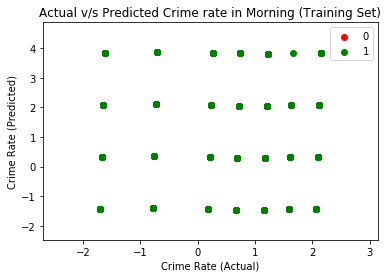

In [90]:
Plot_Graphs(xTrain,yTrain,classi_morn,"Actual v/s Predicted Crime rate in Morning (Training Set)")

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


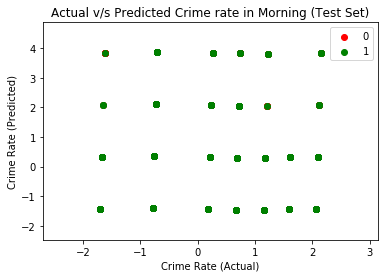

In [91]:
Plot_Graphs(xTest,yTest,classi_morn,"Actual v/s Predicted Crime rate in Morning (Test Set)")

### Afternoon Analysis

In [92]:
nb2 = final_data.copy()

In [93]:
dn1 = nb2.drop(['ComplaintID','Date','Time','TimeIn','Offence Code' , 'Status', 'Internal Code', 'Internal Description', \
         'Jurisdiction', 'Precinct Area', 'Premise Description', 'X-coord', 'Y-coord', 'Latitude', 'Longitude', \
         'Lat_Lon', 'Morning','Evening','Night'],axis=1)
labele_x = LabelEncoder()
dn1['Description'] = labele_x.fit_transform(dn1['Description'])
dn1['Offence Level'] = labele_x.fit_transform(dn1['Offence Level'])
dn1['Borough'] = labele_x.fit_transform(dn1['Borough'])
dn1['Location'] = labele_x.fit_transform(dn1['Location'])
dn1['Afternoon'] = labele_x.fit_transform(dn1['Afternoon'])


X_noon = dn1.iloc[:, 0:4].values
Y_noon = dn1.iloc[:, 4].values

split_data_noon = P_PCA(X_noon,Y_noon)

xTrain = split_data_noon[0]
xTest = split_data_noon[1]
yTrain = split_data_noon[2]
yTest  = split_data_noon[3]

classi_noon = NB_Model(split_data_noon)

cm = Confusion__Matrix(xTest,yTest,classi_noon)

The Variance is [0.45913837 0.33337156]
Accuracy: 0.7422178988326849

Precision is----
0.0

Confusion Matrix:
[[3052    0]
 [1060    0]]

Error in Classification
0.25778210116731515

Sensitivity:
0.0

Specificity:
1.0

False Positive Rate:
0.0

Precision:
0.0



C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: Und

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


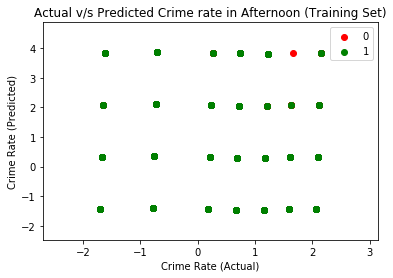

In [94]:
Plot_Graphs(xTrain,yTrain,classi_noon,"Actual v/s Predicted Crime rate in Afternoon (Training Set)")

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


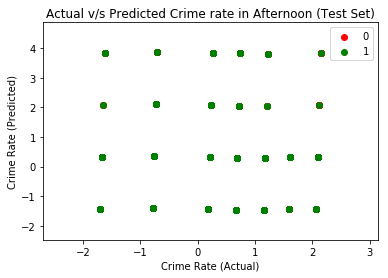

In [95]:
Plot_Graphs(xTest,yTest,classi_noon,"Actual v/s Predicted Crime rate in Afternoon (Test Set)")

### Evening Analysis

In [96]:
nb3 = final_data.copy()

In [97]:
dn2 = nb3.drop(['ComplaintID','Date','Time','TimeIn','Offence Code' , 'Status', 'Internal Code', 'Internal Description', \
         'Jurisdiction', 'Precinct Area', 'Premise Description', 'X-coord', 'Y-coord', 'Latitude', 'Longitude', \
         'Lat_Lon', 'Morning','Afternoon','Night'],axis=1)
labele_x = LabelEncoder()
dn2['Description'] = labele_x.fit_transform(dn2['Description'])
dn2['Offence Level'] = labele_x.fit_transform(dn2['Offence Level'])
dn2['Borough'] = labele_x.fit_transform(dn2['Borough'])
dn2['Location'] = labele_x.fit_transform(dn2['Location'])
dn2['Evening'] = labele_x.fit_transform(dn2['Evening'])


X_eve = dn2.iloc[:, 0:4].values
Y_eve = dn2.iloc[:, 4].values

split_data_eve = P_PCA(X_eve,Y_eve)

xTrain = split_data_eve[0]
xTest = split_data_eve[1]
yTrain = split_data_eve[2]
yTest  = split_data_eve[3]

classi_eve = NB_Model(split_data_eve)

cm = Confusion__Matrix(xTest,yTest,classi_eve)

The Variance is [0.45913837 0.33337156]
Accuracy: 0.8017996108949417

Precision is----
0.0

Confusion Matrix:
[[3297    0]
 [ 815    0]]

Error in Classification
0.19820038910505833

Sensitivity:
0.0

Specificity:
1.0

False Positive Rate:
0.0

Precision:
0.0



C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: Und

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


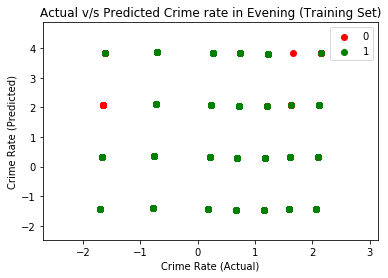

In [98]:
Plot_Graphs(xTrain,yTrain,classi_eve,"Actual v/s Predicted Crime rate in Evening (Training Set)")

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


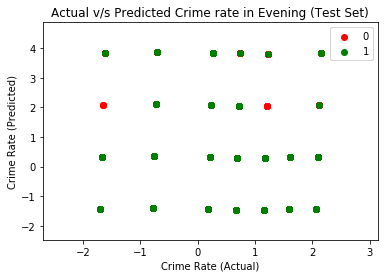

In [99]:
Plot_Graphs(xTest,yTest,classi_eve,"Actual v/s Predicted Crime rate in Evening (Test Set)")

### Night Analysis

In [100]:
nb4 = final_data.copy()

In [102]:
dn3 = nb4.drop(['ComplaintID','Date','Time','TimeIn','Offence Code' , 'Status', 'Internal Code', 'Internal Description', \
         'Jurisdiction', 'Precinct Area', 'Premise Description', 'X-coord', 'Y-coord', 'Latitude', 'Longitude', \
         'Lat_Lon', 'Morning','Evening','Night'],axis=1)
labele_x = LabelEncoder()
dn3['Description'] = labele_x.fit_transform(dn3['Description'])
dn3['Offence Level'] = labele_x.fit_transform(dn3['Offence Level'])
dn3['Borough'] = labele_x.fit_transform(dn3['Borough'])
dn3['Location'] = labele_x.fit_transform(dn3['Location'])
dn3['Afternoon'] = labele_x.fit_transform(dn3['Afternoon'])


X_night = dn3.iloc[:, 0:4].values
Y_night = dn3.iloc[:, 4].values

split_data_night = P_PCA(X_night,Y_night)

xTrain = split_data_night[0]
xTest = split_data_night[1]
yTrain = split_data_night[2]
yTest  = split_data_night[3]

classi_night = NB_Model(split_data_night)

cm = Confusion__Matrix(xTest,yTest,classi_night)

The Variance is [0.45913837 0.33337156]
Accuracy: 0.7422178988326849

Precision is----
0.0

Confusion Matrix:
[[3052    0]
 [1060    0]]

Error in Classification
0.25778210116731515

Sensitivity:
0.0

Specificity:
1.0

False Positive Rate:
0.0

Precision:
0.0



C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Gurjeet Singh\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: Und

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


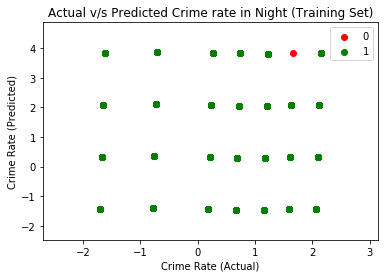

In [103]:
Plot_Graphs(xTrain,yTrain,classi_night,"Actual v/s Predicted Crime rate in Night (Training Set)")

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


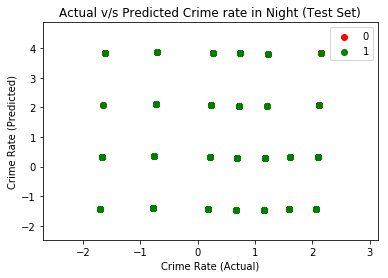

In [104]:
Plot_Graphs(xTest,yTest,classi_night,"Actual v/s Predicted Crime rate in Night (Test Set)")


In [ ]:
# Our data did not plot as expected. This maybe because of the variation in data or because of the classification itself.

In [ ]:
##############End of Analysis################

## Challenges

* While timestamping the data, in order to mask the data we needed for our analysis, like mentioned before, because of the insignificant data through the years 1015-2012, we faced a problem with using the timestamped data in our EDA, hence we had to use them as strings only for the initial analyses.
* Even after removing all the NaNs, we had some data that was in float type, for that we had to create a separate function in order to make it work.

## Future Directions and Improvements

* This project has the potential to expand our analyses by relating this dataset to the housing dataset in NYC. 
* We have just considered three years of data in our analysis. We can extend this to do an analysis of all the years' crime dataset in NYC and compare the results, for a better results.
* Our analyses will help us ballpark the exact location on a map, geographically, in the future and thus help relate the housing and crime at a particualar area better.
* These analyses can also be extended to compute a better crime rate based on the population per area in each borough.

## References

Dataset Main Source: https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Historic/qgea-i56i

Dataset(Kaggle): https://www.kaggle.com/adamschroeder/crimes-new-york-city

Analysis Video: https://flourish.studio/
